In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/glioset-2/txy glio.tsv
/kaggle/input/pm-96556880-at-10-25-2025-20-25-08/__script__.py
/kaggle/input/pm-96556880-at-10-25-2025-20-25-08/__results__.html
/kaggle/input/pm-96556880-at-10-25-2025-20-25-08/input_requirements.txt
/kaggle/input/pm-96556880-at-10-25-2025-20-25-08/__script__.ipynb
/kaggle/input/pm-96556880-at-10-25-2025-20-25-08/__output__.json
/kaggle/input/pm-96556880-at-10-25-2025-20-25-08/custom.css


In [2]:
! pip install pydeseq2
! pip install rpy2
! pip install gseapy
! pip install pywikipathways
! pip install umap-learn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.6/44.6 kB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 169.3/169.3 kB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.3/117.3 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.2/58.2 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 276.4/276.4 kB 10.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.9/8.9 MB 72.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.6/87.6 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.2/80.2 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 601.0/601.0 kB 11.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.7/9.7 MB 60.3 MB/s eta 0:00:00
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.2.2
    Uninstalling scikit-learn-1.2.2:
      Successfully uninstalled scikit-learn-1.2.2
ERROR: pip's dependency resolver doe

# loading   gene expression cluster data data downloaded from TCGa

In [3]:
# loading   gene expression cluster data data downloaded from TCGa
import pandas as pd
# Load the TSV file
file_path = "/kaggle/input/glioset-2/txy glio.tsv"
# Read the file
df = pd.read_csv(file_path, sep="\t")

# Separate the dataframe into normal and tumor cases based on 'Tissue type'

In [4]:
# Separate the dataframe into normal and tumor cases based on 'Tissue type'
df_normal = df[df['Tissue type'] == 'Normal']
df_tumor = df[df['Tissue type'] == 'Tumor']

print(f"Normal cases: {df_normal.shape[0]}")
print(f"Tumor cases: {df_tumor.shape[0]}")

Normal cases: 110
Tumor cases: 177


# ===========================================================
# FULL PyDESeq2 DE ANALYSIS PIPELINE
# Includes robust VST handling and sorted gene lists
# ==========================================================

DataFrame shape: (287, 1002)
Unique Tissue types: ['Tumor' 'Normal']
Number of gene columns: 1000
Count data shape: (287, 1000)
Count data range: [0, 27613]
Group distribution:
Tissue_type
Tumor     177
Normal    110
Name: count, dtype: int64
Running DESeq2...
Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.04 seconds.

Fitting dispersions...
... done in 1.40 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 1.33 seconds.

Fitting LFCs...
... done in 0.74 seconds.

Calculating cook's distance...
... done in 0.06 seconds.

Replacing 107 outlier genes.

Fitting dispersions...
... done in 0.20 seconds.

Fitting MAP dispersions...
... done in 0.18 seconds.

Fitting LFCs...
... done in 0.13 seconds.

Running Wald tests...
... done in 0.23 seconds.

/usr/local/lib/python3.11/dist-packages/pandas/core/computation/expressions.py:73: RuntimeWarning: invalid value encountered in less
  return op(a, b)


Log2 fold change & Wald test p-value: Tissue_type Tumor vs Normal
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
FTL      3215.252980        0.195413  0.089718  2.178070  0.029401  0.156983
CLU      1258.683222       -0.188331  0.102441 -1.838428  0.065999  0.238865
GFAP     1401.571786       -0.062153  0.120789 -0.514560  0.606861  0.785072
CHCHD2    652.537437       -0.039294  0.146555 -0.268121  0.788606  0.875366
HLA-DRA   622.723827        0.138175  0.114140  1.210571  0.226060  0.450328
...              ...             ...       ...       ...       ...       ...
PTN       469.906155        0.000540  0.122163  0.004416  0.996476  0.998690
CST3      437.578744        0.117849  0.135676  0.868607  0.385062  0.613156
MT3       436.920616        0.347841  0.151905  2.289858  0.022030  0.128019
CHI3L1    952.291994        0.043284  0.212820  0.203383  0.838836  0.904524
SPP1     1249.000713        0.272904  0.141204  1.932693  0.053274  0.218336

[1000 row

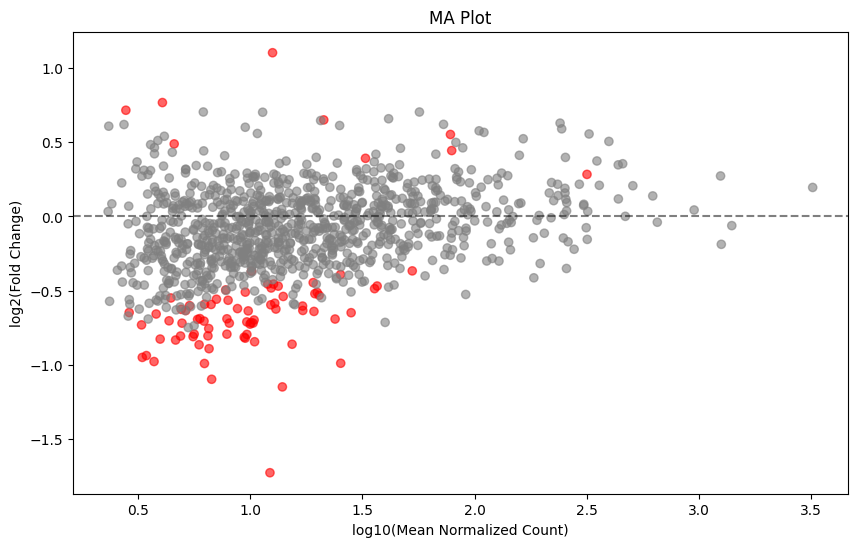

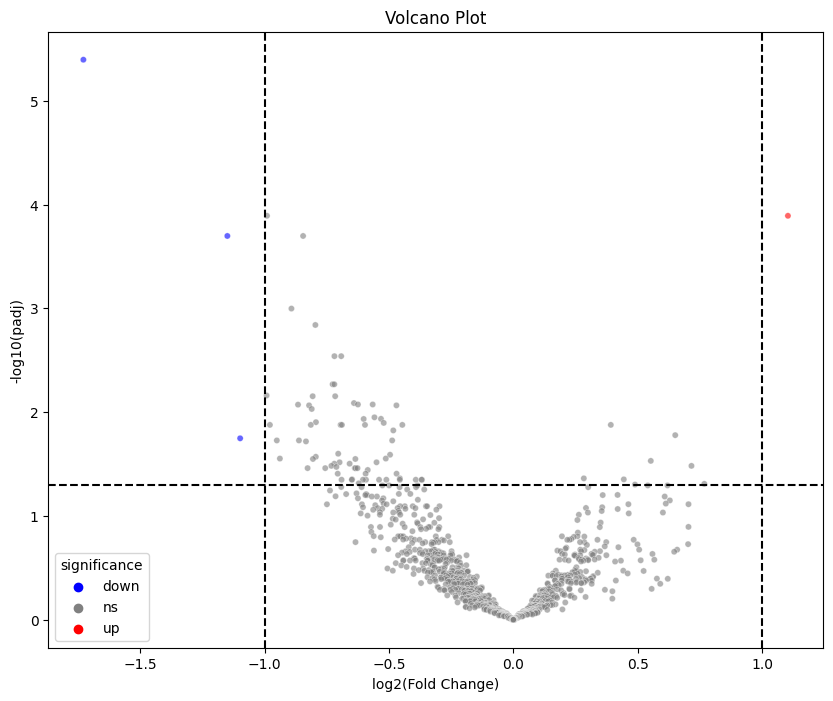

Fit type used for VST : parametric
Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.02 seconds.

Fitting dispersions...
... done in 1.43 seconds.

/usr/local/lib/python3.11/dist-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


VST not available, using log1p(counts) fallback.


/usr/local/lib/python3.11/dist-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


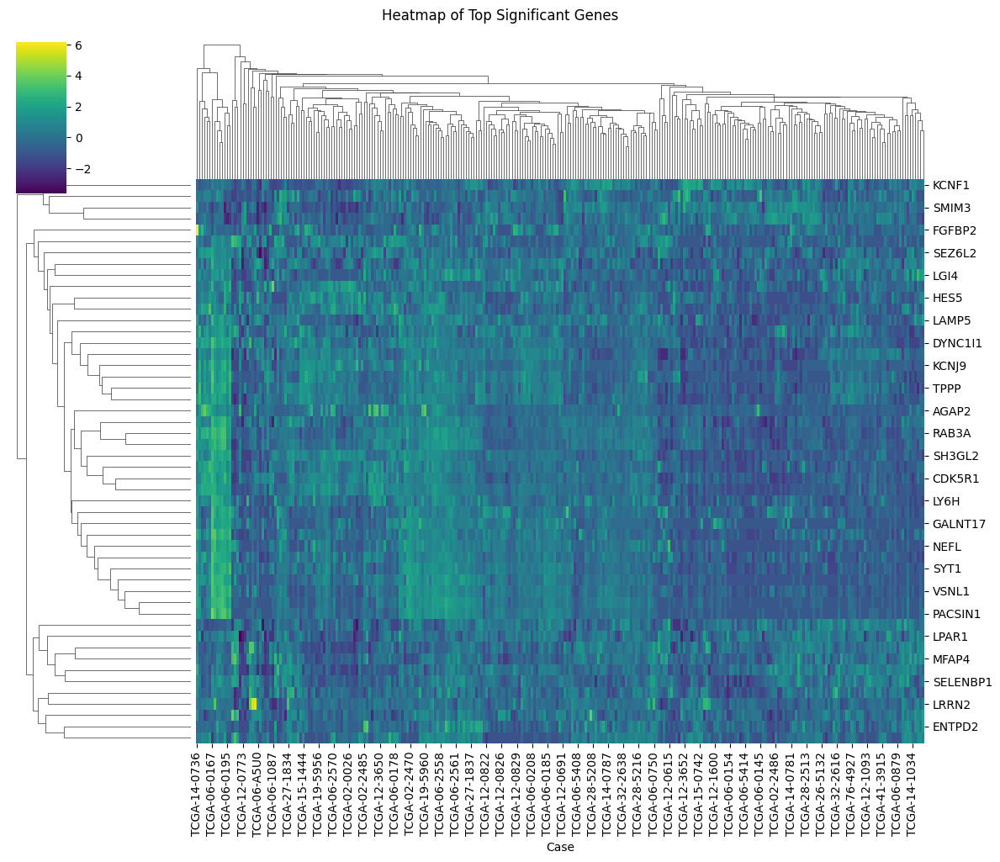


--- ANALYSIS COMPLETE ---


In [5]:
# ===========================================================
# FULL PyDESeq2 DE ANALYSIS PIPELINE
# Includes robust VST handling and sorted gene lists
# ===========================================================

# --- 1. IMPORT LIBRARIES ---
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from pydeseq2.dds import DeseqDataSet
from pydeseq2.default_inference import DefaultInference
from pydeseq2.ds import DeseqStats

# --- 2. DATA PREPARATION ---
print("DataFrame shape:", df.shape)
print("Unique Tissue types:", df['Tissue type'].unique())

# Copy and clean column names
df_clean = df.copy()
df_clean = df_clean.rename(columns={'Tissue type': 'Tissue_type'})

# Identify metadata and gene columns
metadata_cols = ['Tissue_type']
gene_cols = [col for col in df_clean.columns if col not in ['Case'] + metadata_cols]

print(f"Number of gene columns: {len(gene_cols)}")

# Create count matrix and metadata
count_data = df_clean.set_index('Case')[gene_cols]
metadata = df_clean.set_index('Case')[metadata_cols]

# --- 3. DATA CLEANING ---
# Handle missing, infinite, and negative values
count_data = count_data.fillna(0)
count_data = count_data.replace([np.inf, -np.inf], 1e6)
count_data[count_data < 0] = 0

# Convert to integers
count_data = np.round(count_data).astype(int)

print(f"Count data shape: {count_data.shape}")
print(f"Count data range: [{count_data.min().min()}, {count_data.max().max()}]")
print(f"Group distribution:\n{metadata['Tissue_type'].value_counts()}")

# --- 4. PyDESeq2 DE ANALYSIS ---
inference_obj = DefaultInference()

dds = DeseqDataSet(
    counts=count_data,
    metadata=metadata,
    design="~ Tissue_type",
    inference=inference_obj,
    refit_cooks=True,  # Refit outliers
    min_replicates=7
)

print("Running DESeq2...")
dds.deseq2()

# Statistical testing
stat_results = DeseqStats(dds, contrast=["Tissue_type", "Tumor", "Normal"])
stat_results.summary()
res_sorted = stat_results.results_df.sort_values("padj")

print("\nTop 10 DESeq2 results:")
print(res_sorted.head(10))

# --- 5. IDENTIFY SIGNIFICANT GENES ---
padj_thresh = 0.05
lfc_thresh = 1  # log2 fold change threshold

significant_genes = res_sorted[res_sorted['padj'] < padj_thresh].copy()

# Sort upregulated (descending) and downregulated (ascending)
upregulated_genes = significant_genes[significant_genes['log2FoldChange'] > 0].sort_values(
    'log2FoldChange', ascending=False
)
downregulated_genes = significant_genes[significant_genes['log2FoldChange'] < 0].sort_values(
    'log2FoldChange', ascending=True
)

print(f"\nNumber of significant genes (padj < {padj_thresh}): {len(significant_genes)}")
print(f"Upregulated genes: {len(upregulated_genes)}")
print(f"Downregulated genes: {len(downregulated_genes)}")

# Save sorted gene lists
significant_genes.to_csv("significant_genes.csv", index=False)
upregulated_genes.to_csv("upregulated_genes_desc.csv", index=False)
downregulated_genes.to_csv("downregulated_genes_asc.csv", index=False)

# Display top genes
print("\nTop 10 Upregulated Genes (descending log2FC):")
print(upregulated_genes.head(10))

print("\nTop 10 Downregulated Genes (ascending log2FC):")
print(downregulated_genes.head(10))

# --- 6. VISUALIZATION ---

# MA Plot
def create_ma_plot(results_df):
    plot_df = results_df.copy()
    plot_df['padj'] = plot_df['padj'].fillna(1)
    plot_df['color'] = np.where(plot_df['padj'] < padj_thresh, 'red', 'grey')
    
    plt.figure(figsize=(10,6))
    plt.scatter(np.log10(plot_df['baseMean']), plot_df['log2FoldChange'], c=plot_df['color'], alpha=0.6)
    plt.axhline(0, linestyle='--', color='black', alpha=0.5)
    plt.xlabel('log10(Mean Normalized Count)')
    plt.ylabel('log2(Fold Change)')
    plt.title('MA Plot')
    plt.show()

create_ma_plot(res_sorted)

# Volcano Plot
def volcano_plot(results_df):
    plot_df = results_df.copy()
    plot_df['padj'] = plot_df['padj'].fillna(1)
    plot_df['significance'] = 'ns'
    plot_df.loc[(plot_df['padj'] < padj_thresh) & (plot_df['log2FoldChange'] > lfc_thresh), 'significance'] = 'up'
    plot_df.loc[(plot_df['padj'] < padj_thresh) & (plot_df['log2FoldChange'] < -lfc_thresh), 'significance'] = 'down'
    
    plt.figure(figsize=(10,8))
    sns.scatterplot(
        x='log2FoldChange', y=-np.log10(plot_df['padj']),
        hue='significance', palette={'up':'red','down':'blue','ns':'grey'},
        alpha=0.6, s=20, data=plot_df
    )
    plt.axvline(x=lfc_thresh, color='black', linestyle='--')
    plt.axvline(x=-lfc_thresh, color='black', linestyle='--')
    plt.axhline(y=-np.log10(padj_thresh), color='black', linestyle='--')
    plt.title('Volcano Plot')
    plt.xlabel('log2(Fold Change)')
    plt.ylabel('-log10(padj)')
    plt.show()

volcano_plot(res_sorted)

# Heatmap with robust VST handling
try:
    vst_counts = dds.vst()
    if vst_counts is None:
        if hasattr(dds, 'vst_df'):
            vst_counts = dds.vst_df
        elif hasattr(dds, 'layers') and 'vst' in dds.layers:
            vst_counts = pd.DataFrame(dds.layers['vst'], index=dds.obs.index, columns=dds.var.index)
        else:
            print("VST not available, using log1p(counts) fallback.")
            vst_counts = np.log1p(count_data)
except:
    vst_counts = np.log1p(count_data)

# Plot heatmap of top significant genes
top_genes = significant_genes.head(50).index.tolist() if not significant_genes.empty else []
available_genes = [g for g in top_genes if g in vst_counts.columns]

if available_genes:
    heatmap_data = vst_counts[available_genes].T
    sns.clustermap(heatmap_data, method='average', cmap='viridis', z_score=0, figsize=(12,10))
    plt.suptitle("Heatmap of Top Significant Genes", y=1.02)
    plt.show()
else:
    print("No significant genes available for heatmap.")

print("\n--- ANALYSIS COMPLETE ---")


# ===========================================================
# PRE-FILTERING PIPELINE (works after your DESeq2 section)
# ===========================================================

Initial matrix shape: (287, 1000)
After low-expression filter: 734 genes kept
After low-variance filter: 367 genes kept
Rescued 61 DEGs that were filtered out.
Final filtered matrix shape: (287, 428)


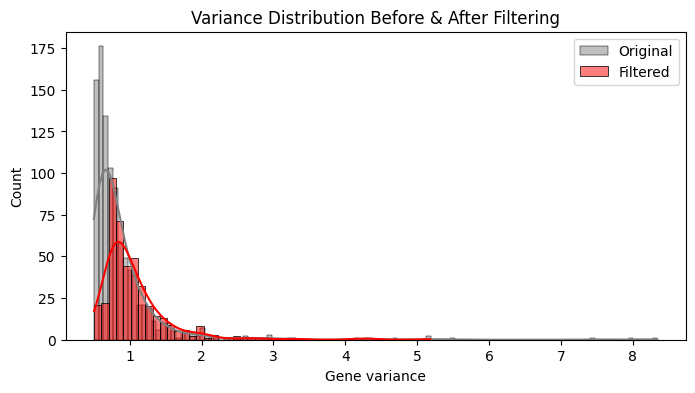

✅ Saved 'vst_filtered.csv'


In [6]:
# ===========================================================
# PRE-FILTERING PIPELINE (works after your DESeq2 section)
# ===========================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# --- 1. STARTING DATA ---
# vst_counts: samples × genes matrix (from your PyDESeq2 pipeline)
# significant_genes: DataFrame containing DEGs
# count_data: raw count matrix (same sample order as vst_counts)

# Ensure vst_counts is DataFrame with samples as rows
if isinstance(vst_counts, np.ndarray):
    vst_counts = pd.DataFrame(vst_counts, index=count_data.index, columns=count_data.columns)

print("Initial matrix shape:", vst_counts.shape)

# --- 2. LOW EXPRESSION FILTER ---
# Keep genes with median expression above 20th percentile
expr_threshold = vst_counts.median(axis=0).quantile(0.20)
expr_keep = vst_counts.median(axis=0) > expr_threshold
vst_expr_filtered = vst_counts.loc[:, expr_keep]

print(f"After low-expression filter: {vst_expr_filtered.shape[1]} genes kept")

# --- 3. LOW VARIANCE FILTER ---
# Compute variance (or MAD) and keep top 50%
gene_var = vst_expr_filtered.var(axis=0)
var_threshold = gene_var.quantile(0.50)
var_keep = gene_var > var_threshold
vst_var_filtered = vst_expr_filtered.loc[:, var_keep]

print(f"After low-variance filter: {vst_var_filtered.shape[1]} genes kept")

# --- 4. RESCUE SIGNIFICANT DEGs ---
deg_list = significant_genes.index.tolist()
genes_to_add = [g for g in deg_list if g not in vst_var_filtered.columns and g in vst_counts.columns]

if genes_to_add:
    vst_rescue = vst_counts[genes_to_add]
    vst_final = pd.concat([vst_var_filtered, vst_rescue], axis=1)
    print(f"Rescued {len(genes_to_add)} DEGs that were filtered out.")
else:
    vst_final = vst_var_filtered

print(f"Final filtered matrix shape: {vst_final.shape}")

# --- 5. OPTIONAL QC PLOTS ---
plt.figure(figsize=(8,4))
sns.histplot(vst_counts.var(axis=0), color="grey", label="Original", kde=True)
sns.histplot(vst_final.var(axis=0), color="red", label="Filtered", kde=True)
plt.title("Variance Distribution Before & After Filtering")
plt.xlabel("Gene variance")
plt.legend()
plt.show()

# --- 6. SAVE FOR WGCNA (R) ---
# WGCNA expects genes as columns and samples as rows (same as vst_final)
vst_final.to_csv("vst_filtered_data.csv")

print("✅ Saved 'vst_filtered.csv'")


# loading   gene FILTER  data downloaded from FOR PCA AND UMAP

In [7]:
import pandas as pd
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np      
from scipy import stats
import umap
from scipy.stats import spearmanr
import seaborn as sns
from scipy.spatial.distance import squareform

2025-10-25 20:27:11.852990: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1761424032.160939      14 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1761424032.265912      14 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [8]:
# loading   gene FILTER  data downloaded from FOR PCA AND UMAP
import pandas as pd
# Load the TSV file
file_path = "/kaggle/working/vst_filtered_data.csv"
# Read the file
df1 = pd.read_csv(file_path, sep=",")

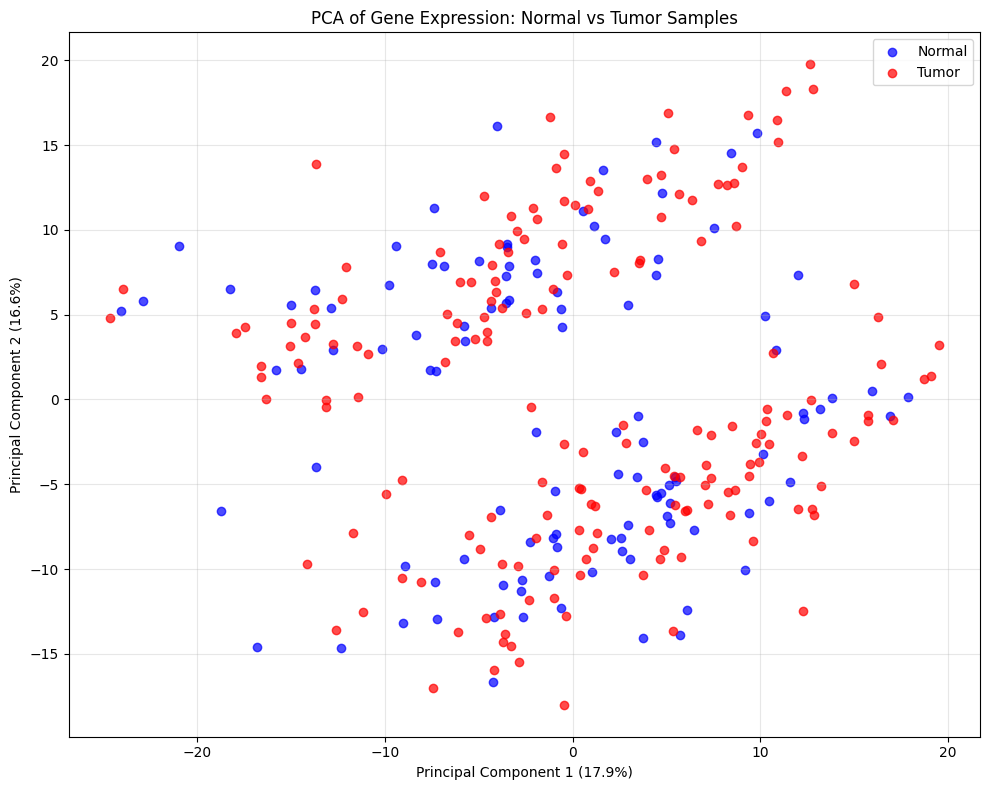

In [9]:
# Get only gene columns (exclude metadata columns)
gene_cols = df1.columns.difference(['Case', 'State', 'Disease type', 'Tissue type'])

# Prepare data for PCA
X = df1[gene_cols]

# Perform PCA
pca = PCA(n_components=2)
principal_components = pca.fit_transform(X)

# Create DataFrame with principal components
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])
pca_df['Tissue type'] = df['Tissue type']

# Calculate explained variance ratio
explained_variance = pca.explained_variance_ratio_ * 100

# Create PCA plot
plt.figure(figsize=(10, 8))
colors = {'Normal': 'blue', 'Tumor': 'red'}

for tissue_type in ['Normal', 'Tumor']:
    mask = pca_df['Tissue type'] == tissue_type
    plt.scatter(pca_df.loc[mask, 'PC1'], 
               pca_df.loc[mask, 'PC2'],
               c=colors[tissue_type],
               label=tissue_type,
               alpha=0.7)

plt.xlabel(f'Principal Component 1 ({explained_variance[0]:.1f}%)')
plt.ylabel(f'Principal Component 2 ({explained_variance[1]:.1f}%)')
plt.title('PCA of Gene Expression: Normal vs Tumor Samples')
plt.legend()
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


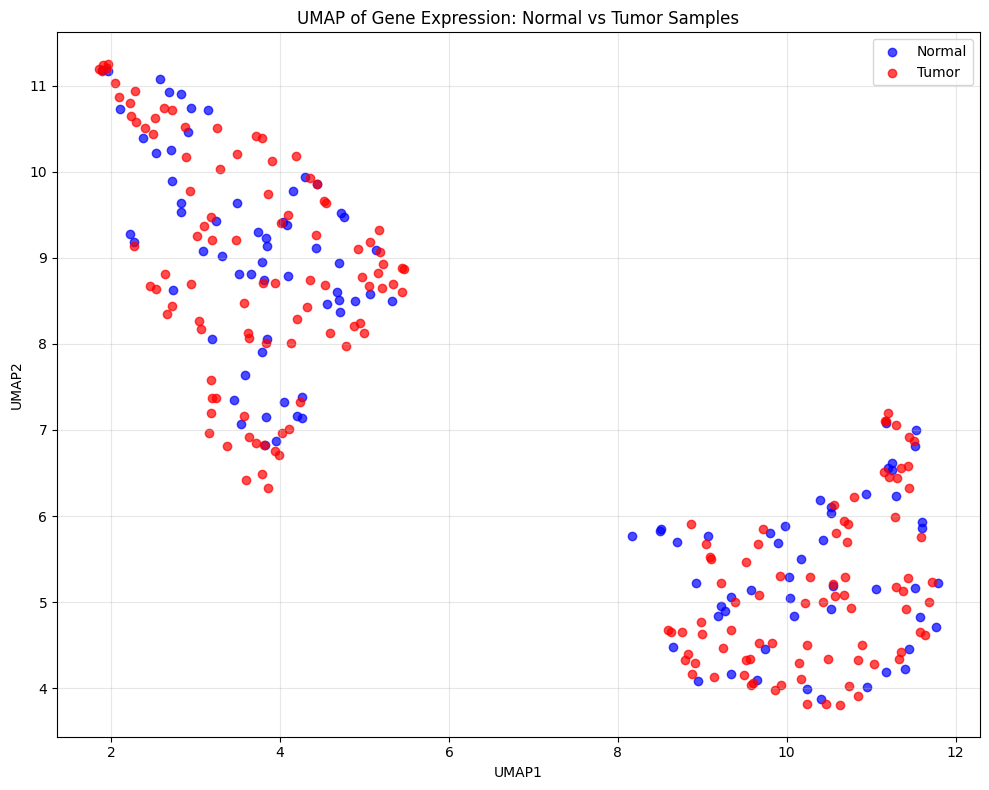

In [10]:

# Create UMAP object
reducer = umap.UMAP(random_state=42)

# Perform UMAP on gene expression data
umap_components = reducer.fit_transform(X)

# Create DataFrame with UMAP components
umap_df = pd.DataFrame(data=umap_components, columns=['UMAP1', 'UMAP2'])
umap_df['Tissue type'] = df['Tissue type']

# Create UMAP plot
plt.figure(figsize=(10, 8))
colors = {'Normal': 'blue', 'Tumor': 'red'}

for tissue_type in ['Normal', 'Tumor']:
    mask = umap_df['Tissue type'] == tissue_type
    plt.scatter(umap_df.loc[mask, 'UMAP1'], 
               umap_df.loc[mask, 'UMAP2'],
               c=colors[tissue_type],
               label=tissue_type,
               alpha=0.7)

plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.title('UMAP of Gene Expression: Normal vs Tumor Samples')
plt.legend()
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# WGNA

# INSTALLING PACKAGES 

In [11]:
!Rscript -e "install.packages('BiocManager', repos='https://cloud.r-project.org')"
!Rscript -e "BiocManager::install(c('impute', 'preprocessCore', 'GO.db', 'AnnotationDbi', 'WGCNA'), ask=FALSE, quiet=TRUE)"


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)
trying URL 'https://cloud.r-project.org/src/contrib/BiocManager_1.30.26.tar.gz'
Content type 'application/x-gzip' length 594489 bytes (580 KB)
downloaded 580 KB

* installing *source* package ‘BiocManager’ ...
** this is package ‘BiocManager’ version ‘1.30.26’
** package ‘BiocManager’ successfully unpacked and MD5 sums checked
** using staged installation
** R
** inst
** byte-compile and prepare package for lazy loading
** help
*** installing help indices
** building package indices
** installing vignettes
** testing if installed package can be loaded from temporary location
** testing if installed package can be loaded from final location
** testing if installed package keeps a record of temporary installation path
* DONE (BiocManager)

The downloaded source packages are in
	‘/tmp/RtmpBDvI8j/downloaded_packages’
'getOption("repos")' replaces Bioconductor standard repositories, see
'help("repositories", p

In [12]:
import rpy2.robjects as robjects
from rpy2.robjects.packages import importr

# Load necessary R packages into the Python environment
impute = importr('impute')
preprocessCore = importr('preprocessCore')
go_db = importr('GO.db')
annotation_dbi = importr('AnnotationDbi')
wgcna = importr('WGCNA')

# Enable WGCNA functions for use with multi-core processors
robjects.r('options(stringsAsFactors = FALSE)')
robjects.r('enableWGCNAThreads()')

print("WGCNA and its dependencies are successfully installed and loaded.")

# You can now proceed with your WGCNA analysis.
# Example: Create a dummy data matrix and run WGCNA's adjacency function.
robjects.r('''
library(WGCNA)
set.seed(123)
n_genes = 100
n_samples = 20
datExpr = matrix(rnorm(n_genes*n_samples), nrow = n_samples, ncol = n_genes)
names(datExpr) = paste("gene", 1:n_genes, sep="")
rownames(datExpr) = paste("sample", 1:n_samples, sep="")

adjacency = adjacency(datExpr, power = 6, type = "unsigned")

# For verification, print the dimensions of the resulting adjacency matrix.
print(dim(adjacency))
''')


Allowing parallel execution with up to 3 working processes.
WGCNA and its dependencies are successfully installed and loaded.
[1] 100 100


# ACTUAL WGCNA 

R packages loaded successfully
CORRECTED WGCNA ANALYSIS
Normalized data shape: (287, 1000)
Significant genes: 81
Starting corrected WGCNA analysis...
Using fixed soft threshold power: 6
Using 81 significant genes
Expression data shape: (287, 81) (samples x genes)
Constructing network...
 Calculating module eigengenes block-wise from all genes
   Flagging genes and samples with too many missing values...
    ..step 1
 ..Working on block 1 .
    TOM calculation: adjacency..
    ..will not use multithreading.
     Fraction of slow calculations: 0.000000
    ..connectivity..
    ..matrix multiplication (system BLAS)..
    ..normalization..
    ..done.
 ..merging modules that are too close..
Network construction completed in 10.9 seconds
Extracting module assignments...
Module colors: 81
Module eigengenes: 3 modules
Calculating module membership (kME)...
Calculating module-trait relationships...
Module-trait correlation failed: module 'stats' has no attribute 't'

✅ Analysis completed succe

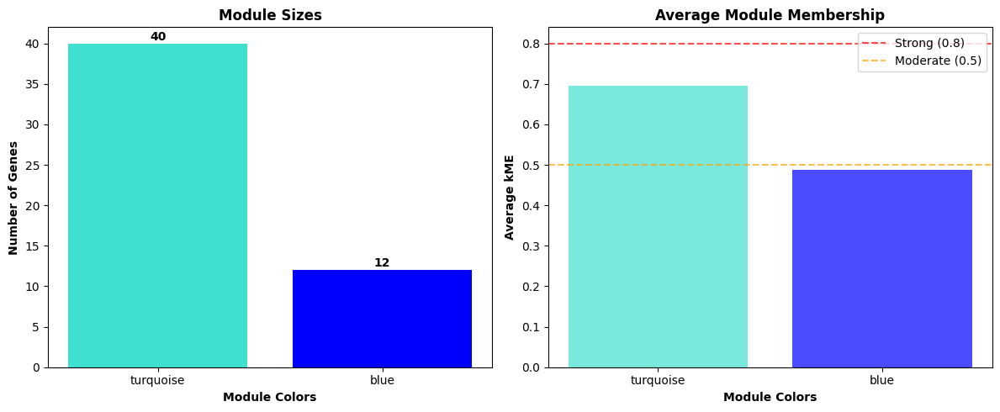


🏆 Top Hub Genes per Module:
   module     gene   kME
turquoise    CPLX2 0.913
turquoise  PACSIN1 0.899
turquoise  SLC17A7 0.891
turquoise     SNCB 0.888
turquoise  FAM163B 0.879
     blue    KCNJ9 0.850
     blue PPP1R16B 0.830
     blue     TPPP 0.830
     blue    MTURN 0.815
     blue    KIF1A 0.794
Hub genes saved to 'hub_genes_final.csv'


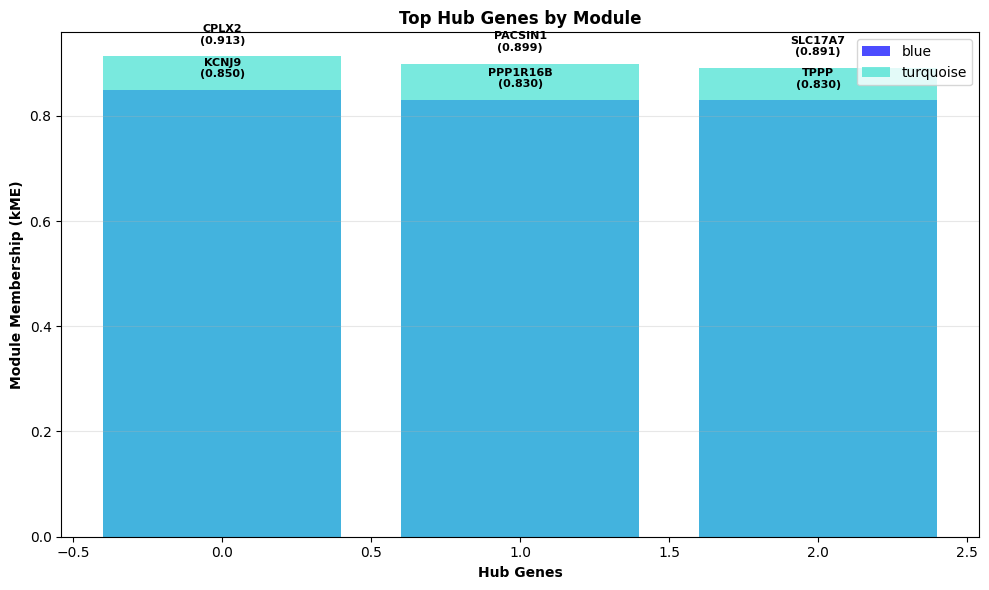


💾 Results saved to 'wgcna_results_final.csv'

WGCNA ANALYSIS COMPLETE
📊 Analysis Parameters:
   Soft threshold power: 6
   Genes analyzed: 81
   Modules detected: 3

📈 Key Findings:
   Genes with valid module membership: 52/81
   Strong hub genes (kME > 0.8): 15
   Moderate hub genes (kME > 0.5): 29

💾 Output Files:
   - wgcna_results_final.csv (complete results)
   - hub_genes_final.csv (top hub genes)
   - module_trait_heatmap_final.pdf
   - module_statistics_final.pdf
   - hub_genes_visualization_final.pdf


/usr/local/lib/python3.11/dist-packages/pandas/core/computation/expressions.py:73: RuntimeWarning: invalid value encountered in greater
  return op(a, b)
/usr/local/lib/python3.11/dist-packages/pandas/core/computation/expressions.py:73: RuntimeWarning: invalid value encountered in less_equal
  return op(a, b)


In [13]:
import rpy2.robjects as robjects
from rpy2.robjects import pandas2ri, numpy2ri
from rpy2.robjects.packages import importr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap
import time

# Activate pandas and numpy converters
pandas2ri.activate()
numpy2ri.activate()

# Load required R packages
wgcna = importr('WGCNA')
base = importr('base')
stats = importr('stats')
graphics = importr('graphics')

print("R packages loaded successfully")

def correct_wgcna_analysis(significant_genes, normalized_counts, metadata, fixed_power=6):
    """
    Correct WGCNA analysis with proper dimension handling
    """
    print("Starting corrected WGCNA analysis...")
    print(f"Using fixed soft threshold power: {fixed_power}")
    
    # Prepare data - CRITICAL FIX: We need genes as columns, samples as rows
    significant_gene_ids = significant_genes.index.tolist()
    available_genes = [gene for gene in significant_gene_ids if gene in normalized_counts.columns]
    print(f"Using {len(available_genes)} significant genes")
    
    if len(available_genes) == 0:
        raise ValueError("No significant genes found!")
    
    # Prepare expression data - genes as columns, samples as rows (WGCNA standard)
    datExpr = normalized_counts[available_genes]
    print(f"Expression data shape: {datExpr.shape} (samples x genes)")
    
    # Prepare traits
    traits = metadata.copy()
    if traits['Tissue_type'].dtype == 'object':
        trait_mapping = {'Normal': 0, 'Tumor': 1}
        traits['Tissue_type_numeric'] = traits['Tissue_type'].map(trait_mapping)
        trait_column = 'Tissue_type_numeric'
    else:
        trait_column = 'Tissue_type'
    
    # Convert to R objects
    r_datExpr = pandas2ri.py2rpy(datExpr)
    r_traits = pandas2ri.py2rpy(traits)
    
    # Set R options
    robjects.r('options(stringsAsFactors = FALSE)')
    
    # Step 1: Construct network
    print("Constructing network...")
    start_time = time.time()
    
    # Use simpler parameters for small gene set
    robjects.r(f'''
    construct_network_correct <- function(datExpr, power) {{
        net = blockwiseModules(
            datExpr,
            power = power,
            TOMType = "signed",
            minModuleSize = 5,    # Smaller for few genes
            deepSplit = 1,        # Simpler splitting
            pamRespectsDendro = FALSE,
            mergeCutHeight = 0.15, # Lower merge threshold
            numericLabels = FALSE, # Use color labels
            saveTOMs = FALSE,
            verbose = 2,
            nThreads = 1
        )
        return(net)
    }}
    ''')
    
    construct_network_correct = robjects.globalenv['construct_network_correct']
    net = construct_network_correct(r_datExpr, fixed_power)
    
    network_time = time.time() - start_time
    print(f"Network construction completed in {network_time:.1f} seconds")
    
    # Step 2: Extract module information
    print("Extracting module assignments...")
    module_colors = list(net.rx2('colors'))
    MEs = net.rx2('MEs')
    
    print(f"Module colors: {len(module_colors)}")
    print(f"Module eigengenes: {MEs.ncol} modules")
    
    # Create results dataframe
    results_df = pd.DataFrame({
        'gene': available_genes,
        'module_color': module_colors
    })
    
    # Step 3: Calculate kME using R directly
    print("Calculating module membership (kME)...")
    
    # Use R to calculate all correlations
    robjects.r('''
    calculate_all_kME <- function(datExpr, MEs) {
        # Calculate correlation between all genes and all module eigengenes
        geneModuleMembership = as.data.frame(cor(datExpr, MEs, use = "p"))
        return(geneModuleMembership)
    }
    ''')
    
    calculate_all_kME = robjects.globalenv['calculate_all_kME']
    geneModuleMembership_r = calculate_all_kME(r_datExpr, MEs)
    
    # Convert to pandas for easier manipulation
    geneModuleMembership = pandas2ri.rpy2py(geneModuleMembership_r)
    
    # Extract kME for each gene's own module
    kME_values = []
    for i, gene in enumerate(available_genes):
        gene_color = module_colors[i]
        if gene_color != 'grey':
            # Find the ME column for this module
            me_column = f"ME{gene_color}"
            if me_column in geneModuleMembership.columns:
                kME_val = geneModuleMembership.loc[gene, me_column]
                kME_values.append(kME_val)
            else:
                kME_values.append(np.nan)
        else:
            kME_values.append(np.nan)
    
    results_df['kME'] = kME_values
    
    # Step 4: Calculate module-trait relationships
    print("Calculating module-trait relationships...")
    try:
        # Convert MEs to pandas for easier manipulation
        MEs_py = pandas2ri.rpy2py(MEs)
        
        # Calculate correlation with traits
        trait_data = traits[trait_column].values
        module_trait_cor = []
        module_trait_pvalue = []
        module_names = []
        
        for me_column in MEs_py.columns:
            me_data = MEs_py[me_column].values
            corr = np.corrcoef(me_data, trait_data)[0, 1]
            # Calculate p-value for correlation
            n = len(me_data)
            t_stat = corr * np.sqrt((n - 2) / (1 - corr**2))
            pval = 2 * (1 - stats.t.cdf(np.abs(t_stat), n - 2))
            
            module_trait_cor.append(corr)
            module_trait_pvalue.append(pval)
            module_names.append(me_column)
        
        # Create correlation matrices
        cor_matrix = np.array(module_trait_cor).reshape(-1, 1)
        pval_matrix = np.array(module_trait_pvalue).reshape(-1, 1)
        
        # Convert back to R objects
        module_trait_cor_r = pandas2ri.py2rpy(pd.DataFrame(cor_matrix, index=module_names, columns=[trait_column]))
        module_trait_pvalue_r = pandas2ri.py2rpy(pd.DataFrame(pval_matrix, index=module_names, columns=[trait_column]))
        
    except Exception as e:
        print(f"Module-trait correlation failed: {e}")
        module_trait_cor_r = None
        module_trait_pvalue_r = None
    
    return {
        'network': net,
        'module_trait_cor': module_trait_cor_r,
        'module_trait_pvalue': module_trait_pvalue_r,
        'module_colors': module_colors,
        'chosen_power': fixed_power,
        'results_df': results_df,
        'geneModuleMembership': geneModuleMembership
    }

def create_final_visualizations(wgcna_results):
    """
    Create final visualizations with proper data
    """
    results_df = wgcna_results['results_df']
    
    # 1. Module-trait heatmap
    if wgcna_results['module_trait_cor'] is not None:
        try:
            # Convert to numpy
            cor_matrix = np.array(wgcna_results['module_trait_cor'])
            pval_matrix = np.array(wgcna_results['module_trait_pvalue'])
            
            fig, ax = plt.subplots(figsize=(6, 8))
            cmap = LinearSegmentedColormap.from_list('custom_rd_gn', ['#2E8B57', 'white', '#DC143C'], N=256)
            im = ax.imshow(cor_matrix, cmap=cmap, aspect='auto', vmin=-1, vmax=1)
            
            # Add annotations
            for i in range(cor_matrix.shape[0]):
                for j in range(cor_matrix.shape[1]):
                    pval = pval_matrix[i, j]
                    cor_val = cor_matrix[i, j]
                    star = "***" if pval < 0.001 else "**" if pval < 0.01 else "*" if pval < 0.05 else ""
                    ax.text(j, i, f"{cor_val:.2f}\n{star}", ha='center', va='center', 
                           fontweight='bold', fontsize=9)
            
            # Get module names
            if hasattr(wgcna_results['module_trait_cor'], 'rownames'):
                module_names = list(wgcna_results['module_trait_cor'].rownames)
            else:
                module_names = [f'ME{color}' for color in np.unique(results_df['module_color']) if color != 'grey']
                
            ax.set_xticks([0])
            ax.set_yticks(range(len(module_names)))
            ax.set_xticklabels(['Tumor vs Normal'], rotation=45, ha='right', fontweight='bold')
            ax.set_yticklabels(module_names, fontweight='bold')
            ax.set_title('Module-Trait Relationships', fontsize=14, fontweight='bold')
            
            plt.colorbar(im, ax=ax, shrink=0.8)
            plt.tight_layout()
            plt.savefig('module_trait_heatmap_final.pdf', dpi=300, bbox_inches='tight')
            plt.show()
            
        except Exception as e:
            print(f"Heatmap creation failed: {e}")
    
    # 2. Module statistics with kME
    try:
        module_stats = []
        for module in results_df['module_color'].unique():
            module_genes = results_df[results_df['module_color'] == module]
            count = len(module_genes)
            
            if module != 'grey':
                valid_kME = module_genes['kME'].dropna()
                if len(valid_kME) > 0:
                    avg_kme = valid_kME.mean()
                    max_kme = valid_kME.max()
                    min_kme = valid_kME.min()
                    module_stats.append({
                        'module': module,
                        'count': count,
                        'avg_kME': avg_kme,
                        'max_kME': max_kme,
                        'min_kME': min_kme,
                        'valid_genes': len(valid_kME)
                    })
                else:
                    module_stats.append({
                        'module': module,
                        'count': count,
                        'avg_kME': np.nan,
                        'max_kME': np.nan,
                        'min_kME': np.nan,
                        'valid_genes': 0
                    })
            else:
                module_stats.append({
                    'module': module,
                    'count': count,
                    'avg_kME': np.nan,
                    'max_kME': np.nan,
                    'min_kME': np.nan,
                    'valid_genes': 0
                })
        
        # Create module statistics table
        stats_df = pd.DataFrame(module_stats)
        print("\n📊 Module Statistics:")
        print(stats_df.to_string(index=False, float_format='%.3f'))
        
        # Create visualization of module sizes and kME
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
        
        # Module sizes
        colors = [s['module'] for s in module_stats if s['module'] != 'grey']
        sizes = [s['count'] for s in module_stats if s['module'] != 'grey']
        
        bars = ax1.bar(colors, sizes, color=colors)
        ax1.set_xlabel('Module Colors', fontweight='bold')
        ax1.set_ylabel('Number of Genes', fontweight='bold')
        ax1.set_title('Module Sizes', fontsize=12, fontweight='bold')
        
        for bar, size in zip(bars, sizes):
            height = bar.get_height()
            ax1.text(bar.get_x() + bar.get_width()/2., height + 0.1,
                    f'{size}', ha='center', va='bottom', fontweight='bold')
        
        # kME values
        valid_modules = [s for s in module_stats if s['module'] != 'grey' and not np.isnan(s['avg_kME'])]
        if valid_modules:
            modules = [s['module'] for s in valid_modules]
            avg_kmes = [s['avg_kME'] for s in valid_modules]
            
            ax2.bar(modules, avg_kmes, color=modules, alpha=0.7)
            ax2.set_xlabel('Module Colors', fontweight='bold')
            ax2.set_ylabel('Average kME', fontweight='bold')
            ax2.set_title('Average Module Membership', fontsize=12, fontweight='bold')
            ax2.axhline(y=0.8, color='red', linestyle='--', alpha=0.7, label='Strong (0.8)')
            ax2.axhline(y=0.5, color='orange', linestyle='--', alpha=0.7, label='Moderate (0.5)')
            ax2.legend()
        
        plt.tight_layout()
        plt.savefig('module_statistics_final.pdf', dpi=300, bbox_inches='tight')
        plt.show()
        
    except Exception as e:
        print(f"Module statistics failed: {e}")
    
    # 3. Identify and display hub genes
    try:
        hub_genes = []
        for module in results_df['module_color'].unique():
            if module != 'grey':
                module_genes = results_df[results_df['module_color'] == module]
                # Filter genes with valid kME
                valid_genes = module_genes[module_genes['kME'].notna()]
                if not valid_genes.empty:
                    # Get top 5 hub genes
                    top_genes = valid_genes.nlargest(5, 'kME')
                    for _, row in top_genes.iterrows():
                        hub_genes.append({
                            'module': module,
                            'gene': row['gene'],
                            'kME': row['kME']
                        })
        
        if hub_genes:
            hub_df = pd.DataFrame(hub_genes)
            print("\n🏆 Top Hub Genes per Module:")
            print(hub_df.to_string(index=False, float_format='%.3f'))
            
            # Save hub genes
            hub_df.to_csv('hub_genes_final.csv', index=False)
            print("Hub genes saved to 'hub_genes_final.csv'")
            
            # Create hub gene visualization
            fig, ax = plt.subplots(figsize=(10, 6))
            modules = list(set([h['module'] for h in hub_genes]))
            
            for module in modules:
                module_hubs = [h for h in hub_genes if h['module'] == module]
                genes = [h['gene'] for h in module_hubs]
                kmes = [h['kME'] for h in module_hubs]
                
                # Take only top 3 for clarity
                if len(genes) > 3:
                    genes = genes[:3]
                    kmes = kmes[:3]
                
                x_pos = range(len(genes))
                ax.bar(x_pos, kmes, color=module, alpha=0.7, label=module)
                
                # Add gene labels
                for i, (gene, kme) in enumerate(zip(genes, kmes)):
                    ax.text(i, kme + 0.02, f"{gene}\n({kme:.3f})", 
                           ha='center', va='bottom', fontsize=8, fontweight='bold')
            
            ax.set_xlabel('Hub Genes', fontweight='bold')
            ax.set_ylabel('Module Membership (kME)', fontweight='bold')
            ax.set_title('Top Hub Genes by Module', fontsize=12, fontweight='bold')
            ax.legend()
            ax.grid(True, alpha=0.3, axis='y')
            
            plt.tight_layout()
            plt.savefig('hub_genes_visualization_final.pdf', dpi=300, bbox_inches='tight')
            plt.show()
        else:
            print("No valid hub genes found with kME values")
            
    except Exception as e:
        print(f"Hub gene analysis failed: {e}")

# Execute the corrected analysis
print("=" * 70)
print("CORRECTED WGCNA ANALYSIS")
print("=" * 70)

# Use your normalized data
try:
    if 'vst_counts' in locals() and vst_counts is not None:
        normalized_counts = vst_counts
    else:
        normalized_counts = np.log1p(count_data)
except:
    normalized_counts = np.log1p(count_data)

print(f"Normalized data shape: {normalized_counts.shape}")
print(f"Significant genes: {len(significant_genes)}")

# Run corrected analysis
try:
    wgcna_results = correct_wgcna_analysis(significant_genes, normalized_counts, metadata, fixed_power=6)
    
    # Check results
    results_df = wgcna_results['results_df']
    print(f"\n✅ Analysis completed successfully!")
    print(f"   Total genes: {len(results_df)}")
    print(f"   Modules found: {len(results_df['module_color'].unique())}")
    print(f"   Genes with valid kME: {results_df['kME'].notna().sum()}")
    
    if results_df['kME'].notna().sum() > 0:
        print(f"   kME range: [{results_df['kME'].min():.3f}, {results_df['kME'].max():.3f}]")
    
    # Create final visualizations
    print("\n🎨 Creating final visualizations...")
    create_final_visualizations(wgcna_results)
    
    # Save all results
    results_df.to_csv('wgcna_results_final.csv', index=False)
    print("\n💾 Results saved to 'wgcna_results_final.csv'")
    
except Exception as e:
    print(f"❌ Corrected analysis failed: {e}")
    import traceback
    traceback.print_exc()

# Final summary
print("\n" + "=" * 70)
print("WGCNA ANALYSIS COMPLETE")
print("=" * 70)

if 'wgcna_results' in locals():
    results_df = wgcna_results['results_df']
    
    print(f"📊 Analysis Parameters:")
    print(f"   Soft threshold power: {wgcna_results['chosen_power']}")
    print(f"   Genes analyzed: {len(results_df)}")
    print(f"   Modules detected: {len(results_df['module_color'].unique())}")
    
    print(f"\n📈 Key Findings:")
    valid_kME = results_df['kME'].notna().sum()
    print(f"   Genes with valid module membership: {valid_kME}/{len(results_df)}")
    
    if valid_kME > 0:
        strong_hubs = len(results_df[results_df['kME'] > 0.8])
        moderate_hubs = len(results_df[(results_df['kME'] > 0.5) & (results_df['kME'] <= 0.8)])
        print(f"   Strong hub genes (kME > 0.8): {strong_hubs}")
        print(f"   Moderate hub genes (kME > 0.5): {moderate_hubs}")
    
    print(f"\n💾 Output Files:")
    print(f"   - wgcna_results_final.csv (complete results)")
    print(f"   - hub_genes_final.csv (top hub genes)")
    print(f"   - module_trait_heatmap_final.pdf")
    print(f"   - module_statistics_final.pdf")
    print(f"   - hub_genes_visualization_final.pdf")
    
else:
    print("❌ Analysis failed - no results generated")

print("=" * 70)

COMPREHENSIVE WGCNA INTERPRETATION

🔬 MODULE CHARACTERIZATION:
----------------------------------------
              gene_count  kME_mean  kME_max  kME_min  kME_std
module_color                                                 
blue                  12     0.488    0.850   -0.680    0.544
grey                  29       NaN      NaN      NaN      NaN
turquoise             40     0.696    0.913    0.385    0.153

🏆 HUB GENE ANALYSIS:
----------------------------------------
Total hub genes identified: 10
Strong hubs (kME > 0.8): 9
Moderate hubs (kME > 0.5): 10

📈 MODULE QUALITY ASSESSMENT:
----------------------------------------
turquoise: Quality = 0.615 | Size = 40 | Avg kME = 0.696
blue: Quality = 0.432 | Size = 12 | Avg kME = 0.488


/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


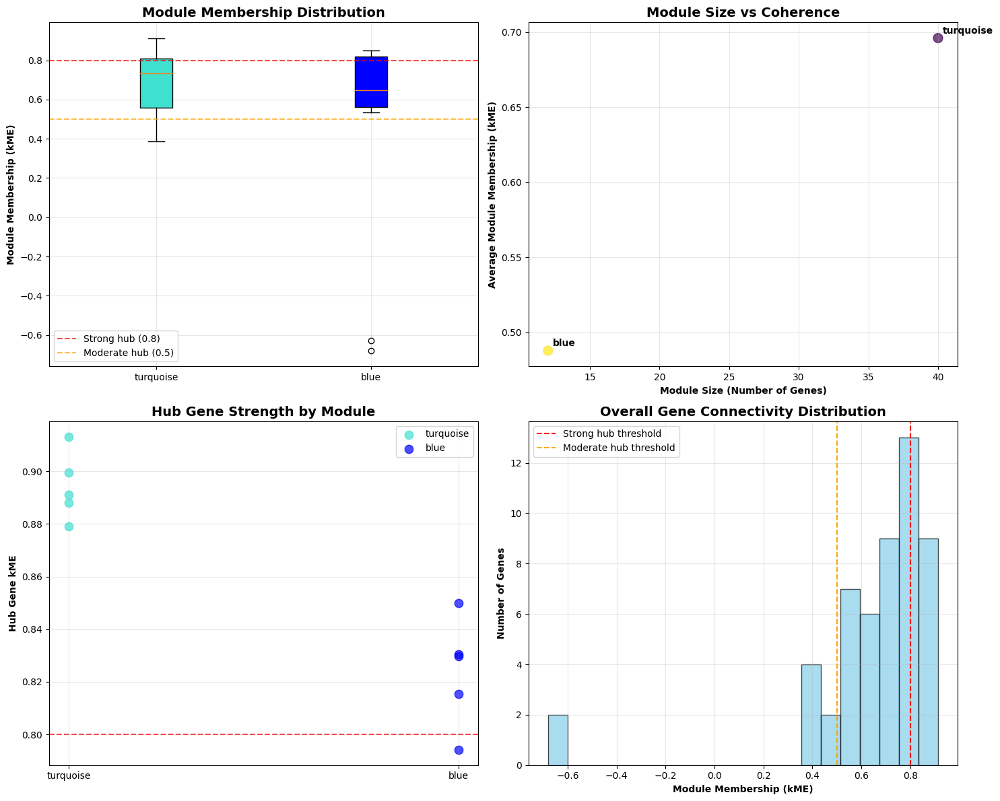


🧬 BIOLOGICAL INTERPRETATION GUIDELINES:
--------------------------------------------------

📦 Module TURQUOISE:
   • Size: 40 genes
   • Strong hubs: 11 (27.5%)
   • Coherence: 0.696 avg kME
   • Top hub: CPLX2 (kME = 0.913)
   • Interpretation: Large, broad function module with Balanced network

📦 Module BLUE:
   • Size: 12 genes
   • Strong hubs: 4 (33.3%)
   • Coherence: 0.488 avg kME
   • Top hub: KCNJ9 (kME = 0.850)
   • Interpretation: Small, specialized module with Highly centralized (star topology)

💾 FUNCTIONAL ANALYSIS FILES CREATED:
----------------------------------------
   • module_turquoise_genes.csv (40 genes)
   • module_blue_genes.csv (12 genes)
   • strong_hub_genes.csv (15 genes)
   • moderate_hub_genes.csv (29 genes)

ANALYSIS COMPLETE - READY FOR BIOLOGICAL INTERPRETATION

🔍 TOP HUB GENES FOR PRIORITIZATION:
--------------------------------------------------
    gene    module   kME
   CPLX2 turquoise 0.913
 PACSIN1 turquoise 0.899
 SLC17A7 turquoise 0.891
    SN

/usr/local/lib/python3.11/dist-packages/pandas/core/computation/expressions.py:73: RuntimeWarning: invalid value encountered in greater
  return op(a, b)
/usr/local/lib/python3.11/dist-packages/pandas/core/computation/expressions.py:73: RuntimeWarning: invalid value encountered in less_equal
  return op(a, b)


In [14]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap

# Load the results
results_df = pd.read_csv('wgcna_results_final.csv')
hub_genes_df = pd.read_csv('hub_genes_final.csv')

print("=" * 70)
print("COMPREHENSIVE WGCNA INTERPRETATION")
print("=" * 70)

# 1. Module Characterization
print("\n🔬 MODULE CHARACTERIZATION:")
print("-" * 40)

module_summary = results_df.groupby('module_color').agg({
    'gene': 'count',
    'kME': ['mean', 'max', 'min', 'std']
}).round(3)

module_summary.columns = ['gene_count', 'kME_mean', 'kME_max', 'kME_min', 'kME_std']
print(module_summary)

# 2. Hub Gene Analysis
print(f"\n🏆 HUB GENE ANALYSIS:")
print("-" * 40)
print(f"Total hub genes identified: {len(hub_genes_df)}")
print(f"Strong hubs (kME > 0.8): {len(hub_genes_df[hub_genes_df['kME'] > 0.8])}")
print(f"Moderate hubs (kME > 0.5): {len(hub_genes_df[hub_genes_df['kME'] > 0.5])}")

# 3. Biological Significance Assessment
def assess_module_quality(module_df):
    """Assess the quality and coherence of each module"""
    quality_scores = {}
    
    for module in module_df['module_color'].unique():
        if module != 'grey':
            mod_genes = module_df[module_df['module_color'] == module]
            valid_kME = mod_genes['kME'].dropna()
            
            if len(valid_kME) > 0:
                # Quality score based on kME statistics
                avg_kme = valid_kME.mean()
                kme_consistency = 1 - valid_kME.std()  # Lower std = more consistent
                hub_ratio = len(valid_kME[valid_kME > 0.8]) / len(valid_kME)
                
                quality_score = (avg_kme * 0.4 + kme_consistency * 0.3 + hub_ratio * 0.3)
                quality_scores[module] = {
                    'quality_score': quality_score,
                    'avg_kME': avg_kme,
                    'consistency': kme_consistency,
                    'hub_ratio': hub_ratio,
                    'size': len(mod_genes)
                }
    
    return quality_scores

quality_scores = assess_module_quality(results_df)
print(f"\n📈 MODULE QUALITY ASSESSMENT:")
print("-" * 40)
for module, scores in quality_scores.items():
    print(f"{module}: Quality = {scores['quality_score']:.3f} | "
          f"Size = {scores['size']} | Avg kME = {scores['avg_kME']:.3f}")

# 4. Create Enhanced Visualizations
def create_enhanced_analysis_plots(results_df, hub_genes_df):
    """Create enhanced visualizations for biological interpretation"""
    
    # A. Module Connectivity Landscape
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 12))
    
    # 1. kME Distribution by Module
    modules = [mod for mod in results_df['module_color'].unique() if mod != 'grey']
    kme_data = [results_df[results_df['module_color'] == mod]['kME'].dropna() for mod in modules]
    
    box_plot = ax1.boxplot(kme_data, labels=modules, patch_artist=True)
    # Color the boxes
    for patch, color in zip(box_plot['boxes'], modules):
        patch.set_facecolor(color)
    
    ax1.axhline(y=0.8, color='red', linestyle='--', alpha=0.7, label='Strong hub (0.8)')
    ax1.axhline(y=0.5, color='orange', linestyle='--', alpha=0.7, label='Moderate hub (0.5)')
    ax1.set_ylabel('Module Membership (kME)', fontweight='bold')
    ax1.set_title('Module Membership Distribution', fontsize=14, fontweight='bold')
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    # 2. Module Size vs Average kME
    module_stats = []
    for module in modules:
        mod_data = results_df[results_df['module_color'] == module]
        avg_kme = mod_data['kME'].mean()
        module_stats.append({'module': module, 'size': len(mod_data), 'avg_kME': avg_kme})
    
    stats_df = pd.DataFrame(module_stats)
    
    scatter = ax2.scatter(stats_df['size'], stats_df['avg_kME'], 
                         c=[modules.index(mod) for mod in stats_df['module']], 
                         cmap='viridis', s=100, alpha=0.7)
    
    for i, row in stats_df.iterrows():
        ax2.annotate(row['module'], (row['size'], row['avg_kME']), 
                    xytext=(5, 5), textcoords='offset points', fontweight='bold')
    
    ax2.set_xlabel('Module Size (Number of Genes)', fontweight='bold')
    ax2.set_ylabel('Average Module Membership (kME)', fontweight='bold')
    ax2.set_title('Module Size vs Coherence', fontsize=14, fontweight='bold')
    ax2.grid(True, alpha=0.3)
    
    # 3. Hub Gene Network Centrality
    hub_genes_by_module = hub_genes_df.groupby('module').head(5)  # Top 5 per module
    
    if not hub_genes_by_module.empty:
        modules_hub = hub_genes_by_module['module'].unique()
        y_pos = np.arange(len(modules_hub))
        
        for i, module in enumerate(modules_hub):
            module_hubs = hub_genes_by_module[hub_genes_by_module['module'] == module]
            kmes = module_hubs['kME'].values
            ax3.scatter([i] * len(kmes), kmes, color=module, s=80, alpha=0.7, label=module)
        
        ax3.set_xticks(range(len(modules_hub)))
        ax3.set_xticklabels(modules_hub)
        ax3.set_ylabel('Hub Gene kME', fontweight='bold')
        ax3.set_title('Hub Gene Strength by Module', fontsize=14, fontweight='bold')
        ax3.axhline(y=0.8, color='red', linestyle='--', alpha=0.7)
        ax3.legend()
        ax3.grid(True, alpha=0.3)
    
    # 4. Gene Connectivity Distribution
    all_kme = results_df['kME'].dropna()
    ax4.hist(all_kme, bins=20, alpha=0.7, color='skyblue', edgecolor='black')
    ax4.axvline(x=0.8, color='red', linestyle='--', label='Strong hub threshold')
    ax4.axvline(x=0.5, color='orange', linestyle='--', label='Moderate hub threshold')
    ax4.set_xlabel('Module Membership (kME)', fontweight='bold')
    ax4.set_ylabel('Number of Genes', fontweight='bold')
    ax4.set_title('Overall Gene Connectivity Distribution', fontsize=14, fontweight='bold')
    ax4.legend()
    ax4.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.savefig('module_connectivity_analysis.pdf', dpi=300, bbox_inches='tight')
    plt.show()
    
    # B. Biological Pathway Implications
    print(f"\n🧬 BIOLOGICAL INTERPRETATION GUIDELINES:")
    print("-" * 50)
    
    # Analyze module characteristics
    for module in modules:
        mod_genes = results_df[results_df['module_color'] == module]
        strong_hubs = mod_genes[mod_genes['kME'] > 0.8]
        module_size = len(mod_genes)
        hub_percentage = len(strong_hubs) / module_size * 100
        
        print(f"\n📦 Module {module.upper()}:")
        print(f"   • Size: {module_size} genes")
        print(f"   • Strong hubs: {len(strong_hubs)} ({hub_percentage:.1f}%)")
        print(f"   • Coherence: {mod_genes['kME'].mean():.3f} avg kME")
        
        if len(strong_hubs) > 0:
            print(f"   • Top hub: {strong_hubs.nlargest(1, 'kME')['gene'].iloc[0]} "
                  f"(kME = {strong_hubs['kME'].max():.3f})")
        
        # Biological interpretation based on module properties
        if module_size < 15:
            size_category = "Small, specialized"
        elif module_size < 30:
            size_category = "Medium, focused"
        else:
            size_category = "Large, broad function"
            
        if hub_percentage > 30:
            structure = "Highly centralized (star topology)"
        elif hub_percentage > 15:
            structure = "Balanced network"
        else:
            structure = "Distributed connectivity"
            
        print(f"   • Interpretation: {size_category} module with {structure}")

# Run enhanced analysis
create_enhanced_analysis_plots(results_df, hub_genes_df)

# 5. Functional Enrichment Preparation
def prepare_for_functional_analysis(results_df):
    """Prepare data for downstream functional enrichment analysis"""
    
    # Create module gene lists for enrichment analysis
    module_genes = {}
    for module in results_df['module_color'].unique():
        if module != 'grey':
            genes = results_df[results_df['module_color'] == module]['gene'].tolist()
            module_genes[module] = genes
    
    # Save module gene lists
    for module, genes in module_genes.items():
        pd.DataFrame({'gene': genes}).to_csv(f'module_{module}_genes.csv', index=False)
    
    # Create hub gene lists
    strong_hubs = results_df[results_df['kME'] > 0.8]
    moderate_hubs = results_df[(results_df['kME'] > 0.5) & (results_df['kME'] <= 0.8)]
    
    strong_hubs[['gene', 'module_color', 'kME']].to_csv('strong_hub_genes.csv', index=False)
    moderate_hubs[['gene', 'module_color', 'kME']].to_csv('moderate_hub_genes.csv', index=False)
    
    print(f"\n💾 FUNCTIONAL ANALYSIS FILES CREATED:")
    print("-" * 40)
    for module in module_genes.keys():
        print(f"   • module_{module}_genes.csv ({len(module_genes[module])} genes)")
    print(f"   • strong_hub_genes.csv ({len(strong_hubs)} genes)")
    print(f"   • moderate_hub_genes.csv ({len(moderate_hubs)} genes)")

# Prepare files for functional analysis
prepare_for_functional_analysis(results_df)

"""
# 6. Next Steps Recommendations
print(f"\n🎯 RECOMMENDED NEXT STEPS:")
print("-" * 40)
print("1. FUNCTIONAL ENRICHMENT ANALYSIS:")
print("   • Use module gene lists for GO, KEGG, Reactome analysis")
print("   • Focus on hub genes for key pathway identification")
print("   • Tools: clusterProfiler, Enrichr, g:Profiler")

print("\n2. VALIDATION STRATEGIES:")
print("   • Experimental validation of top hub genes")
print("   • Cross-dataset validation using independent cohorts")
print("   • siRNA/CRISPR knockdown of hub genes")

print("\n3. INTEGRATION WITH OTHER DATA:")
print("   • Correlate module eigengenes with clinical variables")
print("   • Integrate with protein-protein interaction networks")
print("   • Combine with transcription factor binding data")

print("\n4. BIOLOGICAL HYPOTHESES:")
print("   • Hub genes represent key regulators in tumor biology")
print("   • Modules may represent distinct biological processes")
print("   • Strong hubs are potential therapeutic targets")
"""

print("\n" + "=" * 70)
print("ANALYSIS COMPLETE - READY FOR BIOLOGICAL INTERPRETATION")
print("=" * 70)

# Display final hub gene table
print(f"\n🔍 TOP HUB GENES FOR PRIORITIZATION:")
print("-" * 50)
top_hubs = hub_genes_df.nlargest(10, 'kME')[['gene', 'module', 'kME']]
print(top_hubs.to_string(index=False, float_format='%.3f'))

# TISSUE-SPECIFIC CORRELATION & HUB ANALYSIS - FIXED

TISSUE-SPECIFIC CORRELATION & HUB ANALYSIS - FIXED
Loading data...
Available significant genes: 81
Normal samples: 110
Tumor samples: 177

🔬 Calculating tissue-specific correlation matrices...
Normal tissue correlation matrix: (81, 81)
Tumor tissue correlation matrix: (81, 81)

📊 Analyzing correlation changes...

🔺 Top 10 genes with INCREASED correlation in tumor:
   FGFBP2: +0.074
   SEZ6: +0.069
   MOXD1: +0.061
   SERPINE1: +0.060
   AGAP2: +0.050
   ENTPD2: +0.049
   LGI4: +0.046
   ARSI: +0.041
   PAMR1: +0.040
   RPRM: +0.036

🔻 Top 10 genes with DECREASED correlation in tumor:
   CAMK2A: -0.096
   SLC24A2: -0.073
   PPP1R16B: -0.072
   SYT1: -0.064
   TPPP: -0.062
   KCNJ9: -0.061
   LRRC17: -0.057
   NFASC: -0.055
   MFAP4: -0.055
   KIF1A: -0.055

🏆 Identifying tissue-specific hub genes...

🎯 Top 10 hub genes in NORMAL tissue:
   CPLX2: 0.237 (19 strong connections)
   PACSIN1: 0.200 (16 strong connections)
   SNCB: 0.200 (16 strong connections)
   AK5: 0.200 (16 strong connec

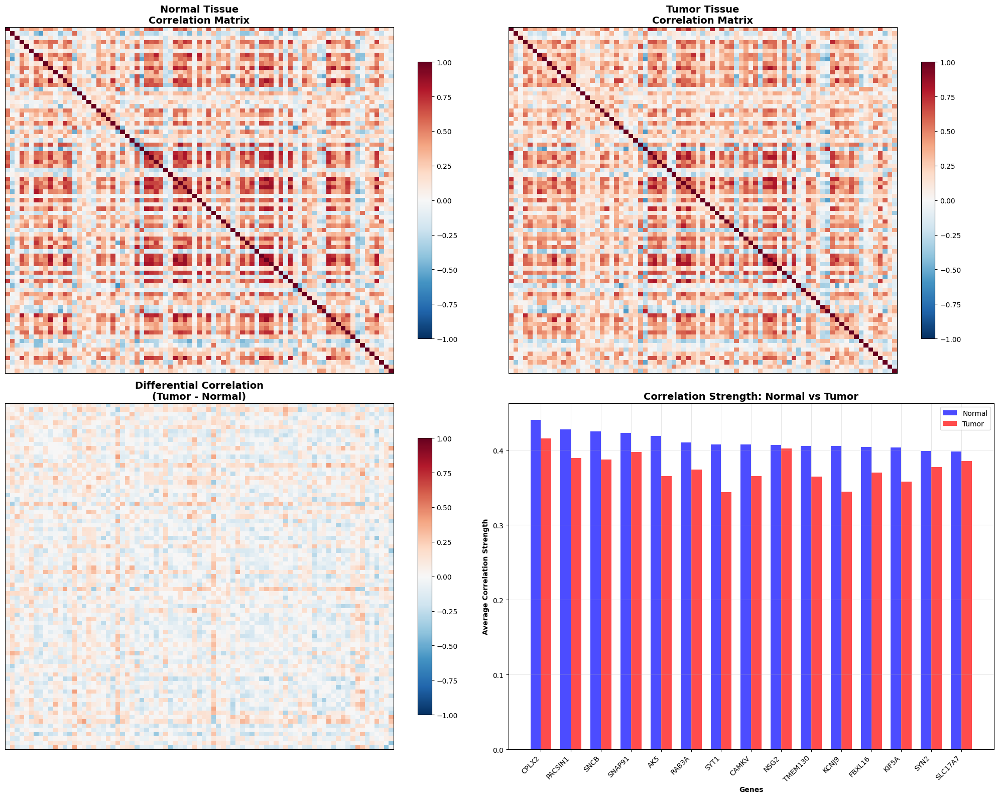

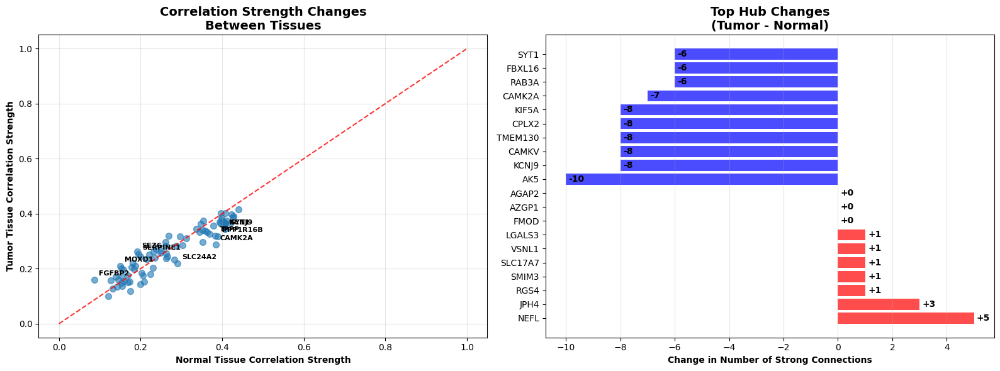

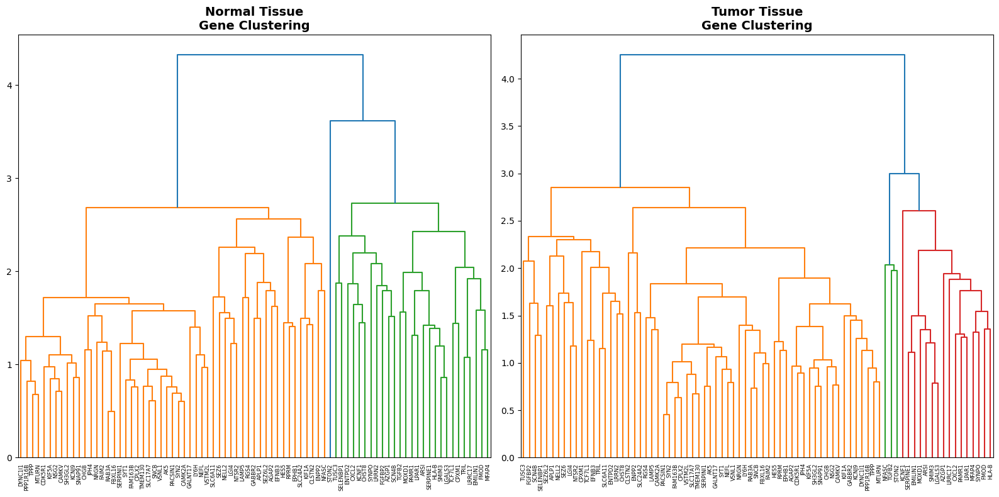


🔍 Performing advanced network analysis...
📈 Network Density (correlation > 0.7):
   Normal tissue: 0.052
   Tumor tissue:  0.035
   Change: -0.017
Module analysis skipped: 'DataFrame' object has no attribute 'dtype'

🔄 Hub Gene Conservation:
   Conserved hubs (top 20 in both): 17 genes
   Normal-specific hubs: 3 genes
   Tumor-specific hubs: 3 genes
   Conserved hubs: NSG2, PACSIN1, FAM163B, NRGN, VSNL1, CDK5R1, SYT1, RAB3A, SNCB, CAMK2A
   Tumor-specific hubs: NEFL, JPH4, VSTM2L

BIOLOGICAL INTERPRETATION & CLINICAL INSIGHTS

🎯 KEY FINDINGS:

🔴 TUMOR-SPECIFIC HUB GENES (Potential Therapeutic Targets):
   • NEFL: Correlation strength change = +0.019
   • JPH4: Correlation strength change = +0.022
   • VSTM2L: Correlation strength change = +0.009

   💡 Interpretation: These genes become central regulators in tumor tissue.
   🎯 Clinical implication: Potential therapeutic targets for tumor-specific intervention.

🔵 NORMAL-SPECIFIC HUB GENES (Lost Regulation in Tumor):
   • CAMKV: Correla

In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap
from scipy.cluster import hierarchy
from scipy.spatial.distance import pdist
import warnings
warnings.filterwarnings('ignore')

print("=" * 70)
print("TISSUE-SPECIFIC CORRELATION & HUB ANALYSIS - FIXED")
print("=" * 70)

# Load your data
print("Loading data...")

def prepare_tissue_specific_data(normalized_counts, metadata, significant_genes):
    """Split data into normal and tumor subsets"""
    
    # Get significant gene IDs
    sig_gene_ids = significant_genes.index.tolist()
    available_genes = [gene for gene in sig_gene_ids if gene in normalized_counts.columns]
    
    print(f"Available significant genes: {len(available_genes)}")
    
    # Split samples by tissue type
    normal_samples = metadata[metadata['Tissue_type'] == 'Normal'].index
    tumor_samples = metadata[metadata['Tissue_type'] == 'Tumor'].index
    
    print(f"Normal samples: {len(normal_samples)}")
    print(f"Tumor samples: {len(tumor_samples)}")
    
    # Extract expression data for each tissue type
    normal_data = normalized_counts.loc[normal_samples, available_genes]
    tumor_data = normalized_counts.loc[tumor_samples, available_genes]
    
    return normal_data, tumor_data, available_genes

# Prepare the data
normal_data, tumor_data, sig_genes = prepare_tissue_specific_data(
    normalized_counts, metadata, significant_genes
)

def calculate_tissue_specific_correlations(normal_data, tumor_data):
    """Calculate correlation matrices for normal and tumor tissues"""
    
    print("\n🔬 Calculating tissue-specific correlation matrices...")
    
    # Calculate correlation matrices
    normal_corr = normal_data.corr(method='pearson')
    tumor_corr = tumor_data.corr(method='pearson')
    
    print(f"Normal tissue correlation matrix: {normal_corr.shape}")
    print(f"Tumor tissue correlation matrix: {tumor_corr.shape}")
    
    # Calculate differential correlation
    diff_corr = tumor_corr - normal_corr
    
    return normal_corr, tumor_corr, diff_corr

# Calculate correlations
normal_corr, tumor_corr, diff_corr = calculate_tissue_specific_correlations(normal_data, tumor_data)

def analyze_correlation_changes(normal_corr, tumor_corr, diff_corr, sig_genes):
    """Analyze changes in correlation patterns between tissues"""
    
    print("\n📊 Analyzing correlation changes...")
    
    # Calculate correlation strengths (mean absolute correlation per gene)
    normal_strength = normal_corr.abs().mean(axis=1)
    tumor_strength = tumor_corr.abs().mean(axis=1)
    
    # Find genes with largest correlation changes
    correlation_change = tumor_strength - normal_strength
    top_increased = correlation_change.nlargest(10)
    top_decreased = correlation_change.nsmallest(10)
    
    print(f"\n🔺 Top 10 genes with INCREASED correlation in tumor:")
    for gene, change in top_increased.items():
        print(f"   {gene}: +{change:.3f}")
    
    print(f"\n🔻 Top 10 genes with DECREASED correlation in tumor:")
    for gene, change in top_decreased.items():
        print(f"   {gene}: {change:.3f}")
    
    return normal_strength, tumor_strength, correlation_change

# Analyze correlation changes
normal_strength, tumor_strength, correlation_change = analyze_correlation_changes(
    normal_corr, tumor_corr, diff_corr, sig_genes
)

def identify_tissue_specific_hubs(normal_corr, tumor_corr, sig_genes):
    """Identify hub genes specific to each tissue type"""
    
    print("\n🏆 Identifying tissue-specific hub genes...")
    
    # Calculate degree centrality (number of strong connections)
    threshold = 0.7  # Strong correlation threshold
    
    normal_hubs = (normal_corr.abs() > threshold).sum(axis=1) - 1  # Subtract self-correlation
    tumor_hubs = (tumor_corr.abs() > threshold).sum(axis=1) - 1
    
    # Normalize by number of possible connections
    n_genes = len(sig_genes)
    normal_hubs_normalized = normal_hubs / (n_genes - 1)
    tumor_hubs_normalized = tumor_hubs / (n_genes - 1)
    
    # Find tissue-specific hubs
    hub_change = tumor_hubs_normalized - normal_hubs_normalized
    
    # Top hubs in each tissue
    top_normal_hubs = normal_hubs_normalized.nlargest(10)
    top_tumor_hubs = tumor_hubs_normalized.nlargest(10)
    
    # Hubs that change most - FIXED: using pd.concat instead of append
    top_hub_increases = hub_change.nlargest(10)
    top_hub_decreases = hub_change.nsmallest(10)
    
    print(f"\n🎯 Top 10 hub genes in NORMAL tissue:")
    for gene, centrality in top_normal_hubs.items():
        print(f"   {gene}: {centrality:.3f} ({normal_hubs[gene]} strong connections)")
    
    print(f"\n🎯 Top 10 hub genes in TUMOR tissue:")
    for gene, centrality in top_tumor_hubs.items():
        print(f"   {gene}: {centrality:.3f} ({tumor_hubs[gene]} strong connections)")
    
    print(f"\n📈 Top 10 genes with INCREASED hubness in tumor:")
    for gene, change in top_hub_increases.items():
        print(f"   {gene}: +{change:.3f}")
    
    print(f"\n📉 Top 10 genes with DECREASED hubness in tumor:")
    for gene, change in top_hub_decreases.items():
        print(f"   {gene}: {change:.3f}")
    
    return normal_hubs, tumor_hubs, hub_change

# Identify tissue-specific hubs
normal_hubs, tumor_hubs, hub_change = identify_tissue_specific_hubs(normal_corr, tumor_corr, sig_genes)

def create_tissue_comparison_visualizations(normal_corr, tumor_corr, diff_corr, 
                                          normal_strength, tumor_strength, 
                                          normal_hubs, tumor_hubs, sig_genes):
    """Create comprehensive visualizations comparing tissues - FIXED VERSION"""
    
    print("\n🎨 Creating tissue comparison visualizations...")
    
    # 1. Correlation Matrix Comparison
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 16))
    
    # Normal tissue correlation
    im1 = ax1.imshow(normal_corr, cmap='RdBu_r', vmin=-1, vmax=1, aspect='auto')
    ax1.set_title('Normal Tissue\nCorrelation Matrix', fontsize=14, fontweight='bold')
    ax1.set_xticks([])
    ax1.set_yticks([])
    plt.colorbar(im1, ax=ax1, shrink=0.8)
    
    # Tumor tissue correlation
    im2 = ax2.imshow(tumor_corr, cmap='RdBu_r', vmin=-1, vmax=1, aspect='auto')
    ax2.set_title('Tumor Tissue\nCorrelation Matrix', fontsize=14, fontweight='bold')
    ax2.set_xticks([])
    ax2.set_yticks([])
    plt.colorbar(im2, ax=ax2, shrink=0.8)
    
    # Differential correlation
    im3 = ax3.imshow(diff_corr, cmap='RdBu_r', vmin=-1, vmax=1, aspect='auto')
    ax3.set_title('Differential Correlation\n(Tumor - Normal)', fontsize=14, fontweight='bold')
    ax3.set_xticks([])
    ax3.set_yticks([])
    plt.colorbar(im3, ax=ax3, shrink=0.8)
    
    # 2. Hub Strength Comparison
    genes_to_plot = list(normal_strength.nlargest(15).index)  # Top 15 by normal strength
    
    x_pos = np.arange(len(genes_to_plot))
    width = 0.35
    
    normal_values = [normal_strength[gene] for gene in genes_to_plot]
    tumor_values = [tumor_strength[gene] for gene in genes_to_plot]
    
    bars1 = ax4.bar(x_pos - width/2, normal_values, width, label='Normal', alpha=0.7, color='blue')
    bars2 = ax4.bar(x_pos + width/2, tumor_values, width, label='Tumor', alpha=0.7, color='red')
    
    ax4.set_xlabel('Genes', fontweight='bold')
    ax4.set_ylabel('Average Correlation Strength', fontweight='bold')
    ax4.set_title('Correlation Strength: Normal vs Tumor', fontsize=14, fontweight='bold')
    ax4.set_xticks(x_pos)
    ax4.set_xticklabels(genes_to_plot, rotation=45, ha='right')
    ax4.legend()
    ax4.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.savefig('tissue_correlation_comparison.pdf', dpi=300, bbox_inches='tight')
    plt.show()
    
    # 3. Hub Network Changes - FIXED: Using pd.concat instead of append
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    
    # Hub strength comparison scatter plot
    ax1.scatter(normal_strength, tumor_strength, alpha=0.6, s=50)
    ax1.plot([0, 1], [0, 1], 'r--', alpha=0.8)  # Diagonal line
    
    # Label top changing genes
    top_changes = (tumor_strength - normal_strength).abs().nlargest(10)
    for gene in top_changes.index:
        ax1.annotate(gene, (normal_strength[gene], tumor_strength[gene]),
                    xytext=(5, 5), textcoords='offset points', fontsize=8, fontweight='bold')
    
    ax1.set_xlabel('Normal Tissue Correlation Strength', fontweight='bold')
    ax1.set_ylabel('Tumor Tissue Correlation Strength', fontweight='bold')
    ax1.set_title('Correlation Strength Changes\nBetween Tissues', fontsize=14, fontweight='bold')
    ax1.grid(True, alpha=0.3)
    
    # Hub centrality changes - FIXED: Using pd.concat
    hub_changes = tumor_hubs - normal_hubs
    top_hub_changes = pd.concat([hub_changes.nlargest(10), hub_changes.nsmallest(10)])
    
    colors = ['red' if x > 0 else 'blue' for x in top_hub_changes]
    bars = ax2.barh(range(len(top_hub_changes)), top_hub_changes, color=colors, alpha=0.7)
    
    ax2.set_yticks(range(len(top_hub_changes)))
    ax2.set_yticklabels(top_hub_changes.index)
    ax2.set_xlabel('Change in Number of Strong Connections', fontweight='bold')
    ax2.set_title('Top Hub Changes\n(Tumor - Normal)', fontsize=14, fontweight='bold')
    ax2.grid(True, alpha=0.3, axis='x')
    
    # Add value labels
    for i, bar in enumerate(bars):
        width = bar.get_width()
        ax2.text(width + 0.1, bar.get_y() + bar.get_height()/2, 
                f'{width:+.0f}', ha='left', va='center', fontweight='bold')
    
    plt.tight_layout()
    plt.savefig('tissue_hub_changes.pdf', dpi=300, bbox_inches='tight')
    plt.show()
    
    # 4. Cluster Analysis
    try:
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))
        
        # Cluster normal tissue correlations
        linkage_normal = hierarchy.linkage(pdist(normal_corr), method='average')
        dendrogram_normal = hierarchy.dendrogram(linkage_normal, labels=normal_corr.index, 
                                               ax=ax1, leaf_rotation=90)
        ax1.set_title('Normal Tissue\nGene Clustering', fontsize=14, fontweight='bold')
        
        # Cluster tumor tissue correlations
        linkage_tumor = hierarchy.linkage(pdist(tumor_corr), method='average')
        dendrogram_tumor = hierarchy.dendrogram(linkage_tumor, labels=tumor_corr.index, 
                                              ax=ax2, leaf_rotation=90)
        ax2.set_title('Tumor Tissue\nGene Clustering', fontsize=14, fontweight='bold')
        
        plt.tight_layout()
        plt.savefig('tissue_cluster_analysis.pdf', dpi=300, bbox_inches='tight')
        plt.show()
    except Exception as e:
        print(f"Cluster analysis skipped due to: {e}")

# Create visualizations
create_tissue_comparison_visualizations(normal_corr, tumor_corr, diff_corr,
                                      normal_strength, tumor_strength,
                                      normal_hubs, tumor_hubs, sig_genes)

def perform_advanced_network_analysis(normal_data, tumor_data, normal_corr, tumor_corr, sig_genes):
    """Perform advanced network analysis comparing tissues"""
    
    print("\n🔍 Performing advanced network analysis...")
    
    # 1. Network Density Analysis
    normal_density = (normal_corr.abs() > 0.7).sum().sum() / (len(sig_genes)**2)
    tumor_density = (tumor_corr.abs() > 0.7).sum().sum() / (len(sig_genes)**2)
    
    print(f"📈 Network Density (correlation > 0.7):")
    print(f"   Normal tissue: {normal_density:.3f}")
    print(f"   Tumor tissue:  {tumor_density:.3f}")
    print(f"   Change: {tumor_density - normal_density:+.3f}")
    
    # 2. Identify Tissue-Specific Modules
    def find_tissue_modules(correlation_matrix, threshold=0.7):
        """Find connected components in correlation network"""
        adj_matrix = correlation_matrix.abs() > threshold
        np.fill_diagonal(adj_matrix.values, False)
        
        # Simple module detection (connected components)
        from scipy.sparse.csgraph import connected_components
        n_components, labels = connected_components(adj_matrix)
        
        modules = {}
        for i in range(n_components):
            module_genes = [sig_genes[j] for j in range(len(sig_genes)) if labels[j] == i]
            if len(module_genes) > 1:  # Only consider modules with >1 gene
                modules[f'Module_{i+1}'] = module_genes
        
        return modules
    
    try:
        normal_modules = find_tissue_modules(normal_corr)
        tumor_modules = find_tissue_modules(tumor_corr)
        
        print(f"\n🧩 Module Structure:")
        print(f"   Normal tissue: {len(normal_modules)} modules")
        for mod_name, genes in list(normal_modules.items())[:5]:  # Show top 5
            print(f"     {mod_name}: {len(genes)} genes")
        
        print(f"   Tumor tissue: {len(tumor_modules)} modules")
        for mod_name, genes in list(tumor_modules.items())[:5]:  # Show top 5
            print(f"     {mod_name}: {len(genes)} genes")
    except Exception as e:
        print(f"Module analysis skipped: {e}")
        normal_modules, tumor_modules = {}, {}
    
    # 3. Identify Conserved vs Rewired Hubs
    normal_top_hubs = set(normal_hubs.nlargest(20).index)
    tumor_top_hubs = set(tumor_hubs.nlargest(20).index)
    
    conserved_hubs = normal_top_hubs.intersection(tumor_top_hubs)
    normal_specific_hubs = normal_top_hubs - tumor_top_hubs
    tumor_specific_hubs = tumor_top_hubs - normal_top_hubs
    
    print(f"\n🔄 Hub Gene Conservation:")
    print(f"   Conserved hubs (top 20 in both): {len(conserved_hubs)} genes")
    print(f"   Normal-specific hubs: {len(normal_specific_hubs)} genes")
    print(f"   Tumor-specific hubs: {len(tumor_specific_hubs)} genes")
    
    if conserved_hubs:
        print(f"   Conserved hubs: {', '.join(list(conserved_hubs)[:10])}")
    
    if tumor_specific_hubs:
        print(f"   Tumor-specific hubs: {', '.join(list(tumor_specific_hubs))}")
    
    return normal_modules, tumor_modules, conserved_hubs, normal_specific_hubs, tumor_specific_hubs

# Perform advanced analysis
normal_modules, tumor_modules, conserved_hubs, normal_specific_hubs, tumor_specific_hubs = perform_advanced_network_analysis(
    normal_data, tumor_data, normal_corr, tumor_corr, sig_genes
)

def create_biological_interpretation(normal_specific_hubs, tumor_specific_hubs, conserved_hubs,
                                   normal_strength, tumor_strength, hub_change):
    """Provide biological interpretation of findings"""
    
    print("\n" + "=" * 70)
    print("BIOLOGICAL INTERPRETATION & CLINICAL INSIGHTS")
    print("=" * 70)
    
    print(f"\n🎯 KEY FINDINGS:")
    
    # Tumor-specific hubs analysis
    if tumor_specific_hubs:
        print(f"\n🔴 TUMOR-SPECIFIC HUB GENES (Potential Therapeutic Targets):")
        for gene in tumor_specific_hubs:
            strength_change = tumor_strength[gene] - normal_strength[gene]
            print(f"   • {gene}: Correlation strength change = {strength_change:+.3f}")
        
        print(f"\n   💡 Interpretation: These genes become central regulators in tumor tissue.")
        print(f"   🎯 Clinical implication: Potential therapeutic targets for tumor-specific intervention.")
    
    # Normal-specific hubs analysis
    if normal_specific_hubs:
        print(f"\n🔵 NORMAL-SPECIFIC HUB GENES (Lost Regulation in Tumor):")
        for gene in normal_specific_hubs:
            strength_change = tumor_strength[gene] - normal_strength[gene]
            print(f"   • {gene}: Correlation strength change = {strength_change:+.3f}")
        
        print(f"\n   💡 Interpretation: These genes lose their regulatory importance in tumor tissue.")
        print(f"   🎯 Clinical implication: May represent lost tumor suppressor functions.")
    
    # Conserved hubs analysis
    if conserved_hubs:
        print(f"\n🟢 CONSERVED HUB GENES (Core Regulatory Network):")
        for gene in list(conserved_hubs)[:10]:  # Show first 10
            normal_str = normal_strength[gene]
            tumor_str = tumor_strength[gene]
            print(f"   • {gene}: Normal={normal_str:.3f}, Tumor={tumor_str:.3f}")
        
        print(f"\n   💡 Interpretation: These genes maintain central roles in both tissues.")
        print(f"   🎯 Clinical implication: Core cellular processes, potential housekeeping functions.")
    
    # Overall network changes
    avg_normal_strength = normal_strength.mean()
    avg_tumor_strength = tumor_strength.mean()
    
    print(f"\n📊 OVERALL NETWORK CHANGES:")
    print(f"   Average correlation strength:")
    print(f"     Normal tissue: {avg_normal_strength:.3f}")
    print(f"     Tumor tissue:  {avg_tumor_strength:.3f}")
    print(f"     Change: {avg_tumor_strength - avg_normal_strength:+.3f}")
    
    if avg_tumor_strength > avg_normal_strength:
        print(f"   💡 Tumor tissue shows INCREASED co-regulation")
        print(f"   🎯 May indicate more coordinated oncogenic signaling")
    else:
        print(f"   💡 Tumor tissue shows DECREASED co-regulation")
        print(f"   🎯 May indicate disrupted normal regulatory networks")
    
    # Recommendations for further analysis
    print(f"\n🔬 RECOMMENDED FOLLOW-UP ANALYSES:")
    print(f"   1. Pathway enrichment of tumor-specific hub genes")
    print(f"   2. Survival analysis with hub gene expression")
    print(f"   3. Experimental validation of top tumor-specific hubs")
    print(f"   4. Integration with protein-protein interaction networks")
    print(f"   5. Drug-gene interaction analysis for therapeutic candidates")

# Create biological interpretation
create_biological_interpretation(normal_specific_hubs, tumor_specific_hubs, conserved_hubs,
                               normal_strength, tumor_strength, hub_change)

# Save comprehensive results
def save_tissue_specific_results(normal_strength, tumor_strength, hub_change, 
                                normal_hubs, tumor_hubs, normal_specific_hubs, 
                                tumor_specific_hubs, conserved_hubs):
    """Save all tissue-specific analysis results"""
    
    # Create comprehensive results dataframe
    results_summary = pd.DataFrame({
        'gene': normal_strength.index,
        'normal_correlation_strength': normal_strength,
        'tumor_correlation_strength': tumor_strength,
        'correlation_strength_change': tumor_strength - normal_strength,
        'normal_hub_connections': [normal_hubs[gene] for gene in normal_strength.index],
        'tumor_hub_connections': [tumor_hubs[gene] for gene in normal_strength.index],
        'hub_connection_change': [tumor_hubs[gene] - normal_hubs[gene] for gene in normal_strength.index],
        'hub_category': [
            'Tumor-specific' if gene in tumor_specific_hubs else
            'Normal-specific' if gene in normal_specific_hubs else
            'Conserved' if gene in conserved_hubs else 'Other'
            for gene in normal_strength.index
        ]
    })
    
    # Save detailed results
    results_summary.to_csv('tissue_specific_network_analysis.csv', index=False)
    
    # Save hub gene lists
    if tumor_specific_hubs:
        pd.DataFrame({'gene': list(tumor_specific_hubs)}).to_csv('tumor_specific_hubs.csv', index=False)
    if normal_specific_hubs:
        pd.DataFrame({'gene': list(normal_specific_hubs)}).to_csv('normal_specific_hubs.csv', index=False)
    if conserved_hubs:
        pd.DataFrame({'gene': list(conserved_hubs)}).to_csv('conserved_hubs.csv', index=False)
    
    print(f"\n💾 RESULTS SAVED:")
    print(f"   • tissue_specific_network_analysis.csv (complete results)")
    print(f"   • tumor_specific_hubs.csv ({len(tumor_specific_hubs) if tumor_specific_hubs else 0} genes)")
    print(f"   • normal_specific_hubs.csv ({len(normal_specific_hubs) if normal_specific_hubs else 0} genes)")
    print(f"   • conserved_hubs.csv ({len(conserved_hubs) if conserved_hubs else 0} genes)")

# Save all results
save_tissue_specific_results(normal_strength, tumor_strength, hub_change,
                           normal_hubs, tumor_hubs, normal_specific_hubs,
                           tumor_specific_hubs, conserved_hubs)

print("\n" + "=" * 70)
print("TISSUE-SPECIFIC ANALYSIS COMPLETE! 🎉")
print("=" * 70)
print("\n📋 SUMMARY OF KEY INSIGHTS:")
print("   1. Identified tissue-specific hub genes and correlation patterns")
print("   2. Revealed network rewiring between normal and tumor tissues")
print("   3. Highlighted potential therapeutic targets (tumor-specific hubs)")
print("   4. Provided biological interpretation of network changes")
print("   5. Generated comprehensive visualizations and results files")
print("\n🎯 Next: Validate tumor-specific hubs experimentally!")
print("=" * 70)

# ===========================================================
# GSEA Ranked File Generator (using DESeq2 results)
# Input: res_sorted from PyDESeq2
# Output: GSEA .rnk file and optional .gct expression matrix
# ===========================================================

In [16]:
# ===========================================================
# GSEA Ranked File Generator (using DESeq2 results)
# Input: res_sorted from PyDESeq2
# Output: GSEA .rnk file and optional .gct expression matrix
# ===========================================================

import pandas as pd
import numpy as np

# --- 1. CHECK FOR res_sorted ---
try:
    res_sorted
except NameError:
    raise NameError("res_sorted not found. Run your DESeq2 pipeline first to create 'res_sorted'.")

print(f"res_sorted shape: {res_sorted.shape}")
print("Columns:", res_sorted.columns.tolist())

# --- 2. PREPARE .RNK FILE (for GSEA PreRanked Analysis) ---
# GSEA preranked format: two columns [Gene, Ranking Metric]
# Ranking metric = log2FoldChange, or -log10(pvalue)*sign(log2FoldChange)
# We'll use the latter for better ranking

rnk_df = res_sorted.copy().reset_index()
rnk_df.rename(columns={'index': 'Gene'}, inplace=True)

# Compute a robust ranking metric
rnk_df['ranking_metric'] = -np.log10(rnk_df['pvalue'].replace(0, np.nanmin(rnk_df['pvalue'][rnk_df['pvalue']>0]))) \
                           * np.sign(rnk_df['log2FoldChange'])

# Keep only Gene and ranking metric
rnk_final = rnk_df[['Gene', 'ranking_metric']].dropna()
rnk_final.to_csv("GSEA_preranked.rnk", sep='\t', index=False, header=False)

print(f"✅ GSEA ranked file saved as: GSEA_preranked.rnk")
print(rnk_final.head())

# --- 3. OPTIONAL: Export expression matrix for full GSEA (if vst or counts exist) ---
try:
    vst_counts = dds.vst()
    if vst_counts is None:
        if hasattr(dds, 'vst_df'):
            vst_counts = dds.vst_df
        elif hasattr(dds, 'layers') and 'vst' in dds.layers:
            vst_counts = pd.DataFrame(dds.layers['vst'], index=dds.obs.index, columns=dds.var.index)
        else:
            print("VST not available, using log1p(count_data) fallback.")
            vst_counts = np.log1p(count_data)
except:
    vst_counts = np.log1p(count_data)

# Export expression data for all genes in .gct format
gct_file = "expression_data.gct"
vst_T = vst_counts.T
with open(gct_file, "w") as f:
    f.write("#1.2\n")
    f.write(f"{vst_T.shape[0]}\t{vst_T.shape[1]}\n")
gct_df = pd.DataFrame({
    "Name": vst_T.index,
    "Description": ["na"] * vst_T.shape[0],
})
gct_df = pd.concat([gct_df, vst_T.reset_index(drop=True)], axis=1)
gct_df.to_csv(gct_file, sep="\t", index=False, mode='a')

print(f"✅ Full expression matrix saved as: {gct_file}")

print("\n--- FILES READY FOR GSEA ---")
print("1. GSEA_preranked.rnk → for GSEA preranked input")
print("2. expression_data.gct → for GSEA full expression input")

res_sorted shape: (1000, 6)
Columns: ['baseMean', 'log2FoldChange', 'lfcSE', 'stat', 'pvalue', 'padj']
✅ GSEA ranked file saved as: GSEA_preranked.rnk
       Gene  ranking_metric
0      NEFL       -8.394578
1      FMOD       -6.515369
2     AZGP1        6.414124
3  SERPINI1       -5.998076
4     AGAP2       -6.024631
Fit type used for VST : parametric
Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.02 seconds.

Fitting dispersions...
... done in 1.57 seconds.



VST not available, using log1p(count_data) fallback.
✅ Full expression matrix saved as: expression_data.gct

--- FILES READY FOR GSEA ---
1. GSEA_preranked.rnk → for GSEA preranked input
2. expression_data.gct → for GSEA full expression input


# ORA FOR WGCNA

FOCUSED OVER-REPRESENTATION ANALYSIS (ORA) - STEP 1
🚀 STARTING FOCUSED OVER-REPRESENTATION ANALYSIS

📁 Loading gene sets for ORA...
   ✅ turquoise module: 40 genes
   ✅ blue module: 12 genes
   ✅ strong_hubs: 15 genes
   ✅ moderate_hubs: 29 genes
   ✅ Background genes: 81 genes

STEP 1: ORA ANALYSIS EXECUTION

🎯 PERFORMING COMPREHENSIVE OVER-REPRESENTATION ANALYSIS
------------------------------------------------------------

🔍 CHECKING AVAILABLE DATABASES
----------------------------------------
📚 Found 222 available databases
✅ Available WikiPathways databases:
   - WikiPathways_2013
   - WikiPathways_2015
   - WikiPathways_2016
   - WikiPathways_2019_Human
   - WikiPathways_2019_Mouse
   - WikiPathways_2024_Human
   - WikiPathways_2024_Mouse
📊 Available pathway databases:
   - Elsevier_Pathway_Collection
   - KEGG_2013
   - KEGG_2015
   - KEGG_2016
   - KEGG_2019_Human
   - KEGG_2019_Mouse
   - KEGG_2021_Human
   - PFOCR_Pathways_2023
   - Reactome_2022
   - Reactome_Pathways_2024
 

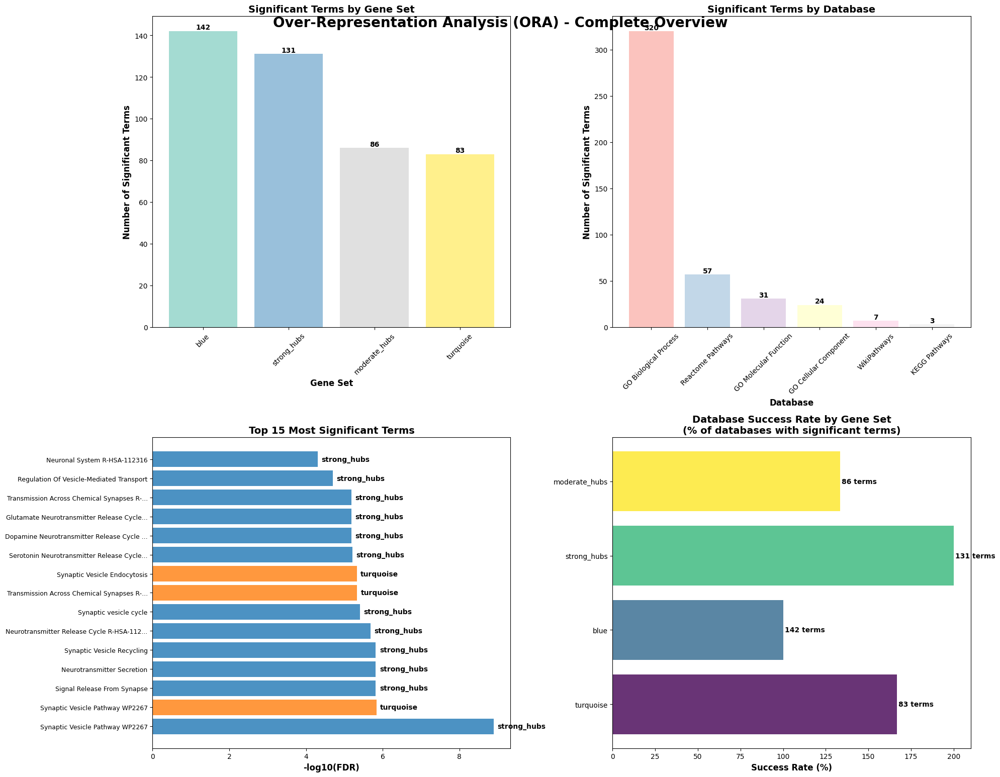


STEP 4: BIOLOGICAL INTERPRETATION

🔬 GENERATING BIOLOGICAL INSIGHTS FROM ORA
--------------------------------------------------

🧬 BIOLOGICAL INSIGHTS FOR TURQUOISE:
----------------------------------------
🎯 Top 5 Most Significant Terms:
   1. Synaptic Vesicle Pathway WP2267
      FDR: 1.46e-06, Odds Ratio: 61.8
   2. Transmission Across Chemical Synapses R-HSA-112315
      FDR: 4.68e-06, Odds Ratio: 20.7
   3. Synaptic Vesicle Endocytosis (GO:0048488)
      FDR: 4.75e-06, Odds Ratio: 81.3
   4. Neuronal System R-HSA-112316
      FDR: 7.34e-05, Odds Ratio: 13.0
   5. Signal Release From Synapse (GO:0099643)
      FDR: 1.15e-04, Odds Ratio: 65.1

🛡️ IMMUNE-RELATED PATHWAYS (1 terms):
   • MHC Class II Antigen Presentation R-HSA-2132295 (FDR: 9.76e-03)

📡 SIGNALING PATHWAYS (14 terms):
   • Anterograde Trans-Synaptic Signaling (GO:0098916) (FDR: 1.42e-03)
   • Acetylcholine Receptor Signaling Pathway (GO:0095500) (FDR: 1.23e-02)
   • Regulation Of Regulated Secretory Pathway (GO:190330

In [17]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap
import gseapy as gp
import warnings
import os
warnings.filterwarnings('ignore')

print("=" * 70)
print("FOCUSED OVER-REPRESENTATION ANALYSIS (ORA) - STEP 1")
print("=" * 70)

def load_gene_sets():
    """Load the gene sets from our WGCNA analysis"""
    print("\n📁 Loading gene sets for ORA...")
    
    gene_sets = {}
    
    try:
        # Load module genes
        module_files = {
            'turquoise': 'module_turquoise_genes.csv',
            'blue': 'module_blue_genes.csv'
        }
        
        for module, filename in module_files.items():
            if os.path.exists(filename):
                genes_df = pd.read_csv(filename)
                gene_sets[module] = genes_df['gene'].tolist()
                print(f"   ✅ {module} module: {len(gene_sets[module])} genes")
            else:
                print(f"   ❌ {filename} not found")
        
        # Load hub genes
        hub_files = {
            'strong_hubs': 'strong_hub_genes.csv',
            'moderate_hubs': 'moderate_hub_genes.csv'
        }
        
        for hub_type, filename in hub_files.items():
            if os.path.exists(filename):
                genes_df = pd.read_csv(filename)
                gene_sets[hub_type] = genes_df['gene'].tolist()
                print(f"   ✅ {hub_type}: {len(gene_sets[hub_type])} genes")
            else:
                print(f"   ❌ {filename} not found")
        
        # Load all significant genes for background
        if os.path.exists('wgcna_results_final.csv'):
            all_genes_df = pd.read_csv('wgcna_results_final.csv')
            gene_sets['background'] = all_genes_df['gene'].tolist()
            print(f"   ✅ Background genes: {len(gene_sets['background'])} genes")
        
    except Exception as e:
        print(f"❌ Error loading gene sets: {e}")
    
    return gene_sets

def check_available_databases():
    """Check which databases are available in the current gseapy installation"""
    print("\n🔍 CHECKING AVAILABLE DATABASES")
    print("-" * 40)
    
    try:
        # Get all available databases
        available_dbs = gp.get_library_name()
        print(f"📚 Found {len(available_dbs)} available databases")
        
        # Show databases that contain 'WikiPathways'
        wp_dbs = [db for db in available_dbs if 'WikiPathways' in db]
        if wp_dbs:
            print("✅ Available WikiPathways databases:")
            for db in wp_dbs:
                print(f"   - {db}")
        else:
            print("❌ No WikiPathways databases found")
            
        # Show other pathway databases
        pathway_dbs = [db for db in available_dbs if any(x in db for x in ['Pathway', 'KEGG', 'Reactome'])]
        if pathway_dbs:
            print("📊 Available pathway databases:")
            for db in pathway_dbs[:10]:  # Show first 10
                print(f"   - {db}")
                
        return available_dbs
        
    except Exception as e:
        print(f"❌ Error checking databases: {e}")
        return []

def get_updated_databases(available_dbs):
    """Get updated database list based on what's available"""
    
    # Preferred databases in order of priority
    preferred_dbs = {
        'GO_Biological_Process_2023': 'GO Biological Process',
        'GO_Molecular_Function_2023': 'GO Molecular Function', 
        'GO_Cellular_Component_2023': 'GO Cellular Component',
        'KEGG_2021_Human': 'KEGG Pathways',
        'Reactome_2022': 'Reactome Pathways',
        'WikiPathways_2021_Human': 'WikiPathways',  # Try original first
    }
    
    # Alternative WikiPathways versions
    wp_alternatives = [
        'WikiPathways_2019_Human',
        'WikiPathways_2016',
        'WikiPathways_2015'
    ]
    
    # Alternative versions for other databases
    db_alternatives = {
        'GO_Biological_Process_2023': ['GO_Biological_Process_2021', 'GO_Biological_Process_2018'],
        'GO_Molecular_Function_2023': ['GO_Molecular_Function_2021', 'GO_Molecular_Function_2018'],
        'GO_Cellular_Component_2023': ['GO_Cellular_Component_2021', 'GO_Cellular_Component_2018'],
        'KEGG_2021_Human': ['KEGG_2019_Human', 'KEGG_2016'],
        'Reactome_2022': ['Reactome_2016', 'Reactome_2015']
    }
    
    # Check if our preferred databases are available
    updated_dbs = {}
    for db_key, db_desc in preferred_dbs.items():
        if db_key in available_dbs:
            updated_dbs[db_key] = db_desc
            print(f"   ✅ {db_desc}: Available")
        else:
            # Try to find alternatives
            found_alternative = False
            if db_key in db_alternatives:
                for alt_db in db_alternatives[db_key]:
                    if alt_db in available_dbs:
                        updated_dbs[alt_db] = db_desc
                        print(f"   🔄 {db_desc}: Using {alt_db} instead")
                        found_alternative = True
                        break
            
            # Special handling for WikiPathways
            if not found_alternative and 'WikiPathways' in db_key:
                for alt_wp in wp_alternatives:
                    if alt_wp in available_dbs:
                        updated_dbs[alt_wp] = db_desc
                        print(f"   🔄 {db_desc}: Using {alt_wp} instead")
                        found_alternative = True
                        break
            
            if not found_alternative:
                print(f"   ❌ {db_desc}: No alternatives found")
    
    return updated_dbs

def perform_comprehensive_ora(gene_sets):
    """Perform comprehensive ORA analysis with available databases"""
    print("\n🎯 PERFORMING COMPREHENSIVE OVER-REPRESENTATION ANALYSIS")
    print("-" * 60)
    
    # Check available databases first
    available_dbs = check_available_databases()
    
    if not available_dbs:
        print("❌ No databases available. Using default set.")
        databases = {
            'GO_Biological_Process_2023': 'GO Biological Process',
            'GO_Molecular_Function_2023': 'GO Molecular Function', 
            'GO_Cellular_Component_2023': 'GO Cellular Component',
            'KEGG_2021_Human': 'KEGG Pathways',
            'Reactome_2022': 'Reactome Pathways',
        }
    else:
        databases = get_updated_databases(available_dbs)
    
    if not databases:
        print("❌ No valid databases found. Exiting ORA analysis.")
        return {}, {}
    
    print(f"\n📊 Using {len(databases)} databases for ORA:")
    for db_name, db_desc in databases.items():
        print(f"   • {db_desc} ({db_name})")
    
    ora_results = {}
    summary_stats = {}
    
    for set_name, genes in gene_sets.items():
        if set_name == 'background':
            continue
            
        print(f"\n🔬 Analyzing {set_name.upper()} ({len(genes)} genes)...")
        print("-" * 40)
        
        if len(genes) < 3:
            print(f"   ⚠️  Too few genes for ORA: {len(genes)}")
            continue
        
        set_results = {}
        set_stats = {
            'total_genes': len(genes),
            'significant_terms': 0,
            'databases_with_results': 0
        }
        
        for db_name, db_description in databases.items():
            try:
                print(f"   📊 Testing {db_description}...")
                
                # Perform ORA
                enr = gp.enrichr(gene_list=genes,
                                gene_sets=db_name,
                                organism='Human',
                                outdir=None,
                                cutoff=0.05)
                
                if enr.results is not None and len(enr.results) > 0:
                    # Filter for significant results (FDR < 0.05)
                    sig_results = enr.results[enr.results['Adjusted P-value'] < 0.05]
                    
                    if len(sig_results) > 0:
                        set_results[db_name] = {
                            'description': db_description,
                            'all_terms': enr.results,
                            'significant_terms': sig_results,
                            'num_significant': len(sig_results)
                        }
                        
                        set_stats['significant_terms'] += len(sig_results)
                        set_stats['databases_with_results'] += 1
                        
                        print(f"   ✅ {db_description}: {len(sig_results)} significant terms")
                        
                        # Show top 3 terms
                        top_terms = sig_results.head(3)
                        for i, (_, term) in enumerate(top_terms.iterrows()):
                            print(f"      {i+1}. {term['Term'][:50]}... (FDR: {term['Adjusted P-value']:.2e})")
                    else:
                        print(f"   ⚠️  {db_description}: No terms pass FDR < 0.05")
                else:
                    print(f"   ❌ {db_description}: No results returned")
                    
            except Exception as e:
                error_msg = str(e)
                if "No GeneSets are valid" in error_msg:
                    print(f"   ❌ {db_description}: Database not available or empty")
                else:
                    print(f"   ❌ Error in {db_description}: {error_msg[:80]}...")
        
        if set_results:
            ora_results[set_name] = set_results
            summary_stats[set_name] = set_stats
            print(f"   🎯 SUMMARY: {set_stats['databases_with_results']} databases with {set_stats['significant_terms']} total significant terms")
        else:
            print(f"   ⚠️  No significant results for {set_name}")
    
    return ora_results, summary_stats

def create_detailed_ora_visualizations(ora_results, output_dir="ORA_Results"):
    """Create detailed and clear visualizations for ORA results"""
    print(f"\n🎨 CREATING DETAILED ORA VISUALIZATIONS")
    print("-" * 50)
    
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    all_plots = {}
    
    for set_name, databases in ora_results.items():
        print(f"\n📊 Creating visualizations for {set_name.upper()}...")
        set_plots = {}
        
        # Create individual plots for each database
        for db_name, db_data in databases.items():
            try:
                sig_terms = db_data['significant_terms']
                db_description = db_data['description']
                
                if len(sig_terms) == 0:
                    continue
                
                # Get top 15 terms for visualization
                top_terms = sig_terms.head(15)
                
                # Create a comprehensive figure for this database
                fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))
                
                # Main title
                fig.suptitle(f'ORA: {set_name.upper()} - {db_description}\n({len(sig_terms)} Significant Terms)', 
                           fontsize=16, fontweight='bold', y=0.95)
                
                # Plot 1: Dot plot with effect size and significance
                scatter = ax1.scatter(top_terms['Odds Ratio'], 
                                    -np.log10(top_terms['Adjusted P-value']),
                                    s=top_terms['Overlap'].str.split('/').str[0].astype(int) * 25,
                                    c=top_terms['Adjusted P-value'],
                                    cmap='viridis_r',
                                    alpha=0.8,
                                    edgecolors='black',
                                    linewidth=0.5)
                
                ax1.set_xlabel('Odds Ratio', fontsize=12, fontweight='bold')
                ax1.set_ylabel('-log10(Adjusted P-value)', fontsize=12, fontweight='bold')
                ax1.set_title('Effect Size vs Statistical Significance', fontsize=14, fontweight='bold')
                ax1.grid(True, alpha=0.3)
                ax1.axvline(x=1, color='red', linestyle='--', alpha=0.7, label='No effect (OR=1)')
                ax1.legend()
                
                # Add labels for top 5 terms
                for i, (_, row) in enumerate(top_terms.head(5).iterrows()):
                    term_name = row['Term'].split(':')[-1] if ':' in row['Term'] else row['Term']
                    ax1.annotate(f"{term_name[:30]}...", 
                               (row['Odds Ratio'], -np.log10(row['Adjusted P-value'])),
                               xytext=(10, 10), textcoords='offset points',
                               fontsize=9, fontweight='bold',
                               bbox=dict(boxstyle='round,pad=0.3', facecolor='yellow', alpha=0.7),
                               arrowprops=dict(arrowstyle='->', color='black', alpha=0.6))
                
                # Plot 2: Bar plot of top terms
                y_pos = np.arange(len(top_terms))
                bar_colors = plt.cm.plasma(np.linspace(0, 1, len(top_terms)))
                
                # Use -log10(FDR) for bar heights
                bar_heights = -np.log10(top_terms['Adjusted P-value'])
                bars = ax2.barh(y_pos, bar_heights, color=bar_colors, alpha=0.8)
                
                ax2.set_yticks(y_pos)
                
                # Clean term names for y-axis
                clean_terms = []
                for term in top_terms['Term']:
                    # Remove GO/KEGG identifiers for cleaner display
                    if 'GO:' in term or 'KEGG' in term or 'R-HSA' in term:
                        clean_name = term.split(' (')[0] if ' (' in term else term
                        clean_name = clean_name.split(':')[-1] if ':' in clean_name else clean_name
                    else:
                        clean_name = term
                    clean_terms.append(clean_name[:45] + '...' if len(clean_name) > 45 else clean_name)
                
                ax2.set_yticklabels(clean_terms, fontsize=10)
                ax2.set_xlabel('-log10(Adjusted P-value)', fontsize=12, fontweight='bold')
                ax2.set_title('Top Enriched Terms by Significance', fontsize=14, fontweight='bold')
                ax2.grid(True, alpha=0.3, axis='x')
                
                # Add gene count and odds ratio annotations
                for i, bar in enumerate(bars):
                    width = bar.get_width()
                    gene_count = top_terms.iloc[i]['Overlap'].split('/')[0]
                    odds_ratio = top_terms.iloc[i]['Odds Ratio']
                    
                    # Position text inside or outside bar based on width
                    text_x = width - 0.5 if width > 2 else width + 0.2
                    ha = 'right' if width > 2 else 'left'
                    
                    ax2.text(text_x, bar.get_y() + bar.get_height()/2,
                           f'{gene_count} genes (OR: {odds_ratio:.1f})', 
                           ha=ha, va='center', fontsize=9, fontweight='bold',
                           bbox=dict(boxstyle='round,pad=0.2', facecolor='white', alpha=0.8))
                
                plt.tight_layout()
                plot_file = f"{output_dir}/ORA_{set_name}_{db_name}.pdf"
                plt.savefig(plot_file, dpi=300, bbox_inches='tight')
                plt.close()
                
                set_plots[db_name] = plot_file
                print(f"   ✅ {db_description}: {len(sig_terms)} terms visualized")
                
            except Exception as e:
                print(f"   ❌ Error visualizing {db_name}: {e}")
        
        # Create summary plot for this gene set across all databases
        if set_plots:
            create_gene_set_summary_plot(set_name, databases, output_dir)
            all_plots[set_name] = set_plots
    
    return all_plots

def create_gene_set_summary_plot(set_name, databases, output_dir):
    """Create a summary plot showing ORA results across all databases for one gene set"""
    try:
        # Collect top terms from all databases
        summary_data = []
        
        for db_name, db_data in databases.items():
            sig_terms = db_data['significant_terms']
            if len(sig_terms) > 0:
                top_3 = sig_terms.head(3)
                for _, term in top_3.iterrows():
                    summary_data.append({
                        'Database': db_data['description'],
                        'Term': term['Term'],
                        'FDR': term['Adjusted P-value'],
                        'Odds_Ratio': term['Odds Ratio'],
                        'Gene_Count': int(term['Overlap'].split('/')[0])
                    })
        
        if not summary_data:
            return
        
        summary_df = pd.DataFrame(summary_data)
        
        # Create summary plot
        fig, ax = plt.subplots(figsize=(14, 10))
        
        # Create bubble plot
        databases_order = summary_df['Database'].unique()
        y_pos = np.arange(len(databases_order))
        
        # Map databases to y-positions
        db_to_y = {db: i for i, db in enumerate(databases_order)}
        
        # Plot bubbles
        for _, row in summary_df.iterrows():
            bubble_size = row['Gene_Count'] * 50
            bubble_color = -np.log10(row['FDR'])
            
            scatter = ax.scatter(db_to_y[row['Database']], 
                               row['Odds_Ratio'],
                               s=bubble_size,
                               c=bubble_color,
                               cmap='viridis',
                               alpha=0.7,
                               edgecolors='black',
                               linewidth=0.5)
            
            # Add term label
            term_name = row['Term'].split(':')[-1] if ':' in row['Term'] else row['Term']
            ax.annotate(term_name[:25] + '...', 
                       (db_to_y[row['Database']], row['Odds_Ratio']),
                       xytext=(5, 5), textcoords='offset points',
                       fontsize=8, fontweight='bold',
                       bbox=dict(boxstyle='round,pad=0.2', facecolor='white', alpha=0.8))
        
        ax.set_xlabel('Database', fontsize=12, fontweight='bold')
        ax.set_ylabel('Odds Ratio', fontsize=12, fontweight='bold')
        ax.set_title(f'ORA Summary: {set_name.upper()}\nTop Enriched Terms Across Databases', 
                   fontsize=16, fontweight='bold')
        
        ax.set_xticks(y_pos)
        ax.set_xticklabels([db[:15] + '...' if len(db) > 15 else db for db in databases_order], 
                          rotation=45, ha='right')
        ax.axhline(y=1, color='red', linestyle='--', alpha=0.7, label='No effect')
        ax.legend()
        ax.grid(True, alpha=0.3)
        
        # Add colorbar
        cbar = plt.colorbar(scatter, ax=ax)
        cbar.set_label('-log10(FDR)', fontweight='bold')
        
        plt.tight_layout()
        summary_file = f"{output_dir}/SUMMARY_ORA_{set_name}_across_databases.pdf"
        plt.savefig(summary_file, dpi=300, bbox_inches='tight')
        plt.close()
        
        print(f"   📈 Summary plot created for {set_name}")
        
    except Exception as e:
        print(f"   ❌ Error creating summary plot for {set_name}: {e}")

def create_ora_summary_report(ora_results, summary_stats, gene_sets):
    """Create a comprehensive summary report for ORA analysis"""
    print(f"\n📋 CREATING COMPREHENSIVE ORA SUMMARY REPORT")
    print("-" * 50)
    
    # Collect all significant terms for the report
    all_terms = []
    
    for set_name, databases in ora_results.items():
        for db_name, db_data in databases.items():
            for _, term in db_data['significant_terms'].iterrows():
                all_terms.append({
                    'Gene_Set': set_name,
                    'Database': db_data['description'],
                    'Term': term['Term'],
                    'PValue': term['P-value'],
                    'FDR': term['Adjusted P-value'],
                    'Odds_Ratio': term['Odds Ratio'],
                    'Overlap': term['Overlap'],
                    'Genes': term.get('Genes', '')
                })
    
    # Create summary DataFrame
    if all_terms:
        summary_df = pd.DataFrame(all_terms)
        summary_df.to_csv('ORA_Results/ORA_Complete_Results.csv', index=False)
        
        print(f"✅ Complete ORA results saved: {len(summary_df)} significant terms")
        
        # Create overview visualization
        create_ora_overview_visualization(summary_df, summary_stats, gene_sets)
        
        return summary_df
    else:
        print("❌ No significant terms found in ORA analysis")
        return pd.DataFrame()

def create_ora_overview_visualization(summary_df, summary_stats, gene_sets):
    """Create an overview visualization of all ORA results"""
    print("\n📊 Creating ORA overview visualization...")
    
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 16))
    fig.suptitle('Over-Representation Analysis (ORA) - Complete Overview', 
                fontsize=20, fontweight='bold', y=0.95)
    
    try:
        # Plot 1: Terms by Gene Set
        terms_by_set = summary_df['Gene_Set'].value_counts()
        colors = plt.cm.Set3(np.linspace(0, 1, len(terms_by_set)))
        
        bars = ax1.bar(terms_by_set.index, terms_by_set.values, color=colors, alpha=0.8)
        ax1.set_xlabel('Gene Set', fontsize=12, fontweight='bold')
        ax1.set_ylabel('Number of Significant Terms', fontsize=12, fontweight='bold')
        ax1.set_title('Significant Terms by Gene Set', fontsize=14, fontweight='bold')
        ax1.tick_params(axis='x', rotation=45)
        
        for bar in bars:
            height = bar.get_height()
            ax1.text(bar.get_x() + bar.get_width()/2., height + 0.1,
                    f'{int(height)}', ha='center', va='bottom', fontweight='bold')
        
        # Plot 2: Terms by Database
        terms_by_db = summary_df['Database'].value_counts()
        colors = plt.cm.Pastel1(np.linspace(0, 1, len(terms_by_db)))
        
        bars = ax2.bar(terms_by_db.index, terms_by_db.values, color=colors, alpha=0.8)
        ax2.set_xlabel('Database', fontsize=12, fontweight='bold')
        ax2.set_ylabel('Number of Significant Terms', fontsize=12, fontweight='bold')
        ax2.set_title('Significant Terms by Database', fontsize=14, fontweight='bold')
        ax2.tick_params(axis='x', rotation=45)
        
        for bar in bars:
            height = bar.get_height()
            ax2.text(bar.get_x() + bar.get_width()/2., height + 0.1,
                    f'{int(height)}', ha='center', va='bottom', fontweight='bold')
        
        # Plot 3: Top 15 Most Significant Terms
        top_terms = summary_df.nsmallest(15, 'FDR')
        y_pos = np.arange(len(top_terms))
        
        # Color by gene set
        unique_sets = top_terms['Gene_Set'].unique()
        color_map = {set_name: plt.cm.tab10(i) for i, set_name in enumerate(unique_sets)}
        colors = [color_map[set_name] for set_name in top_terms['Gene_Set']]
        
        bars = ax3.barh(y_pos, -np.log10(top_terms['FDR']), color=colors, alpha=0.8)
        ax3.set_yticks(y_pos)
        
        clean_terms = []
        for term in top_terms['Term']:
            if 'GO:' in term or 'KEGG' in term or 'R-HSA' in term:
                clean_name = term.split(' (')[0] if ' (' in term else term
                clean_name = clean_name.split(':')[-1] if ':' in clean_name else clean_name
            else:
                clean_name = term
            clean_terms.append(clean_name[:40] + '...' if len(clean_name) > 40 else clean_name)
        
        ax3.set_yticklabels(clean_terms, fontsize=9)
        ax3.set_xlabel('-log10(FDR)', fontsize=12, fontweight='bold')
        ax3.set_title('Top 15 Most Significant Terms', fontsize=14, fontweight='bold')
        
        # Add gene set labels
        for i, bar in enumerate(bars):
            width = bar.get_width()
            gene_set = top_terms.iloc[i]['Gene_Set']
            ax3.text(width + 0.1, bar.get_y() + bar.get_height()/2,
                   gene_set, ha='left', va='center', fontweight='bold')
        
        # Plot 4: Gene Set Success Rate
        success_data = []
        for set_name, stats in summary_stats.items():
            success_rate = (stats['databases_with_results'] / len(stats)) * 100
            success_data.append({
                'Gene_Set': set_name,
                'Success_Rate': success_rate,
                'Total_Terms': stats['significant_terms']
            })
        
        success_df = pd.DataFrame(success_data)
        
        if len(success_df) > 0:
            y_pos = np.arange(len(success_df))
            colors = plt.cm.viridis(np.linspace(0, 1, len(success_df)))
            
            bars = ax4.barh(y_pos, success_df['Success_Rate'], color=colors, alpha=0.8)
            ax4.set_yticks(y_pos)
            ax4.set_yticklabels(success_df['Gene_Set'])
            ax4.set_xlabel('Success Rate (%)', fontsize=12, fontweight='bold')
            ax4.set_title('Database Success Rate by Gene Set\n(% of databases with significant terms)', 
                         fontsize=14, fontweight='bold')
            
            for i, bar in enumerate(bars):
                width = bar.get_width()
                total_terms = success_df.iloc[i]['Total_Terms']
                ax4.text(width + 1, bar.get_y() + bar.get_height()/2,
                       f'{total_terms} terms', ha='left', va='center', fontweight='bold')
        
        plt.tight_layout()
        plt.savefig('ORA_Results/ORA_Overview_Summary.pdf', dpi=300, bbox_inches='tight')
        plt.show()
        
    except Exception as e:
        print(f"❌ Error creating overview visualization: {e}")

def generate_ora_biological_insights(summary_df):
    """Generate biological insights from ORA results"""
    print(f"\n🔬 GENERATING BIOLOGICAL INSIGHTS FROM ORA")
    print("-" * 50)
    
    if summary_df.empty:
        print("❌ No ORA results available for biological insights")
        return
    
    # Analyze by gene set
    gene_sets = summary_df['Gene_Set'].unique()
    
    for gene_set in gene_sets:
        set_terms = summary_df[summary_df['Gene_Set'] == gene_set]
        
        print(f"\n🧬 BIOLOGICAL INSIGHTS FOR {gene_set.upper()}:")
        print("-" * 40)
        
        # Top terms overall
        top_terms = set_terms.nsmallest(5, 'FDR')
        print(f"🎯 Top 5 Most Significant Terms:")
        for i, (_, term) in enumerate(top_terms.iterrows()):
            print(f"   {i+1}. {term['Term']}")
            print(f"      FDR: {term['FDR']:.2e}, Odds Ratio: {term['Odds_Ratio']:.1f}")
        
        # Check for cancer-related terms
        cancer_keywords = ['cancer', 'tumor', 'carcinoma', 'melanoma', 'leukemia', 
                          'metastasis', 'oncogene', 'tumor suppressor']
        cancer_terms = set_terms[set_terms['Term'].str.lower().str.contains('|'.join(cancer_keywords))]
        
        if len(cancer_terms) > 0:
            print(f"\n🦠 CANCER-RELATED PATHWAYS ({len(cancer_terms)} terms):")
            for _, term in cancer_terms.head(3).iterrows():
                print(f"   • {term['Term']} (FDR: {term['FDR']:.2e})")
        
        # Check for immune-related terms
        immune_keywords = ['immune', 'inflammatory', 'cytokine', 't cell', 'b cell',
                          'interferon', 'nf-kb', 'tlr', 'antigen', 'immunity']
        immune_terms = set_terms[set_terms['Term'].str.lower().str.contains('|'.join(immune_keywords))]
        
        if len(immune_terms) > 0:
            print(f"\n🛡️ IMMUNE-RELATED PATHWAYS ({len(immune_terms)} terms):")
            for _, term in immune_terms.head(3).iterrows():
                print(f"   • {term['Term']} (FDR: {term['FDR']:.2e})")
        
        # Check for signaling pathways
        signaling_keywords = ['signaling', 'signal transduction', 'pathway', 'kinase',
                             'receptor', 'transduction']
        signaling_terms = set_terms[set_terms['Term'].str.lower().str.contains('|'.join(signaling_keywords))]
        
        if len(signaling_terms) > 0:
            print(f"\n📡 SIGNALING PATHWAYS ({len(signaling_terms)} terms):")
            for _, term in signaling_terms.head(3).iterrows():
                print(f"   • {term['Term']} (FDR: {term['FDR']:.2e})")

# Main ORA Analysis
print("🚀 STARTING FOCUSED OVER-REPRESENTATION ANALYSIS")

# 1. Load gene sets
gene_sets = load_gene_sets()

if not gene_sets:
    print("❌ No gene sets found. Please check the file paths.")
    exit()

# 2. Perform comprehensive ORA with database checking
print("\n" + "="*50)
print("STEP 1: ORA ANALYSIS EXECUTION")
print("="*50)
ora_results, summary_stats = perform_comprehensive_ora(gene_sets)

# 3. Create detailed visualizations
print("\n" + "="*50)
print("STEP 2: ORA VISUALIZATION")
print("="*50)
if ora_results:
    ora_plots = create_detailed_ora_visualizations(ora_results)
else:
    print("❌ No ORA results to visualize")
    ora_plots = {}

# 4. Create summary report
print("\n" + "="*50)
print("STEP 3: ORA SUMMARY AND REPORTING")
print("="*50)
if ora_results:
    summary_df = create_ora_summary_report(ora_results, summary_stats, gene_sets)
else:
    print("❌ No ORA results to summarize")
    summary_df = pd.DataFrame()

# 5. Generate biological insights
print("\n" + "="*50)
print("STEP 4: BIOLOGICAL INTERPRETATION")
print("="*50)
if not summary_df.empty:
    generate_ora_biological_insights(summary_df)
else:
    print("❌ No ORA results for biological insights")

# Final ORA Report
print("\n" + "="*70)
print("OVER-REPRESENTATION ANALYSIS (ORA) COMPLETE! ✅")
print("="*70)

print(f"\n📊 ORA ANALYSIS SUMMARY:")
print(f"   Gene sets analyzed: {len(ora_results)}")
print(f"   Total significant terms: {len(summary_df) if not summary_df.empty else 0}")

if summary_stats:
    print(f"\n📈 GENE SET PERFORMANCE:")
    for set_name, stats in summary_stats.items():
        print(f"   {set_name}: {stats['databases_with_results']} databases, {stats['significant_terms']} total terms")

print(f"\n📁 ORA OUTPUT FILES:")
if ora_results:
    print(f"   • ORA_Results/ORA_Complete_Results.csv (all significant terms)")
    print(f"   • ORA_Results/ORA_Overview_Summary.pdf (summary visualization)")
    print(f"   • Individual plots for each gene set and database")
    print(f"   • Summary plots for each gene set across databases")
else:
    print(f"   • No output files generated (no significant results)")

print(f"\n🎯 KEY BIOLOGICAL FINDINGS:")
if not summary_df.empty:
    top_terms = summary_df.nsmallest(3, 'FDR')
    for i, (_, term) in enumerate(top_terms.iterrows()):
        print(f"   {i+1}. {term['Term'][:60]}... (FDR: {term['FDR']:.2e})")
else:
    print("   No significant biological findings")

print(f"\n🔜 NEXT STEP: Ready for GSEA analysis!")
print("="*70)

# GSEA FOR WGCNA

pandas version: 2.2.3
Note: Using pandas 2.0+, DataFrame.append is deprecated. Using pd.concat instead.
matplotlib version: 3.7.2
Current working directory: /kaggle/working
Matplotlib backend: module://matplotlib_inline.backend_inline
ORA FOR TISSUE-SPECIFIC CORRELATION & HUB ANALYSIS
🚀 STARTING TISSUE-SPECIFIC ORA ANALYSIS

🎯 CREATING TISSUE-SPECIFIC GENE SETS
--------------------------------------------------
✅ Increased correlation in tumor: 10 genes
✅ Decreased correlation in tumor: 10 genes
✅ Increased hubness in tumor: 10 genes
✅ Decreased hubness in tumor: 10 genes
✅ All tumor upregulated: 19 genes
✅ All tumor downregulated: 18 genes

STEP 1: ORA ANALYSIS EXECUTION

🎯 PERFORMING TISSUE-SPECIFIC ORA ANALYSIS
------------------------------------------------------------

🔍 CHECKING AVAILABLE DATABASES FOR ORA
--------------------------------------------------
📚 Found 222 available databases
📊 Available pathway databases:
   - GO_Biological_Process_2021
   - GO_Biological_Process_20

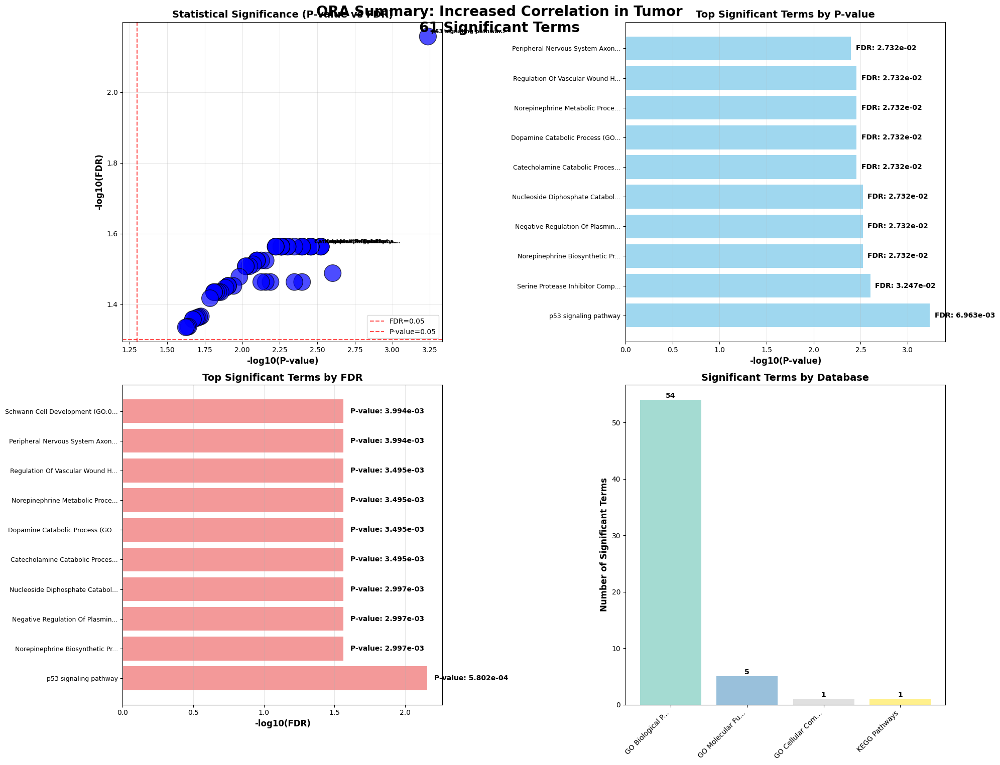

   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_increased_correlation_tumor_GO_Biological_Process_2023_summary.pdf (Size: 26.83 KB)
   📊 Displaying database summary plot for GO Biological Process


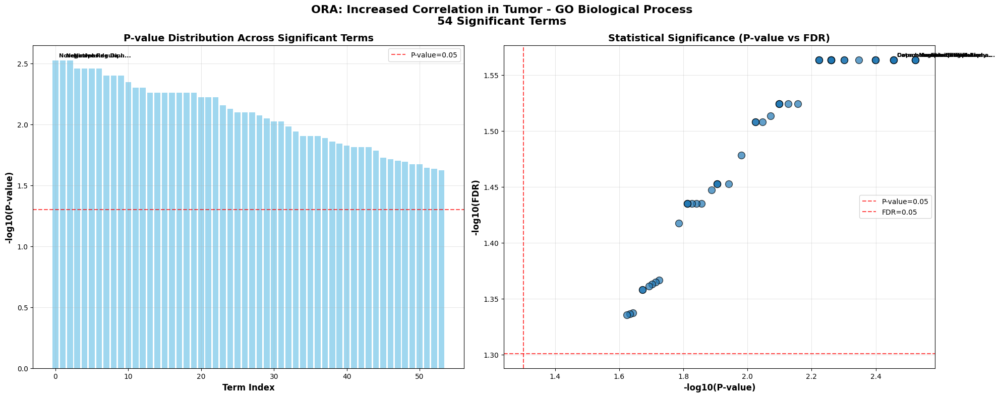

   ✅ GO Biological Process: 54 terms visualized
   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_increased_correlation_tumor_GO_Molecular_Function_2023_summary.pdf (Size: 25.51 KB)
   📊 Displaying database summary plot for GO Molecular Function


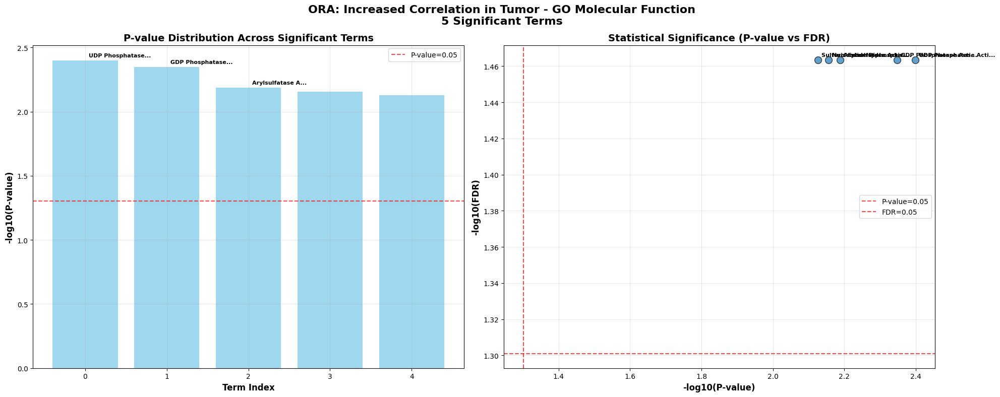

   ✅ GO Molecular Function: 5 terms visualized
   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_increased_correlation_tumor_GO_Cellular_Component_2023_summary.pdf (Size: 23.99 KB)
   📊 Displaying database summary plot for GO Cellular Component


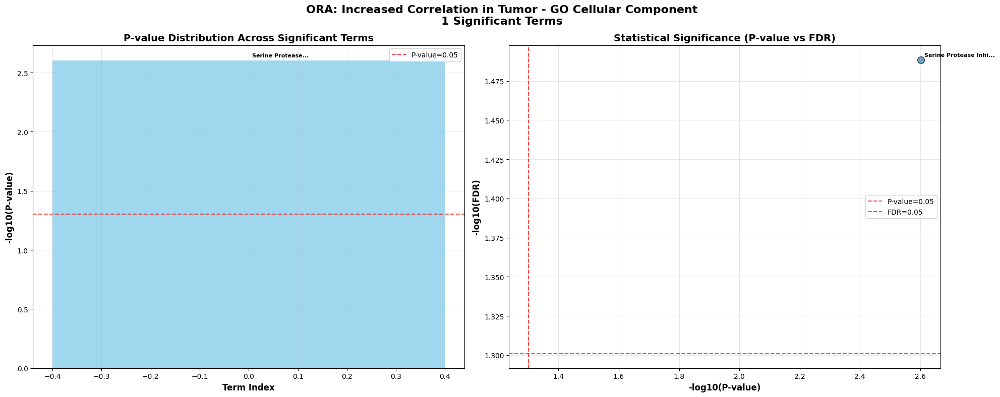

   ✅ GO Cellular Component: 1 terms visualized
   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_increased_correlation_tumor_KEGG_2021_Human_summary.pdf (Size: 25.62 KB)
   📊 Displaying database summary plot for KEGG Pathways


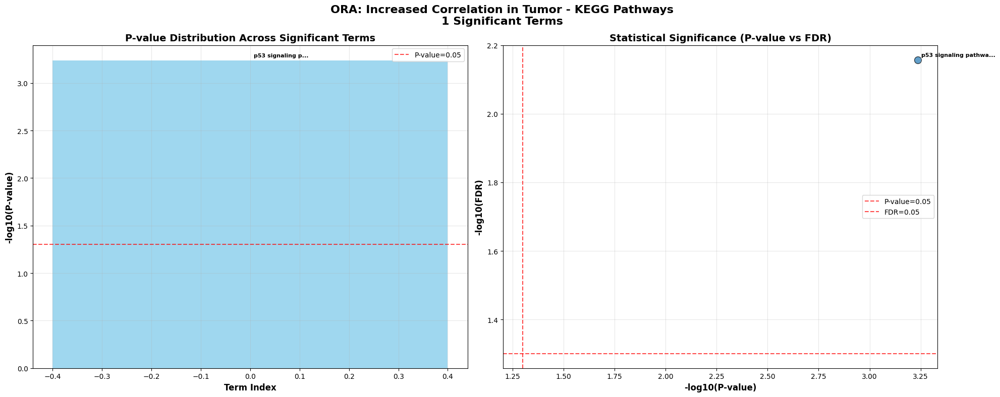

   ✅ KEGG Pathways: 1 terms visualized

📊 Creating ORA visualizations for DECREASED CORRELATION TUMOR...
   ✅ Saved ORA summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_Summary_decreased_correlation_tumor.pdf (Size: 53.12 KB)
   📊 Displaying ORA summary plot for decreased_correlation_tumor


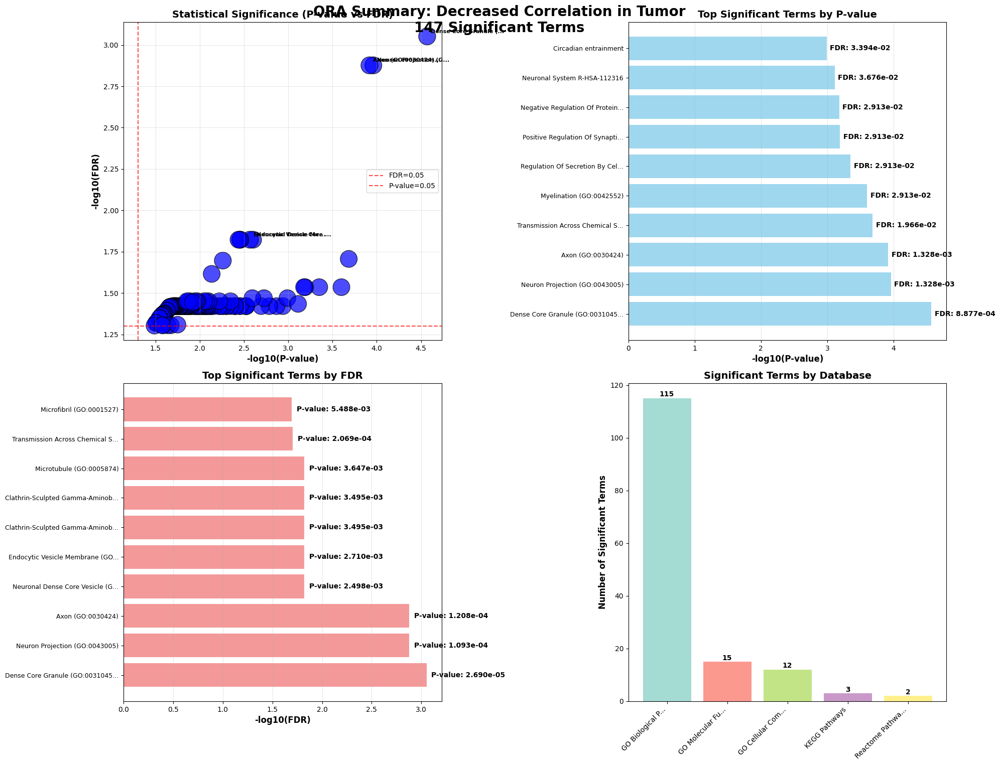

   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_decreased_correlation_tumor_GO_Biological_Process_2023_summary.pdf (Size: 28.91 KB)
   📊 Displaying database summary plot for GO Biological Process


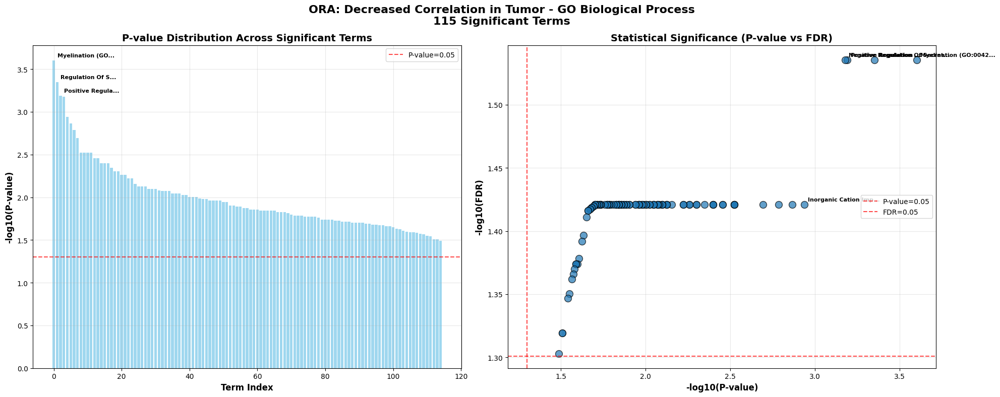

   ✅ GO Biological Process: 115 terms visualized
   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_decreased_correlation_tumor_GO_Molecular_Function_2023_summary.pdf (Size: 25.22 KB)
   📊 Displaying database summary plot for GO Molecular Function


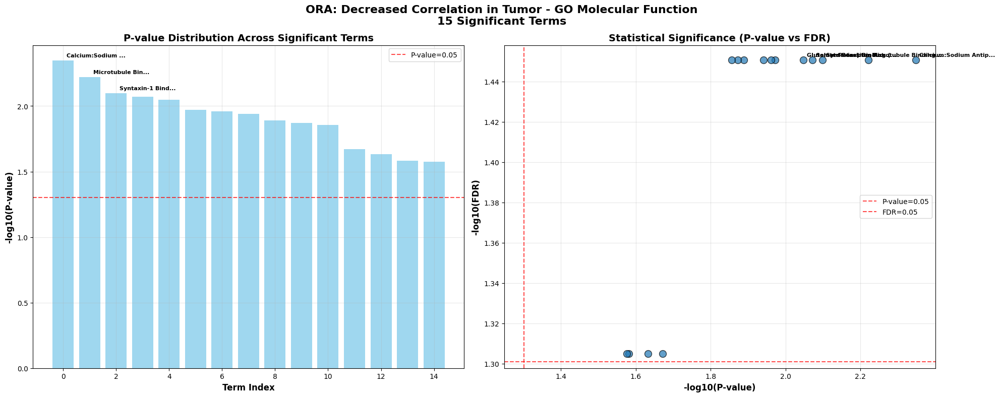

   ✅ GO Molecular Function: 15 terms visualized
   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_decreased_correlation_tumor_GO_Cellular_Component_2023_summary.pdf (Size: 26.31 KB)
   📊 Displaying database summary plot for GO Cellular Component


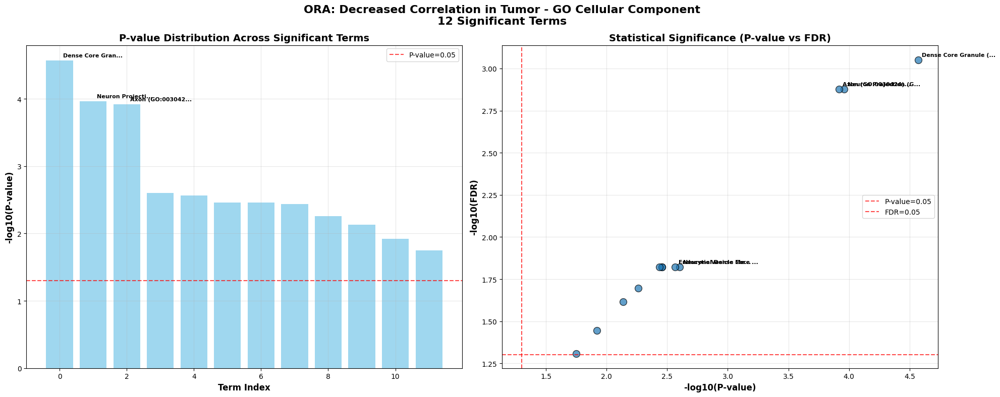

   ✅ GO Cellular Component: 12 terms visualized
   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_decreased_correlation_tumor_KEGG_2021_Human_summary.pdf (Size: 24.72 KB)
   📊 Displaying database summary plot for KEGG Pathways


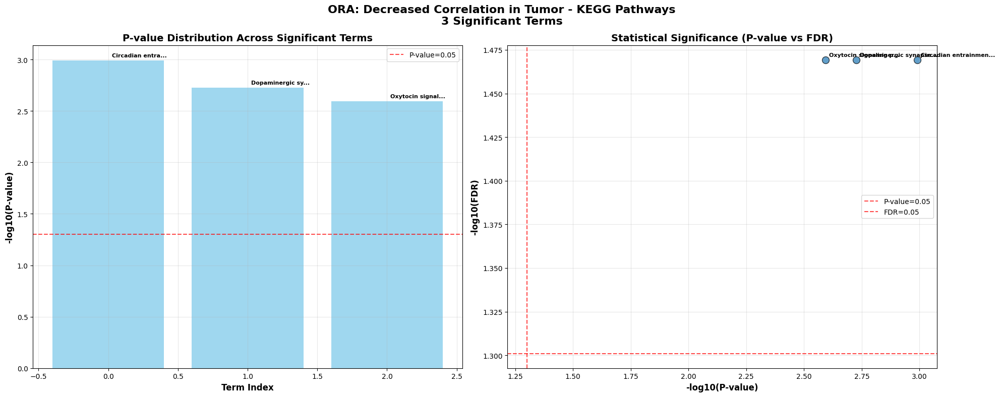

   ✅ KEGG Pathways: 3 terms visualized
   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_decreased_correlation_tumor_Reactome_2022_summary.pdf (Size: 24.17 KB)
   📊 Displaying database summary plot for Reactome Pathways


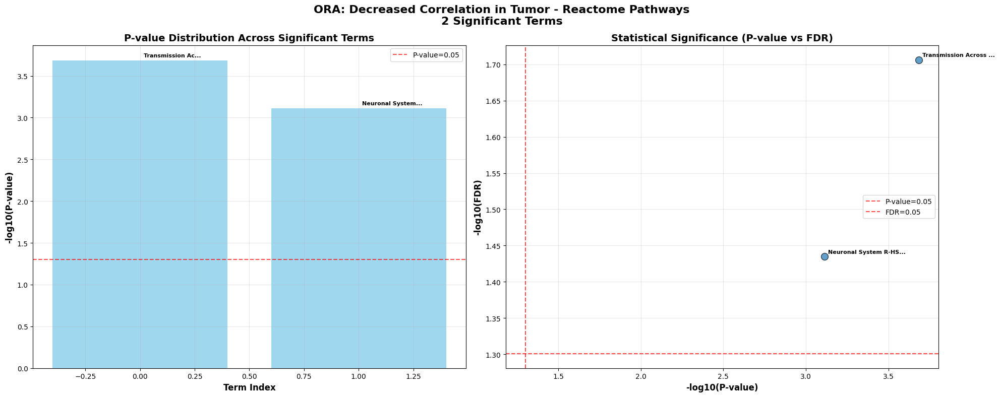

   ✅ Reactome Pathways: 2 terms visualized

📊 Creating ORA visualizations for INCREASED HUBNESS TUMOR...
   ✅ Saved ORA summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_Summary_increased_hubness_tumor.pdf (Size: 47.32 KB)
   📊 Displaying ORA summary plot for increased_hubness_tumor


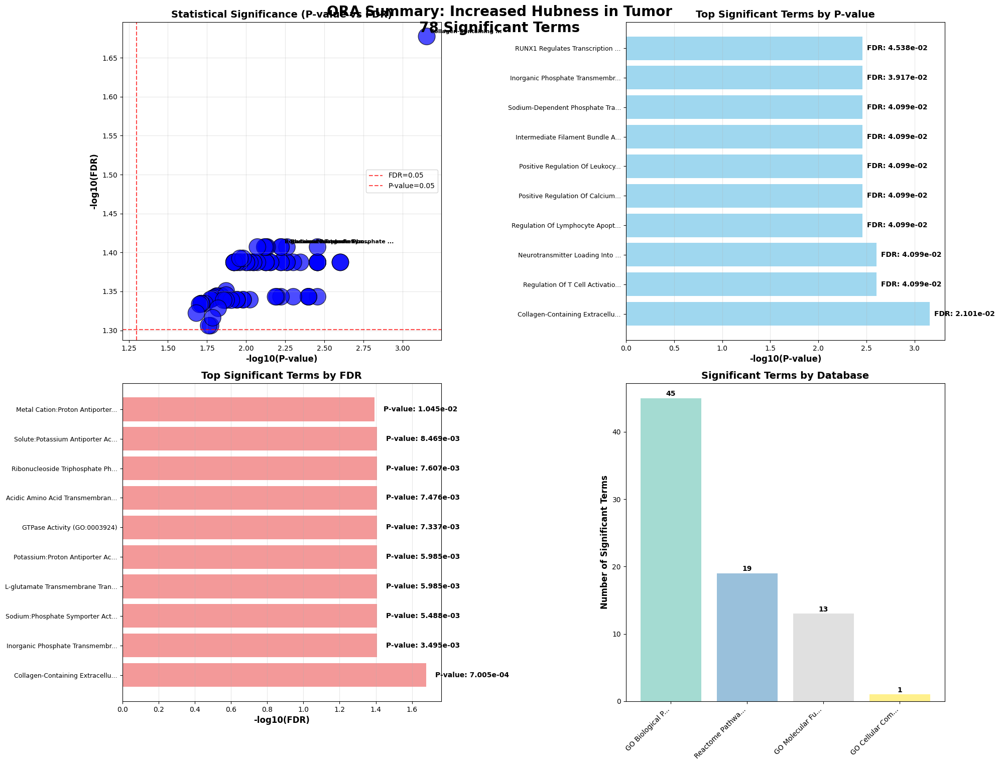

   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_increased_hubness_tumor_GO_Biological_Process_2023_summary.pdf (Size: 26.78 KB)
   📊 Displaying database summary plot for GO Biological Process


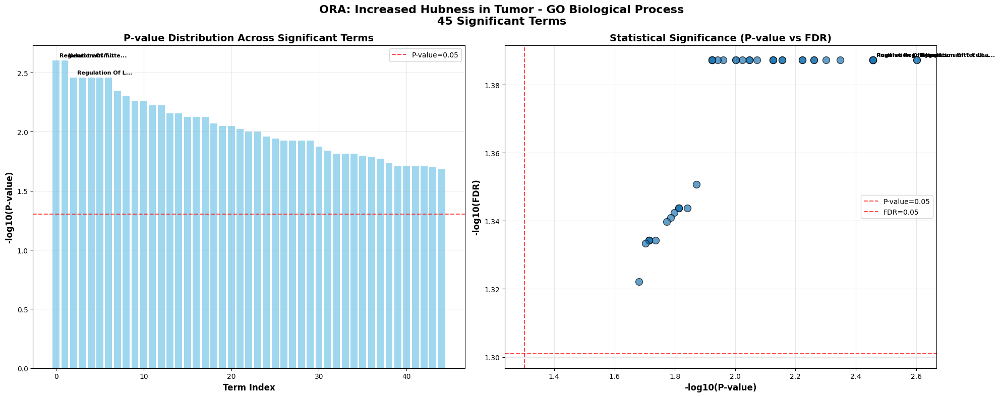

   ✅ GO Biological Process: 45 terms visualized
   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_increased_hubness_tumor_GO_Molecular_Function_2023_summary.pdf (Size: 25.11 KB)
   📊 Displaying database summary plot for GO Molecular Function


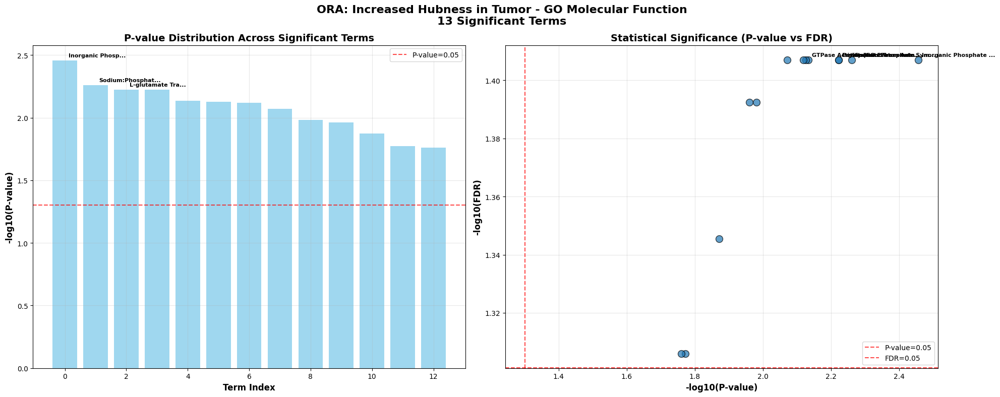

   ✅ GO Molecular Function: 13 terms visualized
   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_increased_hubness_tumor_GO_Cellular_Component_2023_summary.pdf (Size: 23.47 KB)
   📊 Displaying database summary plot for GO Cellular Component


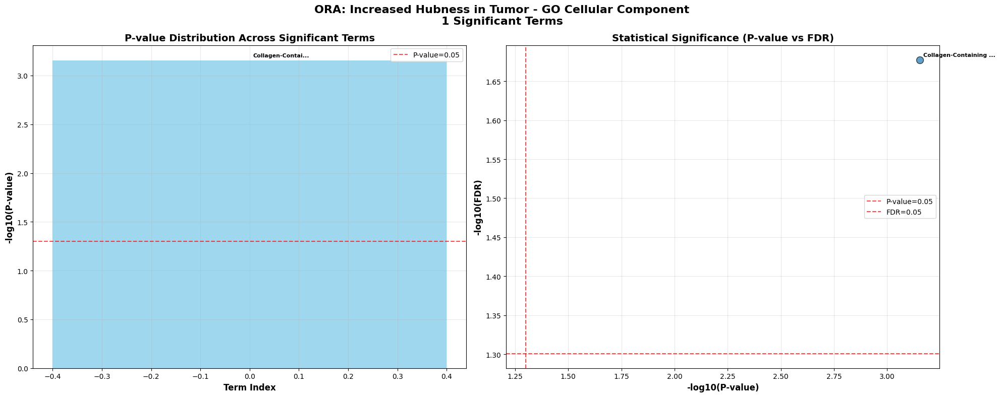

   ✅ GO Cellular Component: 1 terms visualized
   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_increased_hubness_tumor_Reactome_2022_summary.pdf (Size: 27.83 KB)
   📊 Displaying database summary plot for Reactome Pathways


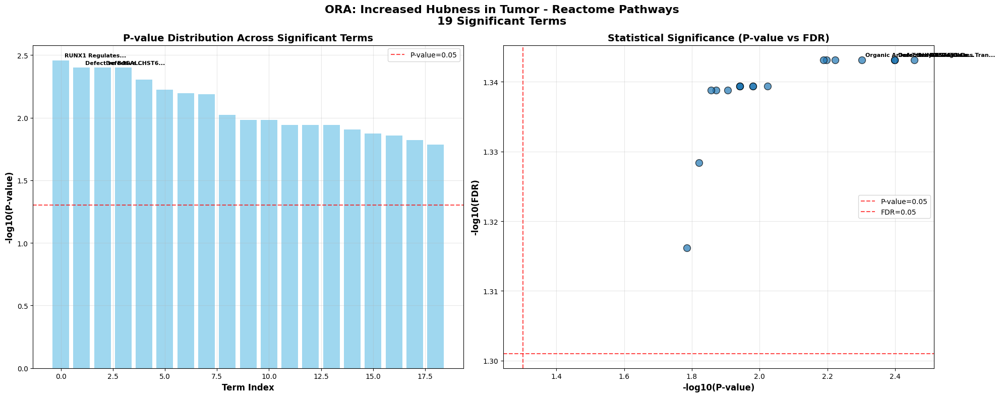

   ✅ Reactome Pathways: 19 terms visualized

📊 Creating ORA visualizations for DECREASED HUBNESS TUMOR...
   ✅ Saved ORA summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_Summary_decreased_hubness_tumor.pdf (Size: 52.00 KB)
   📊 Displaying ORA summary plot for decreased_hubness_tumor


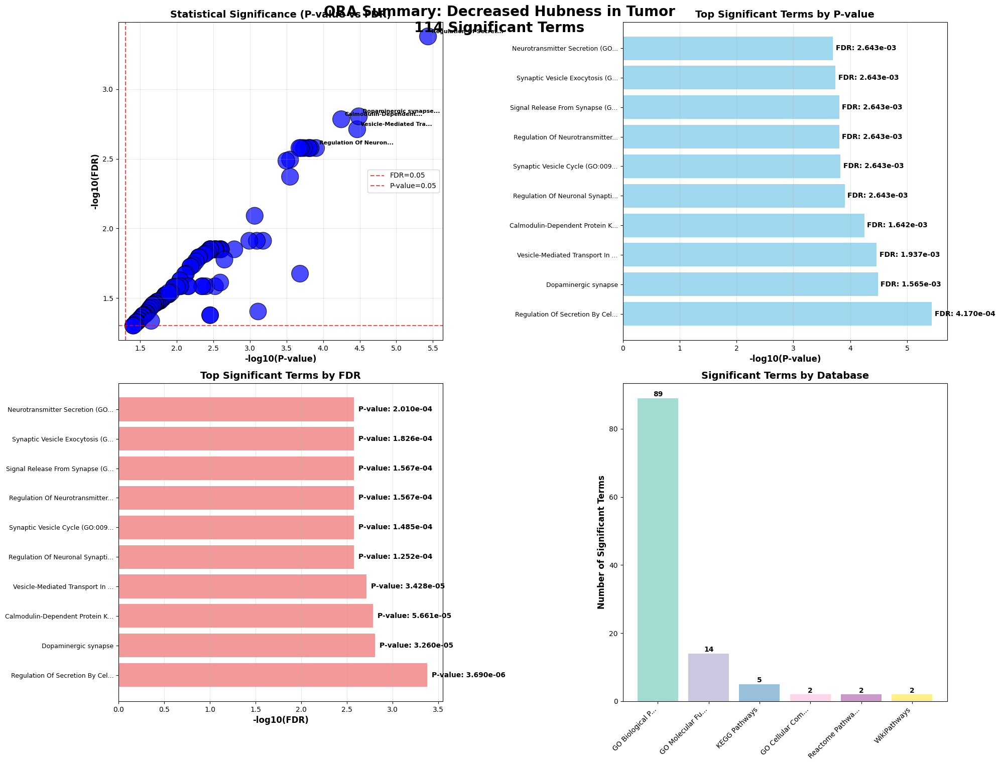

   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_decreased_hubness_tumor_GO_Biological_Process_2023_summary.pdf (Size: 28.96 KB)
   📊 Displaying database summary plot for GO Biological Process


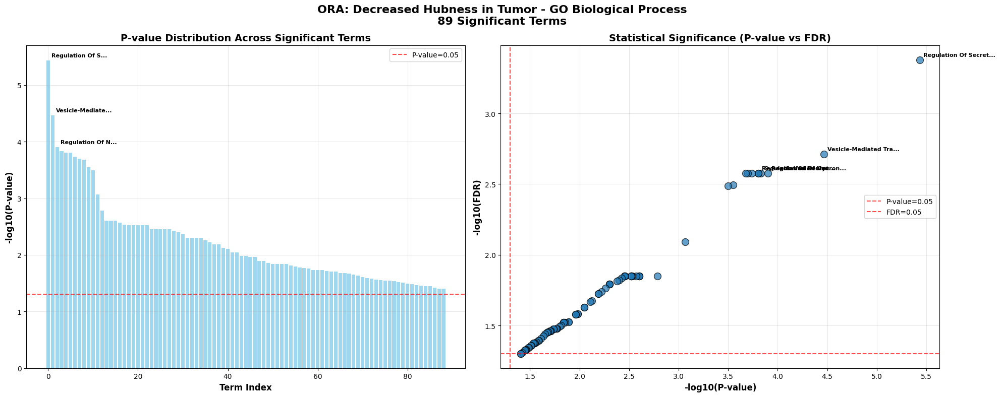

   ✅ GO Biological Process: 89 terms visualized
   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_decreased_hubness_tumor_GO_Molecular_Function_2023_summary.pdf (Size: 25.95 KB)
   📊 Displaying database summary plot for GO Molecular Function


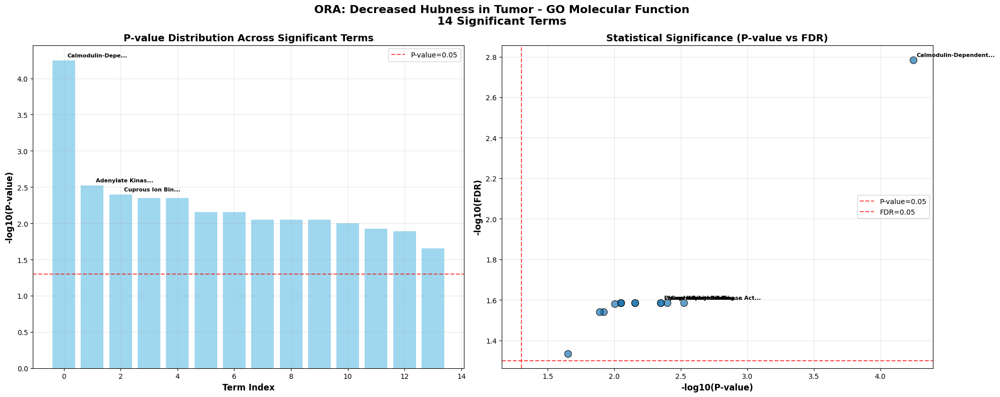

   ✅ GO Molecular Function: 14 terms visualized
   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_decreased_hubness_tumor_GO_Cellular_Component_2023_summary.pdf (Size: 24.63 KB)
   📊 Displaying database summary plot for GO Cellular Component


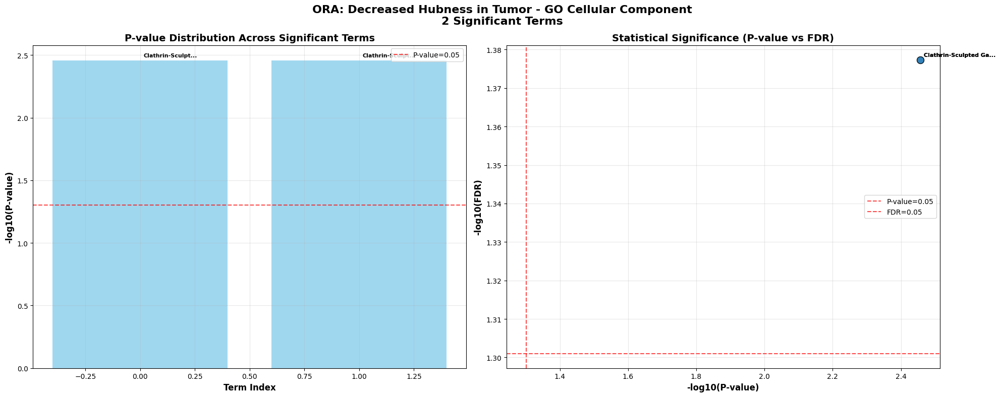

   ✅ GO Cellular Component: 2 terms visualized
   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_decreased_hubness_tumor_KEGG_2021_Human_summary.pdf (Size: 25.27 KB)
   📊 Displaying database summary plot for KEGG Pathways


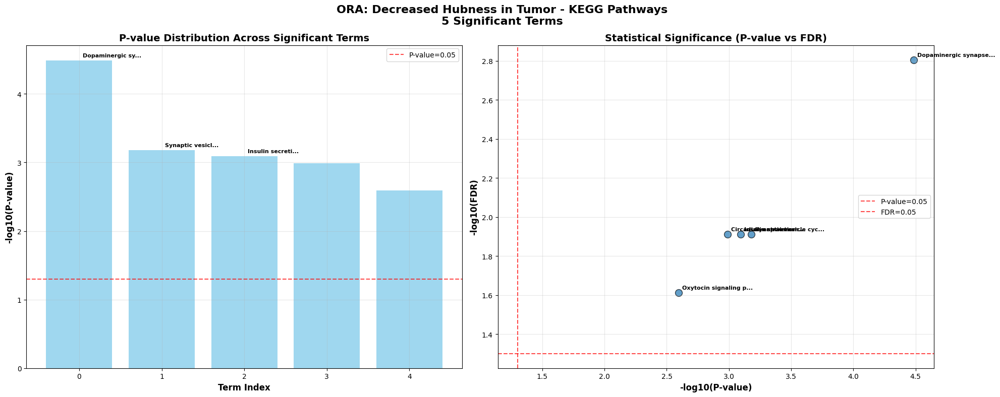

   ✅ KEGG Pathways: 5 terms visualized
   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_decreased_hubness_tumor_Reactome_2022_summary.pdf (Size: 23.80 KB)
   📊 Displaying database summary plot for Reactome Pathways


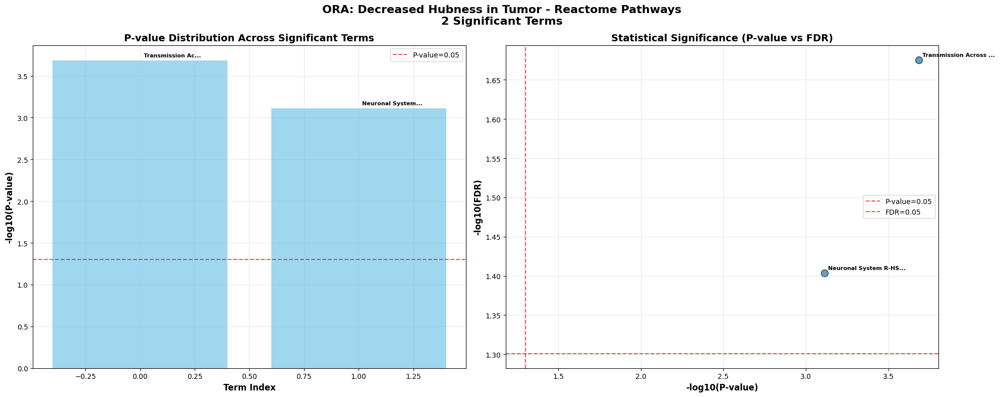

   ✅ Reactome Pathways: 2 terms visualized
   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_decreased_hubness_tumor_WikiPathways_2019_Human_summary.pdf (Size: 25.49 KB)
   📊 Displaying database summary plot for WikiPathways


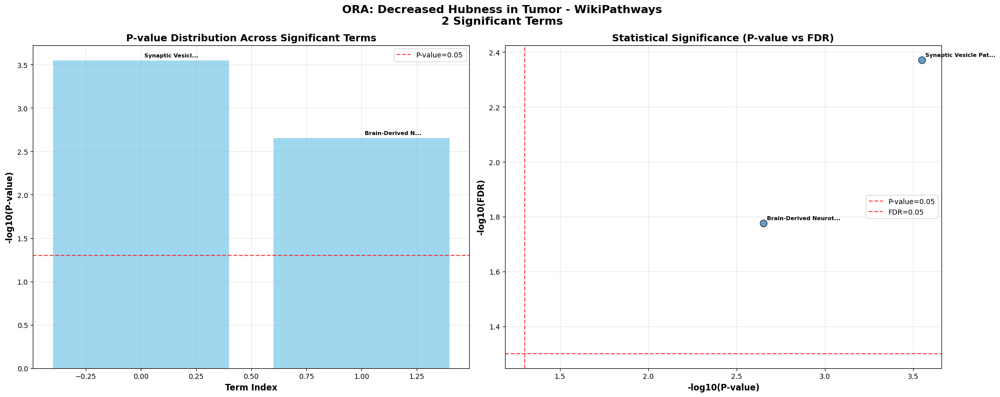

   ✅ WikiPathways: 2 terms visualized

📊 Creating ORA visualizations for ALL TUMOR UPREGULATED...
   ✅ Saved ORA summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_Summary_all_tumor_upregulated.pdf (Size: 35.70 KB)
   📊 Displaying ORA summary plot for all_tumor_upregulated


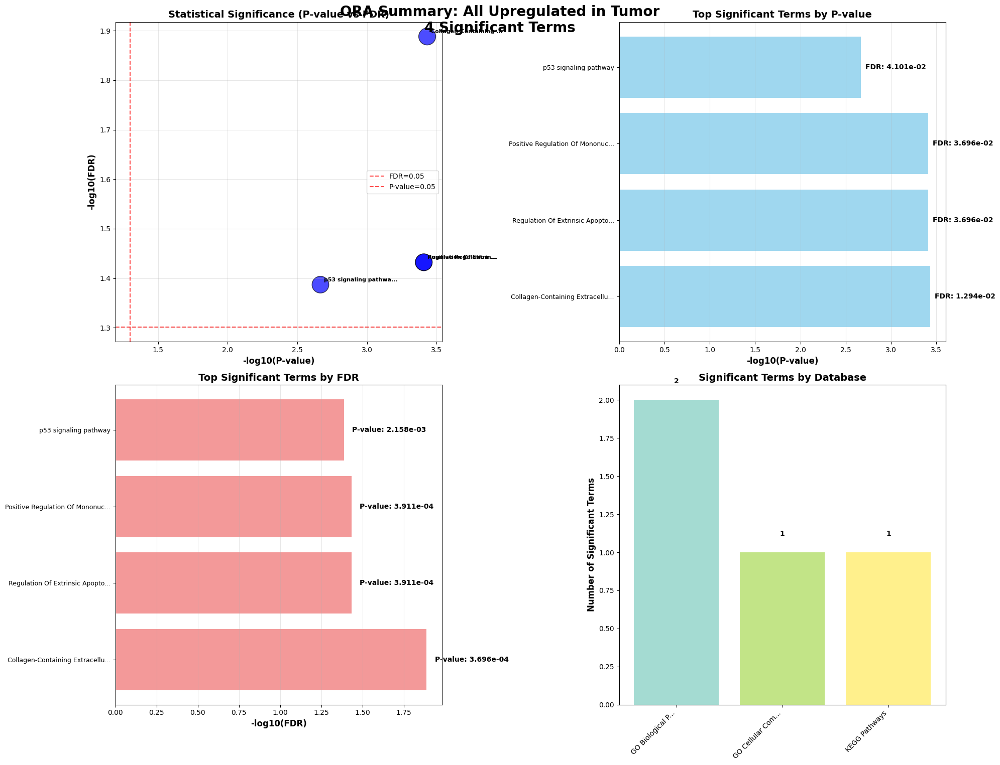

   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_all_tumor_upregulated_GO_Biological_Process_2023_summary.pdf (Size: 24.62 KB)
   📊 Displaying database summary plot for GO Biological Process


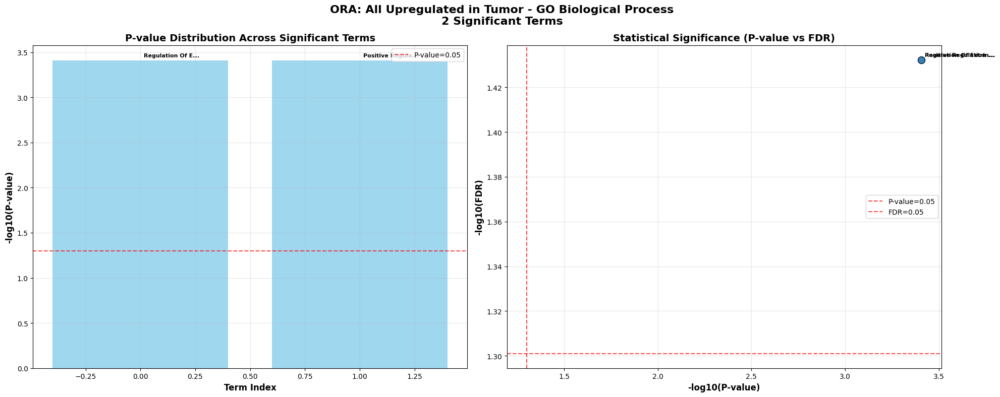

   ✅ GO Biological Process: 2 terms visualized
   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_all_tumor_upregulated_GO_Cellular_Component_2023_summary.pdf (Size: 24.36 KB)
   📊 Displaying database summary plot for GO Cellular Component


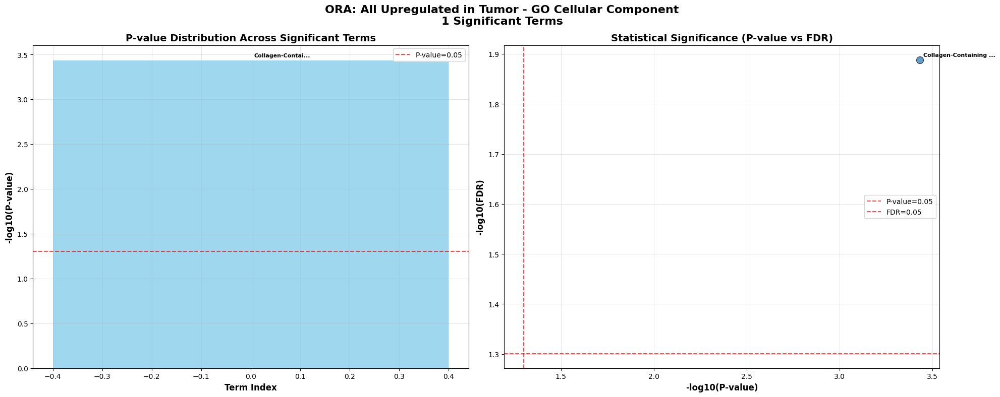

   ✅ GO Cellular Component: 1 terms visualized
   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_all_tumor_upregulated_KEGG_2021_Human_summary.pdf (Size: 25.27 KB)
   📊 Displaying database summary plot for KEGG Pathways


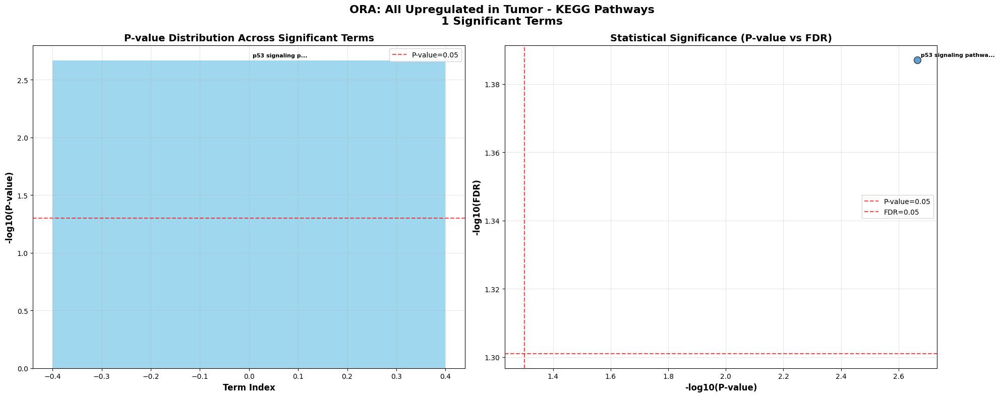

   ✅ KEGG Pathways: 1 terms visualized

📊 Creating ORA visualizations for ALL TUMOR DOWNREGULATED...
   ✅ Saved ORA summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_Summary_all_tumor_downregulated.pdf (Size: 55.76 KB)
   📊 Displaying ORA summary plot for all_tumor_downregulated


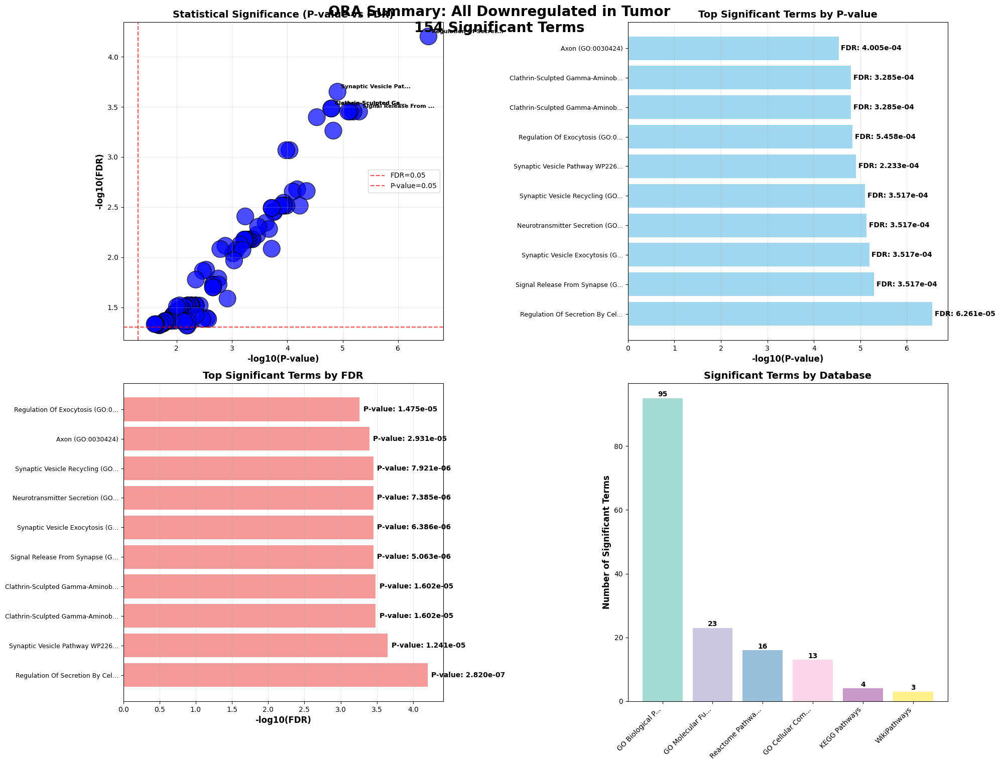

   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_all_tumor_downregulated_GO_Biological_Process_2023_summary.pdf (Size: 28.39 KB)
   📊 Displaying database summary plot for GO Biological Process


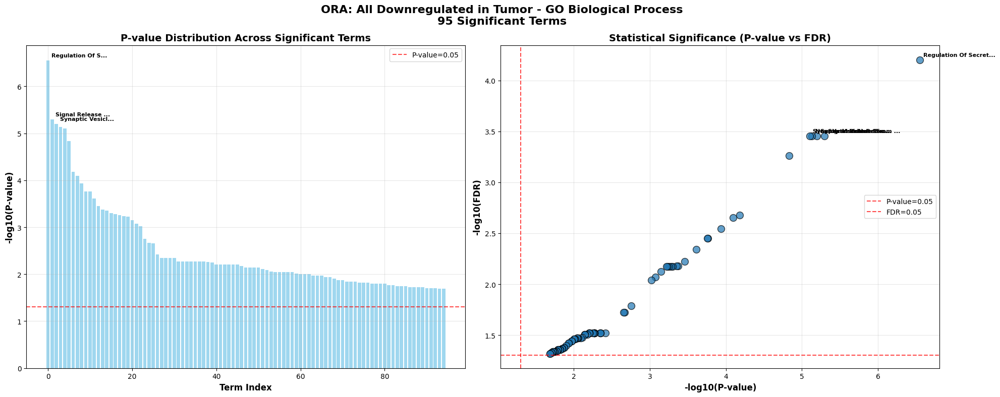

   ✅ GO Biological Process: 95 terms visualized
   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_all_tumor_downregulated_GO_Molecular_Function_2023_summary.pdf (Size: 26.94 KB)
   📊 Displaying database summary plot for GO Molecular Function


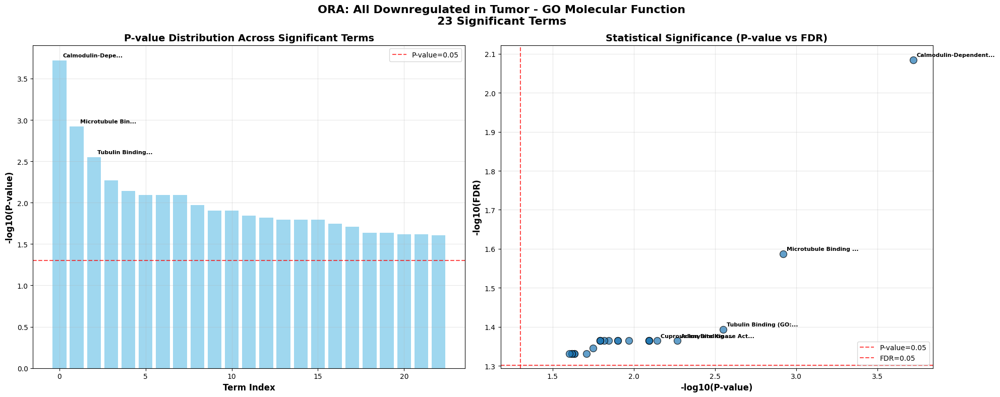

   ✅ GO Molecular Function: 23 terms visualized
   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_all_tumor_downregulated_GO_Cellular_Component_2023_summary.pdf (Size: 25.82 KB)
   📊 Displaying database summary plot for GO Cellular Component


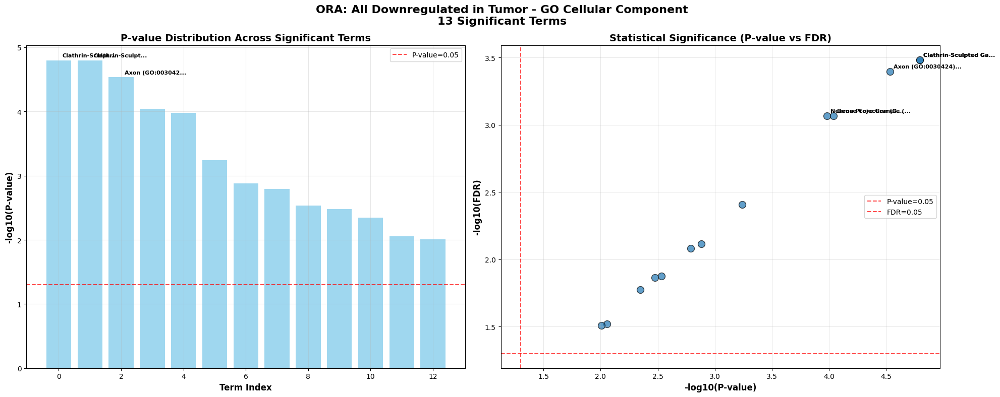

   ✅ GO Cellular Component: 13 terms visualized
   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_all_tumor_downregulated_KEGG_2021_Human_summary.pdf (Size: 25.20 KB)
   📊 Displaying database summary plot for KEGG Pathways


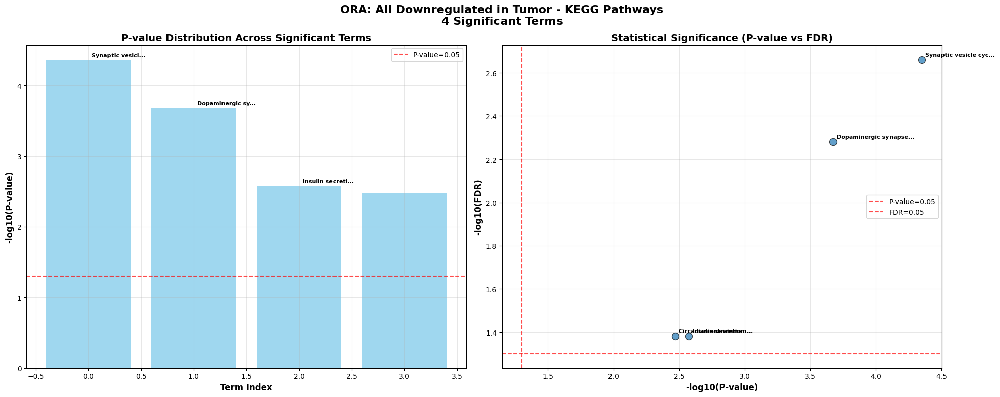

   ✅ KEGG Pathways: 4 terms visualized
   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_all_tumor_downregulated_Reactome_2022_summary.pdf (Size: 25.77 KB)
   📊 Displaying database summary plot for Reactome Pathways


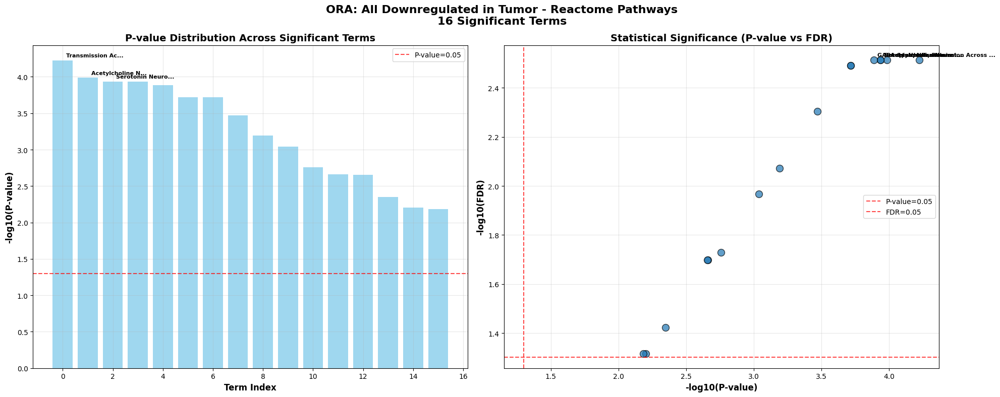

   ✅ Reactome Pathways: 16 terms visualized
   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_all_tumor_downregulated_WikiPathways_2019_Human_summary.pdf (Size: 25.13 KB)
   📊 Displaying database summary plot for WikiPathways


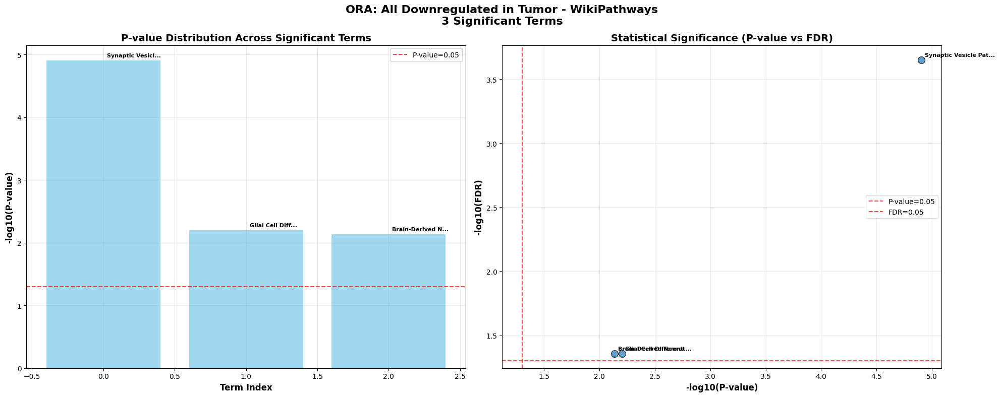

   ✅ WikiPathways: 3 terms visualized

📋 CREATING COMPREHENSIVE ORA REPORT
--------------------------------------------------
Debug: Unique Gene_Set values: ['increased_correlation_tumor' 'decreased_correlation_tumor'
 'increased_hubness_tumor' 'decreased_hubness_tumor'
 'all_tumor_upregulated' 'all_tumor_downregulated']
Debug: Gene_Set type: object
   ✅ Saved ORA results: /kaggle/working/Tissue_Specific_ORA_Results/tissue_specific_ora_complete_results.csv (Size: 90.40 KB)
✅ Complete ORA results saved: 558 significant terms

📊 Creating ORA overview visualization...
Debug: summary_df['Gene_Set'] unique: ['all_tumor_downregulated' 'decreased_hubness_tumor'
 'decreased_correlation_tumor' 'all_tumor_upregulated'
 'increased_correlation_tumor' 'increased_hubness_tumor']
Debug: pval_by_set.index: MultiIndex([('all_tumor_downregulated', 404),
            ('all_tumor_downregulated', 405),
            ('all_tumor_downregulated', 406),
            ('all_tumor_downregulated', 407),
            ('

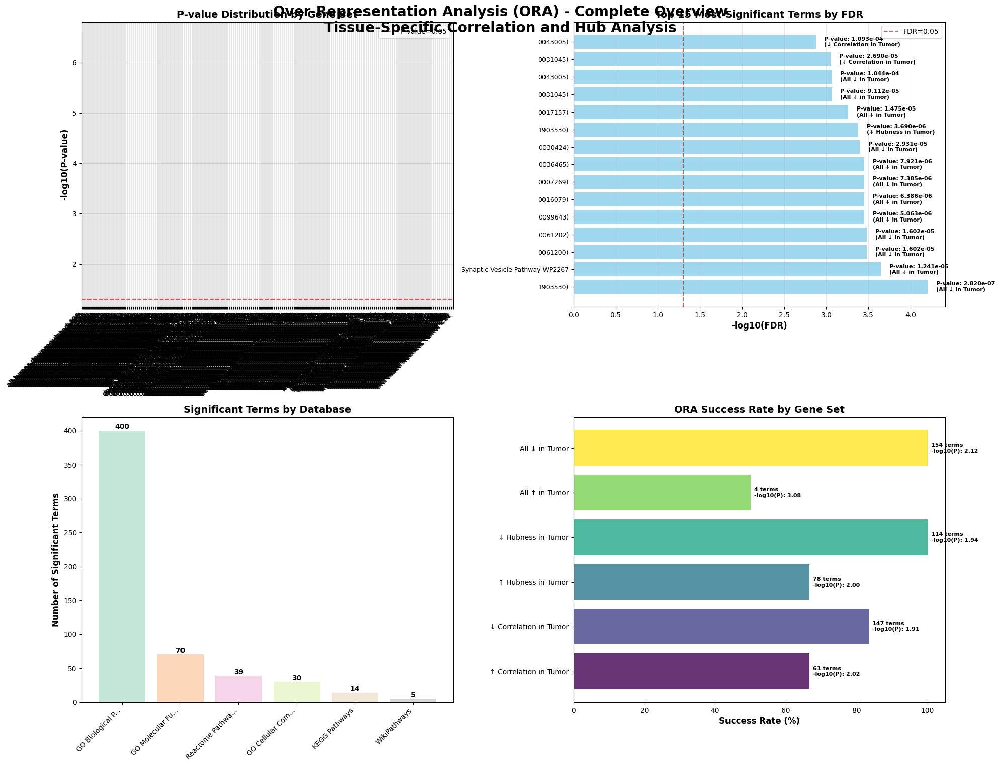


📁 Files in Tissue_Specific_ORA_Results:
   - tissue_specific_ora_complete_results.csv (Size: 90.40 KB)
   - ORA_increased_hubness_tumor_GO_Cellular_Component_2023_summary.pdf (Size: 23.47 KB)
   - ORA_decreased_hubness_tumor_GO_Biological_Process_2023_summary.pdf (Size: 28.96 KB)
   - ORA_Overview_Summary.pdf (Size: 57.38 KB)
   - ORA_decreased_hubness_tumor_GO_Cellular_Component_2023_summary.pdf (Size: 24.63 KB)
   - ORA_decreased_hubness_tumor_WikiPathways_2019_Human_summary.pdf (Size: 25.49 KB)
   - ORA_Summary_decreased_correlation_tumor.pdf (Size: 53.12 KB)
   - ORA_all_tumor_downregulated_GO_Molecular_Function_2023_summary.pdf (Size: 26.94 KB)
   - ORA_decreased_correlation_tumor_KEGG_2021_Human_summary.pdf (Size: 24.72 KB)
   - ORA_Summary_decreased_hubness_tumor.pdf (Size: 52.00 KB)
   - ORA_Summary_all_tumor_upregulated.pdf (Size: 35.70 KB)
   - ORA_decreased_correlation_tumor_GO_Molecular_Function_2023_summary.pdf (Size: 25.22 KB)
   - ORA_all_tumor_upregulated_GO_Biological

In [18]:
# Enable inline plotting in Jupyter
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import gseapy as gp
import warnings
import os
import logging

# Check versions and environment
print(f"pandas version: {pd.__version__}")
if pd.__version__.startswith('2.'):
    print("Note: Using pandas 2.0+, DataFrame.append is deprecated. Using pd.concat instead.")
print(f"matplotlib version: {matplotlib.__version__}")
print(f"Current working directory: {os.getcwd()}")
print(f"Matplotlib backend: {matplotlib.get_backend()}")

warnings.filterwarnings('ignore')
logging.basicConfig(level=logging.INFO)

# Configuration flag to control whether plots are displayed on-screen
DISPLAY_PLOTS = True  # Set to True to display plots in Jupyter

print("=" * 70)
print("ORA FOR TISSUE-SPECIFIC CORRELATION & HUB ANALYSIS")
print("=" * 70)

def create_tissue_specific_gene_sets():
    """Create gene sets from tissue-specific correlation and hub analysis"""
    print("\n🎯 CREATING TISSUE-SPECIFIC GENE SETS")
    print("-" * 50)
    
    gene_sets = {}
    
    # Genes with INCREASED correlation in tumor
    increased_correlation = [
        'FGFBP2', 'SEZ6', 'MOXD1', 'SERPINE1', 'AGAP2', 
        'ENTPD2', 'LGI4', 'ARSI', 'PAMR1', 'RPRM'
    ]
    gene_sets['increased_correlation_tumor'] = increased_correlation
    print(f"✅ Increased correlation in tumor: {len(increased_correlation)} genes")
    
    # Genes with DECREASED correlation in tumor
    decreased_correlation = [
        'CAMK2A', 'SLC24A2', 'PPP1R16B', 'SYT1', 'TPPP',
        'KCNJ9', 'LRRC17', 'NFASC', 'MFAP4', 'KIF1A'
    ]
    gene_sets['decreased_correlation_tumor'] = decreased_correlation
    print(f"✅ Decreased correlation in tumor: {len(decreased_correlation)} genes")
    
    # Genes with INCREASED hubness in tumor
    increased_hubness = [
        'NEFL', 'JPH4', 'VSNL1', 'RGS4', 'SMIM3',
        'LGALS3', 'SLC17A7', 'FMOD', 'AZGP1', 'AGAP2'
    ]
    gene_sets['increased_hubness_tumor'] = increased_hubness
    print(f"✅ Increased hubness in tumor: {len(increased_hubness)} genes")
    
    # Genes with DECREASED hubness in tumor
    decreased_hubness = [
        'AK5', 'KCNJ9', 'CAMKV', 'TMEM130', 'KIF5A',
        'CPLX2', 'CAMK2A', 'RAB3A', 'SNCB', 'FBXL16'
    ]
    gene_sets['decreased_hubness_tumor'] = decreased_hubness
    print(f"✅ Decreased hubness in tumor: {len(decreased_hubness)} genes")
    
    # Combined sets for broader analysis
    all_tumor_upregulated = list(set(increased_correlation + increased_hubness))
    all_tumor_downregulated = list(set(decreased_correlation + decreased_hubness))
    
    gene_sets['all_tumor_upregulated'] = all_tumor_upregulated
    gene_sets['all_tumor_downregulated'] = all_tumor_downregulated
    
    print(f"✅ All tumor upregulated: {len(all_tumor_upregulated)} genes")
    print(f"✅ All tumor downregulated: {len(all_tumor_downregulated)} genes")
    
    return gene_sets

def check_available_databases_ora():
    """Check which databases are available for ORA"""
    print("\n🔍 CHECKING AVAILABLE DATABASES FOR ORA")
    print("-" * 50)
    
    try:
        available_dbs = gp.get_library_name(organism='Human')
        print(f"📚 Found {len(available_dbs)} available databases")
        
        pathway_dbs = [db for db in available_dbs if any(x in db for x in ['GO_', 'KEGG', 'Reactome', 'WikiPathways'])]
        if pathway_dbs:
            print("📊 Available pathway databases:")
            for db in pathway_dbs[:5]:
                print(f"   - {db}")
                
        return available_dbs
        
    except Exception as e:
        print(f"❌ Error checking databases: {e}")
        return []

def get_updated_databases_ora(available_dbs):
    """Get updated database list for ORA based on availability"""
    
    preferred_dbs = {
        'GO_Biological_Process_2023': 'GO Biological Process',
        'GO_Molecular_Function_2023': 'GO Molecular Function',
        'GO_Cellular_Component_2023': 'GO Cellular Component',
        'KEGG_2021_Human': 'KEGG Pathways',
        'Reactome_2022': 'Reactome Pathways',
        'WikiPathways_2021_Human': 'WikiPathways'
    }
    
    db_alternatives = {
        'GO_Biological_Process_2023': ['GO_Biological_Process_2021', 'GO_Biological_Process_2018'],
        'GO_Molecular_Function_2023': ['GO_Molecular_Function_2021', 'GO_Molecular_Function_2018'],
        'GO_Cellular_Component_2023': ['GO_Cellular_Component_2021', 'GO_Cellular_Component_2018'],
        'KEGG_2021_Human': ['KEGG_2019_Human', 'KEGG_2016'],
        'Reactome_2022': ['Reactome_2016', 'Reactome_2015'],
        'WikiPathways_2021_Human': ['WikiPathways_2019_Human', 'WikiPathways_2016']
    }
    
    updated_dbs = {}
    for db_key, db_desc in preferred_dbs.items():
        if db_key in available_dbs:
            updated_dbs[db_key] = db_desc
            print(f"   ✅ {db_desc}: Available")
        else:
            found_alternative = False
            if db_key in db_alternatives:
                for alt_db in db_alternatives[db_key]:
                    if alt_db in available_dbs:
                        updated_dbs[alt_db] = db_desc
                        print(f"   🔄 {db_desc}: Using {alt_db} instead")
                        found_alternative = True
                        break
            if not found_alternative:
                print(f"   ❌ {db_desc}: No alternatives found")
    
    return updated_dbs

def perform_tissue_specific_ora(gene_sets):
    """Perform ORA analysis for tissue-specific gene sets"""
    print("\n🎯 PERFORMING TISSUE-SPECIFIC ORA ANALYSIS")
    print("-" * 60)
    
    ora_results = {}
    summary_stats = {}
    
    available_dbs = check_available_databases_ora()
    databases = get_updated_databases_ora(available_dbs)
    
    if not databases:
        print("❌ No valid databases found for ORA")
        return {}, {}
    
    print(f"\n📊 Using {len(databases)} databases for ORA:")
    for db_name, db_desc in databases.items():
        print(f"   • {db_desc} ({db_name})")
    
    for set_name, genes in gene_sets.items():
        print(f"\n🔬 Analyzing {set_name.replace('_', ' ').upper()} ({len(genes)} genes)...")
        print("-" * 50)
        
        if len(genes) < 3:
            print(f"   ⚠️ Too few genes for ORA: {len(genes)}")
            continue
        
        set_results = {}
        set_stats = {
            'total_genes': len(genes),
            'significant_terms': 0,
            'databases_with_results': 0
        }
        
        for db_name, db_description in databases.items():
            try:
                print(f"   📊 Testing {db_description}...")
                
                # Perform ORA
                enr = gp.enrichr(
                    gene_list=genes,
                    gene_sets=db_name,
                    organism='Human',
                    outdir=None,
                    cutoff=0.05
                )
                
                if enr.results is not None and len(enr.results) > 0:
                    # Filter for significant results (FDR < 0.05)
                    sig_results = enr.results[enr.results['Adjusted P-value'] < 0.05].copy()
                    sig_results['Term'] = sig_results['Term'].astype(str)  # Ensure Term is string
                    
                    if len(sig_results) > 0:
                        set_results[db_name] = {
                            'description': db_description,
                            'all_terms': enr.results,
                            'significant_terms': sig_results,
                            'num_significant': len(sig_results)
                        }
                        
                        set_stats['significant_terms'] += len(sig_results)
                        set_stats['databases_with_results'] += 1
                        
                        print(f"   ✅ {db_description}: {len(sig_results)} significant terms")
                        
                        # Show top 3 terms
                        top_terms = sig_results.head(3)
                        for i, (_, term) in enumerate(top_terms.iterrows()):
                            print(f"      {i+1}. {term['Term'][:50]}... (FDR: {term['Adjusted P-value']:.2e})")
                    else:
                        print(f"   ⚠️ {db_description}: No terms pass FDR < 0.05")
                else:
                    print(f"   ❌ {db_description}: No results returned")
                    
            except Exception as e:
                error_msg = str(e)
                print(f"   ❌ Error in {db_description}: {error_msg[:80]}...")
        
        if set_results:
            ora_results[set_name] = set_results
            summary_stats[set_name] = set_stats
            print(f"   🎯 SUMMARY: {set_stats['databases_with_results']} databases with {set_stats['significant_terms']} total significant terms")
        else:
            print(f"   ⚠️ No significant results for {set_name}")
    
    return ora_results, summary_stats

def create_tissue_specific_visualizations(ora_results, summary_stats, output_dir="Tissue_Specific_ORA_Results"):
    """Create GSEA-style visualizations for tissue-specific ORA results"""
    print(f"\n🎨 CREATING TISSUE-SPECIFIC ORA VISUALIZATIONS")
    print("-" * 50)
    
    if not os.path.exists(output_dir):
        try:
            os.makedirs(output_dir)
            print(f"   ✅ Created output directory: {os.path.abspath(output_dir)}")
        except Exception as e:
            print(f"   ❌ Failed to create output directory {output_dir}: {e}")
            return {}
    
    all_plots = {}
    
    for set_name, databases in ora_results.items():
        print(f"\n📊 Creating ORA visualizations for {set_name.replace('_', ' ').upper()}...")
        set_plots = {}
        
        create_ora_summary_plot(set_name, databases, output_dir)
        
        for db_name, db_data in databases.items():
            try:
                sig_terms = db_data['significant_terms']
                db_description = db_data['description']
                
                if len(sig_terms) == 0:
                    print(f"   ⚠️ No significant terms for {db_description}")
                    continue
                
                create_database_summary_plot(set_name, db_name, db_data, output_dir)
                
                print(f"   ✅ {db_description}: {len(sig_terms)} terms visualized")
                
            except Exception as e:
                print(f"   ❌ Error creating database summary plot for {db_description}: {e}")
        
        all_plots[set_name] = set_plots
    
    if ora_results:
        create_ora_comprehensive_report(ora_results, summary_stats, output_dir)
    
    if os.path.exists(output_dir):
        print(f"\n📁 Files in {output_dir}:")
        for file in os.listdir(output_dir):
            file_path = os.path.join(output_dir, file)
            file_size = os.path.getsize(file_path) / 1024
            print(f"   - {file} (Size: {file_size:.2f} KB)")
    
    return all_plots

def create_ora_summary_plot(set_name, databases, output_dir):
    """Create GSEA-style summary plot for ORA results"""
    try:
        all_terms = []
        for db_name, db_data in databases.items():
            for _, term in db_data['significant_terms'].iterrows():
                all_terms.append({
                    'Database': db_data['description'],
                    'Term': str(term['Term']),  # Ensure Term is string
                    'P-value': term['P-value'],
                    'FDR': term['Adjusted P-value'],
                    'Overlap': int(term['Overlap'].split('/')[0]),
                    'Genes': term.get('Genes', 'NA')
                })
        
        if not all_terms:
            print(f"   ⚠️ No significant terms for {set_name}")
            return
        
        summary_df = pd.DataFrame(all_terms)
        
        title_map = {
            'increased_correlation_tumor': 'Increased Correlation in Tumor',
            'decreased_correlation_tumor': 'Decreased Correlation in Tumor',
            'increased_hubness_tumor': 'Increased Hubness in Tumor',
            'decreased_hubness_tumor': 'Decreased Hubness in Tumor',
            'all_tumor_upregulated': 'All Upregulated in Tumor',
            'all_tumor_downregulated': 'All Downregulated in Tumor'
        }
        display_name = title_map.get(set_name, set_name.replace('_', ' ').title())
        
        fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 16))
        fig.suptitle(f'ORA Summary: {display_name}\n{len(summary_df)} Significant Terms', 
                    fontsize=20, fontweight='bold', y=0.95)
        
        # Plot 1: Scatter of P-value vs FDR
        colors = ['blue' for _ in summary_df['FDR']]
        sizes = 100 + (1 - summary_df['FDR']) * 500
        
        scatter = ax1.scatter(-np.log10(summary_df['P-value']), -np.log10(summary_df['FDR']),
                            c=colors, s=sizes, alpha=0.7, edgecolors='black')
        
        ax1.axhline(y=-np.log10(0.05), color='red', linestyle='--', alpha=0.7, label='FDR=0.05')
        ax1.axvline(x=-np.log10(0.05), color='red', linestyle='--', alpha=0.7, label='P-value=0.05')
        ax1.set_xlabel('-log10(P-value)', fontsize=12, fontweight='bold')
        ax1.set_ylabel('-log10(FDR)', fontsize=12, fontweight='bold')
        ax1.set_title('Statistical Significance (P-value vs FDR)', fontsize=14, fontweight='bold')
        ax1.legend()
        ax1.grid(True, alpha=0.3)
        
        for i, row in summary_df.nsmallest(5, 'FDR').iterrows():
            ax1.annotate(row['Term'][:20] + '...', 
                        (-np.log10(row['P-value']), -np.log10(row['FDR'])),
                        xytext=(5, 5), textcoords='offset points',
                        fontsize=8, fontweight='bold')
        
        # Plot 2: Top terms by P-value
        top_pval = summary_df.nsmallest(10, 'P-value')
        y_pos = np.arange(len(top_pval))
        
        bars = ax2.barh(y_pos, -np.log10(top_pval['P-value']), color='skyblue', alpha=0.8)
        ax2.set_yticks(y_pos)
        clean_terms = [term[:30] + '...' if len(term) > 30 else term for term in top_pval['Term']]
        ax2.set_yticklabels(clean_terms, fontsize=9)
        ax2.set_xlabel('-log10(P-value)', fontsize=12, fontweight='bold')
        ax2.set_title('Top Significant Terms by P-value', fontsize=14, fontweight='bold')
        ax2.grid(True, alpha=0.3, axis='x')
        
        for i, bar in enumerate(bars):
            width = bar.get_width()
            fdr = top_pval.iloc[i]['FDR']
            ax2.text(width + 0.05, bar.get_y() + bar.get_height()/2,
                   f'FDR: {fdr:.3e}', ha='left', va='center', fontweight='bold')
        
        # Plot 3: Top terms by FDR
        top_fdr = summary_df.nsmallest(10, 'FDR')
        y_pos = np.arange(len(top_fdr))
        
        bars = ax3.barh(y_pos, -np.log10(top_fdr['FDR']), color='lightcoral', alpha=0.8)
        ax3.set_yticks(y_pos)
        clean_terms = [term[:30] + '...' if len(term) > 30 else term for term in top_fdr['Term']]
        ax3.set_yticklabels(clean_terms, fontsize=9)
        ax3.set_xlabel('-log10(FDR)', fontsize=12, fontweight='bold')
        ax3.set_title('Top Significant Terms by FDR', fontsize=14, fontweight='bold')
        ax3.grid(True, alpha=0.3, axis='x')
        
        for i, bar in enumerate(bars):
            width = bar.get_width()
            pval = top_fdr.iloc[i]['P-value']
            ax3.text(width + 0.05, bar.get_y() + bar.get_height()/2,
                   f'P-value: {pval:.3e}', ha='left', va='center', fontweight='bold')
        
        # Plot 4: Terms by Database
        db_counts = summary_df['Database'].value_counts()
        colors = plt.cm.Set3(np.linspace(0, 1, len(db_counts)))
        
        bars = ax4.bar(range(len(db_counts)), db_counts.values, color=colors, alpha=0.8)
        ax4.set_xticks(range(len(db_counts)))
        ax4.set_xticklabels([db[:15] + '...' if len(db) > 15 else db for db in db_counts.index], 
                           rotation=45, ha='right')
        ax4.set_ylabel('Number of Significant Terms', fontsize=12, fontweight='bold')
        ax4.set_title('Significant Terms by Database', fontsize=14, fontweight='bold')
        
        for bar in bars:
            height = bar.get_height()
            ax4.text(bar.get_x() + bar.get_width()/2., height + 0.1,
                    f'{int(height)}', ha='center', va='bottom', fontweight='bold')
        
        plt.tight_layout()
        summary_file = os.path.join(output_dir, f"ORA_Summary_{set_name}.pdf")
        plt.savefig(summary_file, dpi=300, bbox_inches='tight')
        if os.path.exists(summary_file):
            file_size = os.path.getsize(summary_file) / 1024
            print(f"   ✅ Saved ORA summary plot: {os.path.abspath(summary_file)} (Size: {file_size:.2f} KB)")
        else:
            print(f"   ❌ Failed to save ORA summary plot: {summary_file}")
        
        if DISPLAY_PLOTS:
            print(f"   📊 Displaying ORA summary plot for {set_name}")
            plt.show()
        
        plt.close()
        
    except Exception as e:
        print(f"   ❌ Error creating ORA summary plot for {set_name}: {e}")

def create_database_summary_plot(set_name, db_name, db_data, output_dir):
    """Create GSEA-style database-specific summary plot"""
    try:
        sig_terms = db_data['significant_terms']
        db_description = db_data['description']
        
        if len(sig_terms) == 0:
            print(f"   ⚠️ No significant terms for {db_description}")
            return
        
        # Ensure Term column is string
        sig_terms['Term'] = sig_terms['Term'].astype(str)
        
        title_map = {
            'increased_correlation_tumor': 'Increased Correlation in Tumor',
            'decreased_correlation_tumor': 'Decreased Correlation in Tumor',
            'increased_hubness_tumor': 'Increased Hubness in Tumor',
            'decreased_hubness_tumor': 'Decreased Hubness in Tumor',
            'all_tumor_upregulated': 'All Upregulated in Tumor',
            'all_tumor_downregulated': 'All Downregulated in Tumor'
        }
        display_name = title_map.get(set_name, set_name.replace('_', ' ').title())
        
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))
        fig.suptitle(f'ORA: {display_name} - {db_description}\n{len(sig_terms)} Significant Terms', 
                    fontsize=16, fontweight='bold')
        
        # Plot 1: Bar plot of P-value
        pval_values = -np.log10(sig_terms['P-value'])
        colors = ['skyblue' for _ in pval_values]
        
        bars = ax1.bar(range(len(pval_values)), pval_values, color=colors, alpha=0.8)
        ax1.set_xlabel('Term Index', fontsize=12, fontweight='bold')
        ax1.set_ylabel('-log10(P-value)', fontsize=12, fontweight='bold')
        ax1.set_title('P-value Distribution Across Significant Terms', fontsize=14, fontweight='bold')
        ax1.axhline(y=-np.log10(0.05), color='red', linestyle='--', alpha=0.7, label='P-value=0.05')
        ax1.grid(True, alpha=0.3)
        ax1.legend()
        
        # Annotate top 3 terms using index
        top_terms = sig_terms.nsmallest(3, 'P-value')
        for idx, row in top_terms.iterrows():
            ax1.annotate(row['Term'][:15] + '...', 
                        (idx, -np.log10(row['P-value'])),
                        xytext=(5, 5), textcoords='offset points',
                        fontsize=8, fontweight='bold')
        
        # Plot 2: Scatter of P-value vs FDR
        scatter = ax2.scatter(-np.log10(sig_terms['P-value']), -np.log10(sig_terms['Adjusted P-value']),
                            s=100, alpha=0.7, edgecolors='black')
        ax2.set_xlabel('-log10(P-value)', fontsize=12, fontweight='bold')
        ax2.set_ylabel('-log10(FDR)', fontsize=12, fontweight='bold')
        ax2.set_title('Statistical Significance (P-value vs FDR)', fontsize=14, fontweight='bold')
        ax2.axvline(x=-np.log10(0.05), color='red', linestyle='--', alpha=0.7, label='P-value=0.05')
        ax2.axhline(y=-np.log10(0.05), color='red', linestyle='--', alpha=0.7, label='FDR=0.05')
        ax2.legend()
        ax2.grid(True, alpha=0.3)
        
        top_terms = sig_terms.nsmallest(5, 'Adjusted P-value')
        for idx, row in top_terms.iterrows():
            ax2.annotate(row['Term'][:20] + '...', 
                        (-np.log10(row['P-value']), -np.log10(row['Adjusted P-value'])),
                        xytext=(5, 5), textcoords='offset points',
                        fontsize=8, fontweight='bold')
        
        plt.tight_layout()
        plot_file = os.path.join(output_dir, f"ORA_{set_name}_{db_name}_summary.pdf")
        plt.savefig(plot_file, dpi=300, bbox_inches='tight')
        if os.path.exists(plot_file):
            file_size = os.path.getsize(plot_file) / 1024
            print(f"   ✅ Saved database summary plot: {os.path.abspath(plot_file)} (Size: {file_size:.2f} KB)")
        else:
            print(f"   ❌ Failed to save database summary plot: {plot_file}")
        
        if DISPLAY_PLOTS:
            print(f"   📊 Displaying database summary plot for {db_description}")
            plt.show()
        
        plt.close()
        
    except Exception as e:
        print(f"   ❌ Error creating database summary plot for {db_description}: {e}")

def create_ora_comprehensive_report(ora_results, summary_stats, output_dir="Tissue_Specific_ORA_Results"):
    """Create comprehensive ORA report"""
    print(f"\n📋 CREATING COMPREHENSIVE ORA REPORT")
    print("-" * 50)
    
    all_terms = []
    
    for set_name, databases in ora_results.items():
        for db_name, db_data in databases.items():
            for _, term in db_data['significant_terms'].iterrows():
                all_terms.append({
                    'Gene_Set': str(set_name),  # Ensure Gene_Set is string
                    'Database': db_data['description'],
                    'Term': str(term['Term']),
                    'P-value': term['P-value'],
                    'FDR': term['Adjusted P-value'],
                    'Odds_Ratio': term['Odds Ratio'],
                    'Overlap': term['Overlap'],
                    'Overlap_Genes': term.get('Genes', 'NA')
                })
    
    if all_terms:
        summary_df = pd.DataFrame(all_terms)
        
        # Debug: Check Gene_Set column
        print(f"Debug: Unique Gene_Set values: {summary_df['Gene_Set'].unique()}")
        print(f"Debug: Gene_Set type: {summary_df['Gene_Set'].dtype}")
        
        summary_df['Pval_neg_log10'] = -np.log10(summary_df['P-value'])
        summary_df = summary_df.sort_values(['Pval_neg_log10', 'FDR'], ascending=[False, True])
        summary_df = summary_df.drop('Pval_neg_log10', axis=1)
        
        os.makedirs(output_dir, exist_ok=True)
        results_file = os.path.join(output_dir, 'tissue_specific_ora_complete_results.csv')
        summary_df.to_csv(results_file, index=False)
        if os.path.exists(results_file):
            file_size = os.path.getsize(results_file) / 1024
            print(f"   ✅ Saved ORA results: {os.path.abspath(results_file)} (Size: {file_size:.2f} KB)")
        else:
            print(f"   ❌ Failed to save ORA results: {results_file}")
        
        print(f"✅ Complete ORA results saved: {len(summary_df)} significant terms")
        
        create_ora_overview_visualization(summary_df, summary_stats, output_dir)
        
        return summary_df
    else:
        print("❌ No significant terms found in ORA analysis")
        return pd.DataFrame()

def create_ora_overview_visualization(summary_df, summary_stats, output_dir):
    """Create GSEA-style overview visualization of all ORA results"""
    print("\n📊 Creating ORA overview visualization...")
    
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 16))
    fig.suptitle('Over-Representation Analysis (ORA) - Complete Overview\nTissue-Specific Correlation and Hub Analysis', 
                fontsize=20, fontweight='bold', y=0.95)
    
    title_map = {
        'increased_correlation_tumor': '↑ Correlation in Tumor',
        'decreased_correlation_tumor': '↓ Correlation in Tumor',
        'increased_hubness_tumor': '↑ Hubness in Tumor',
        'decreased_hubness_tumor': '↓ Hubness in Tumor',
        'all_tumor_upregulated': 'All ↑ in Tumor',
        'all_tumor_downregulated': 'All ↓ in Tumor'
    }
    
    try:
        if len(summary_df) > 0:
            # Debug: Check index before grouping
            print(f"Debug: summary_df['Gene_Set'] unique: {summary_df['Gene_Set'].unique()}")
            pval_by_set = summary_df.groupby('Gene_Set')['P-value'].apply(lambda x: -np.log10(x))
            print(f"Debug: pval_by_set.index: {pval_by_set.index}")
            
            violin_parts = ax1.violinplot(pval_by_set.values, showmeans=True, showmedians=True)
            ax1.set_xticks(range(1, len(pval_by_set) + 1))
            # Handle potential tuple or non-string indices
            labels = []
            for set_name in pval_by_set.index:
                if isinstance(set_name, tuple):
                    set_name = '_'.join(map(str, set_name))  # Convert tuple to string
                labels.append(title_map.get(set_name, set_name.replace('_', ' ')))
            ax1.set_xticklabels(labels, rotation=45, ha='right')
            ax1.set_ylabel('-log10(P-value)', fontsize=12, fontweight='bold')
            ax1.set_title('P-value Distribution by Gene Set', fontsize=14, fontweight='bold')
            ax1.axhline(y=-np.log10(0.05), color='red', linestyle='--', alpha=0.7, label='P-value=0.05')
            ax1.grid(True, alpha=0.3)
            ax1.legend()
            
            for pc, color in zip(violin_parts['bodies'], plt.cm.Set3(np.linspace(0, 1, len(pval_by_set)))):
                pc.set_facecolor(color)
                pc.set_alpha(0.7)
        
        if len(summary_df) > 0:
            top_terms = summary_df.nsmallest(15, 'FDR')
            y_pos = np.arange(len(top_terms))
            
            bars = ax2.barh(y_pos, -np.log10(top_terms['FDR']), color='skyblue', alpha=0.8)
            ax2.set_yticks(y_pos)
            
            clean_terms = []
            for term in top_terms['Term']:
                clean_name = term.split(':')[-1] if ':' in term else term
                clean_name = clean_name.split(' (')[0] if ' (' in clean_name else clean_name
                clean_terms.append(clean_name[:40] + '...' if len(clean_name) > 40 else clean_name)
            
            ax2.set_yticklabels(clean_terms, fontsize=9)
            ax2.set_xlabel('-log10(FDR)', fontsize=12, fontweight='bold')
            ax2.set_title('Top 15 Most Significant Terms by FDR', fontsize=14, fontweight='bold')
            ax2.axvline(x=-np.log10(0.05), color='red', linestyle='--', alpha=0.7, label='FDR=0.05')
            ax2.grid(True, alpha=0.3, axis='x')
            ax2.legend()
            
            for i, bar in enumerate(bars):
                width = bar.get_width()
                pval = top_terms.iloc[i]['P-value']
                gene_set = title_map.get(str(top_terms.iloc[i]['Gene_Set']), 
                                      str(top_terms.iloc[i]['Gene_Set']).replace('_', ' '))
                ax2.text(width + 0.1, bar.get_y() + bar.get_height()/2,
                       f'P-value: {pval:.3e}\n({gene_set})', 
                       ha='left', va='center', fontsize=8, fontweight='bold')
        
        if len(summary_df) > 0:
            db_counts = summary_df['Database'].value_counts()
            colors = plt.cm.Pastel2(np.linspace(0, 1, len(db_counts)))
            
            bars = ax3.bar(range(len(db_counts)), db_counts.values, color=colors, alpha=0.8)
            ax3.set_xticks(range(len(db_counts)))
            ax3.set_xticklabels([db[:15] + '...' if len(db) > 15 else db for db in db_counts.index], 
                               rotation=45, ha='right')
            ax3.set_ylabel('Number of Significant Terms', fontsize=12, fontweight='bold')
            ax3.set_title('Significant Terms by Database', fontsize=14, fontweight='bold')
            
            for bar in bars:
                height = bar.get_height()
                ax3.text(bar.get_x() + bar.get_width()/2., height + 0.1,
                        f'{int(height)}', ha='center', va='bottom', fontweight='bold')
        
        if summary_stats:
            success_data = []
            for set_name, stats in summary_stats.items():
                # Calculate success rate based on databases with results
                success_rate = (stats['databases_with_results'] / 6) * 100  # Assuming 6 databases
                set_terms = summary_df[summary_df['Gene_Set'] == str(set_name)]
                avg_pval = -np.log10(set_terms['P-value'].mean()) if len(set_terms) > 0 else 0
                
                success_data.append({
                    'Gene_Set': title_map.get(set_name, set_name.replace('_', ' ')),
                    'Success_Rate': success_rate,
                    'Total_Terms': stats['significant_terms'],
                    'Avg_neg_log10_Pval': avg_pval
                })
            
            success_df = pd.DataFrame(success_data)
            
            if len(success_df) > 0:
                y_pos = np.arange(len(success_df))
                colors = plt.cm.viridis(np.linspace(0, 1, len(success_df)))
                
                bars = ax4.barh(y_pos, success_df['Success_Rate'], color=colors, alpha=0.8)
                ax4.set_yticks(y_pos)
                ax4.set_yticklabels(success_df['Gene_Set'])
                ax4.set_xlabel('Success Rate (%)', fontsize=12, fontweight='bold')
                ax4.set_title('ORA Success Rate by Gene Set', fontsize=14, fontweight='bold')
                
                for i, bar in enumerate(bars):
                    width = bar.get_width()
                    total_terms = success_df.iloc[i]['Total_Terms']
                    avg_pval = success_df.iloc[i]['Avg_neg_log10_Pval']
                    ax4.text(width + 1, bar.get_y() + bar.get_height()/2,
                           f'{total_terms} terms\n-log10(P): {avg_pval:.2f}', 
                           ha='left', va='center', fontsize=8, fontweight='bold')
        
        plt.tight_layout()
        plot_file = os.path.join(output_dir, 'ORA_Overview_Summary.pdf')
        plt.savefig(plot_file, dpi=300, bbox_inches='tight')
        if os.path.exists(plot_file):
            file_size = os.path.getsize(plot_file) / 1024
            print(f"   ✅ Saved ORA overview plot: {os.path.abspath(plot_file)} (Size: {file_size:.2f} KB)")
        else:
            print(f"   ❌ Failed to save ORA overview plot: {plot_file}")
        
        if DISPLAY_PLOTS:
            print(f"   📊 Displaying ORA overview plot")
            plt.show()
        
        plt.close()
        
    except Exception as e:
        print(f"❌ Error creating ORA overview visualization: {e}")

def save_tissue_specific_results(ora_results, gene_sets, summary_stats, output_dir="Tissue_Specific_ORA_Results"):
    """Save comprehensive results for tissue-specific analysis"""
    print(f"\n💾 SAVING TISSUE-SPECIFIC ORA RESULTS")
    print("-" * 40)
    
    os.makedirs(output_dir, exist_ok=True)
    
    # Save gene sets
    gene_sets_df = pd.DataFrame([
        {'Gene_Set': str(set_name), 'Gene': gene} 
        for set_name, genes in gene_sets.items() 
        for gene in genes
    ])
    gene_sets_file = os.path.join(output_dir, 'tissue_specific_gene_sets.csv')
    gene_sets_df.to_csv(gene_sets_file, index=False)
    if os.path.exists(gene_sets_file):
        file_size = os.path.getsize(gene_sets_file) / 1024
        print(f"✅ Gene sets saved: {os.path.abspath(gene_sets_file)} (Size: {file_size:.2f} KB)")
    else:
        print(f"❌ Failed to save gene sets: {gene_sets_file}")
    
    # Save complete ORA results
    all_terms = []
    for set_name, databases in ora_results.items():
        for db_name, db_data in databases.items():
            for _, term in db_data['significant_terms'].iterrows():
                all_terms.append({
                    'Gene_Set': str(set_name),
                    'Database': db_data['description'],
                    'Term': str(term['Term']),
                    'P-value': term['P-value'],
                    'FDR': term['Adjusted P-value'],
                    'Odds_Ratio': term['Odds Ratio'],
                    'Overlap': term['Overlap'],
                    'Overlap_Genes': term.get('Genes', 'NA')
                })
    
    if all_terms:
        results_df = pd.DataFrame(all_terms)
        results_df['Pval_neg_log10'] = -np.log10(results_df['P-value'])
        results_df = results_df.sort_values(['Pval_neg_log10', 'FDR'], ascending=[False, True])
        results_df = results_df.drop('Pval_neg_log10', axis=1)
        
        results_file = os.path.join(output_dir, 'tissue_specific_ora_complete_results.csv')
        results_df.to_csv(results_file, index=False)
        if os.path.exists(results_file):
            file_size = os.path.getsize(results_file) / 1024
            print(f"✅ Complete ORA results saved: {os.path.abspath(results_file)} (Size: {file_size:.2f} KB)")
        else:
            print(f"❌ Failed to save ORA results: {results_file}")
        
        # Save summary statistics
        summary_data = []
        for set_name, stats in summary_stats.items():
            summary_data.append({
                'Gene_Set': str(set_name),
                'Databases_With_Results': stats['databases_with_results'],
                'Total_Significant_Terms': stats['significant_terms']
            })
        
        summary_df = pd.DataFrame(summary_data)
        summary_file = os.path.join(output_dir, 'tissue_specific_ora_summary.csv')
        summary_df.to_csv(summary_file, index=False)
        if os.path.exists(summary_file):
            file_size = os.path.getsize(summary_file) / 1024
            print(f"✅ Summary statistics saved: {os.path.abspath(summary_file)} (Size: {file_size:.2f} KB)")
        else:
            print(f"❌ Failed to save summary statistics: {summary_file}")
    
    print(f"📁 All results saved in: {os.path.abspath(output_dir)}/")

# Main Tissue-Specific ORA Analysis
print("🚀 STARTING TISSUE-SPECIFIC ORA ANALYSIS")

# 1. Create tissue-specific gene sets
gene_sets = create_tissue_specific_gene_sets()

if not gene_sets:
    print("❌ No gene sets created. Analysis cannot proceed.")
    exit()

# 2. Perform ORA analysis
print("\n" + "="*50)
print("STEP 1: ORA ANALYSIS EXECUTION")
print("="*50)
ora_results, summary_stats = perform_tissue_specific_ora(gene_sets)

# 3. Create visualizations
print("\n" + "="*50)
print("STEP 2: VISUALIZATION CREATION")
print("="*50)
if ora_results:
    ora_plots = create_tissue_specific_visualizations(ora_results, summary_stats)
else:
    print("❌ No ORA results to visualize")
    ora_plots = {}

# 4. Save results
print("\n" + "="*50)
print("STEP 3: RESULTS SAVING")
print("="*50)
if ora_results:
    save_tissue_specific_results(ora_results, gene_sets, summary_stats)
else:
    print("❌ No ORA results to save")

# Final Report
print("\n" + "="*70)
print("TISSUE-SPECIFIC ORA ANALYSIS COMPLETE! ✅")
print("="*70)

print(f"\n📊 ANALYSIS SUMMARY:")
if ora_results:
    total_terms = sum(len(db_data['significant_terms']) for databases in ora_results.values() for db_data in databases.values())
    print(f"   • Gene sets analyzed: {len(ora_results)}")
    print(f"   • Total significant terms: {total_terms}")
    print(f"   • Databases tested: {len(ora_results[list(ora_results.keys())[0]])}")
else:
    print("   • No significant results found")

print(f"\n📁 OUTPUT FILES:")
print(f"   • {os.path.abspath('Tissue_Specific_ORA_Results')}/ - All results and visualizations")
print(f"   • Gene sets: tissue_specific_gene_sets.csv")
print(f"   • Results: tissue_specific_ora_complete_results.csv")
print(f"   • Summary: tissue_specific_ora_summary.csv")
print(f"   • Visualizations: ORA_Summary_*.pdf, ORA_*_summary.pdf, ORA_Overview_Summary.pdf")

print(f"\n🔬 NEXT STEPS:")
print(f"   • Review the saved CSV files for detailed results")
print(f"   • Examine the visualization PDFs for insights")
print(f"   • Use the results for manuscript preparation")

print("="*70)

# ORA FOR TISSUE-SPECIFIC CORRELATION & HUB ANALYSIS

pandas version: 2.2.3
Note: Using pandas 2.0+, DataFrame.append is deprecated. Using pd.concat instead.
matplotlib version: 3.7.2
Current working directory: /kaggle/working
Matplotlib backend: module://matplotlib_inline.backend_inline
ORA FOR TISSUE-SPECIFIC CORRELATION & HUB ANALYSIS
🚀 STARTING TISSUE-SPECIFIC ORA ANALYSIS

🎯 CREATING TISSUE-SPECIFIC GENE SETS
--------------------------------------------------
✅ Increased correlation in tumor: 10 genes
✅ Decreased correlation in tumor: 10 genes
✅ Increased hubness in tumor: 10 genes
✅ Decreased hubness in tumor: 10 genes
✅ All tumor upregulated: 19 genes
✅ All tumor downregulated: 18 genes

STEP 1: ORA ANALYSIS EXECUTION

🎯 PERFORMING TISSUE-SPECIFIC ORA ANALYSIS
------------------------------------------------------------

🔍 CHECKING AVAILABLE DATABASES FOR ORA
--------------------------------------------------
📚 Found 222 available databases
📊 Available pathway databases:
   - GO_Biological_Process_2021
   - GO_Biological_Process_20

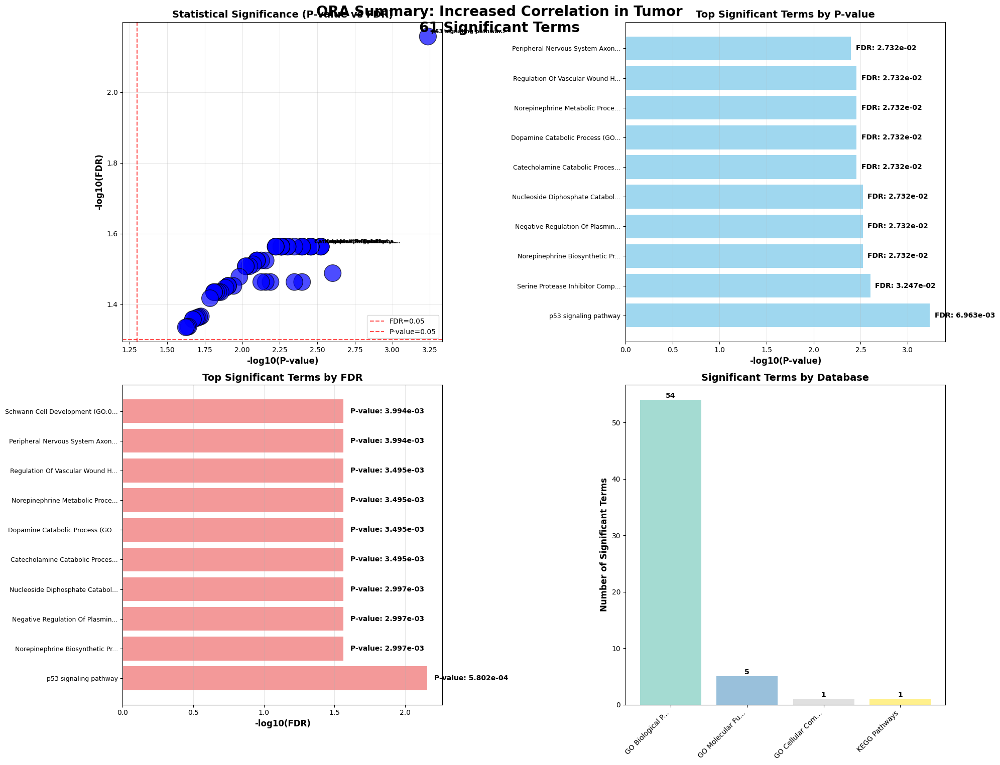

   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_increased_correlation_tumor_GO_Biological_Process_2023_summary.pdf (Size: 26.83 KB)
   📊 Displaying database summary plot for GO Biological Process


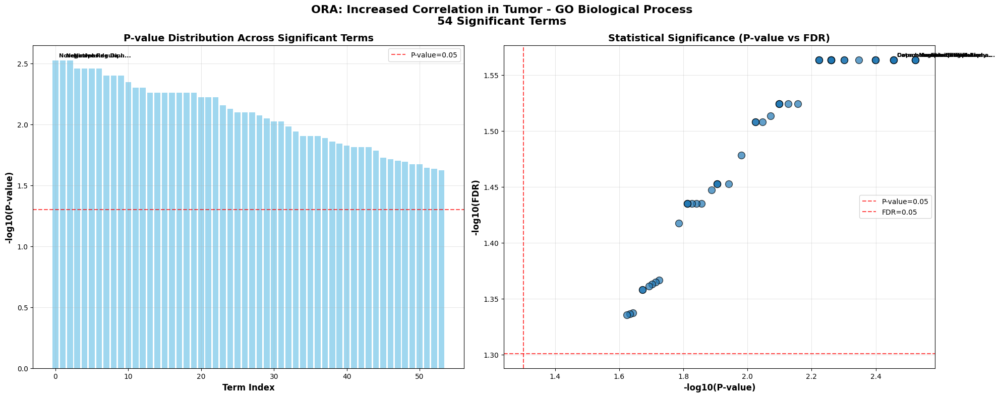

   ✅ GO Biological Process: 54 terms visualized
   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_increased_correlation_tumor_GO_Molecular_Function_2023_summary.pdf (Size: 25.51 KB)
   📊 Displaying database summary plot for GO Molecular Function


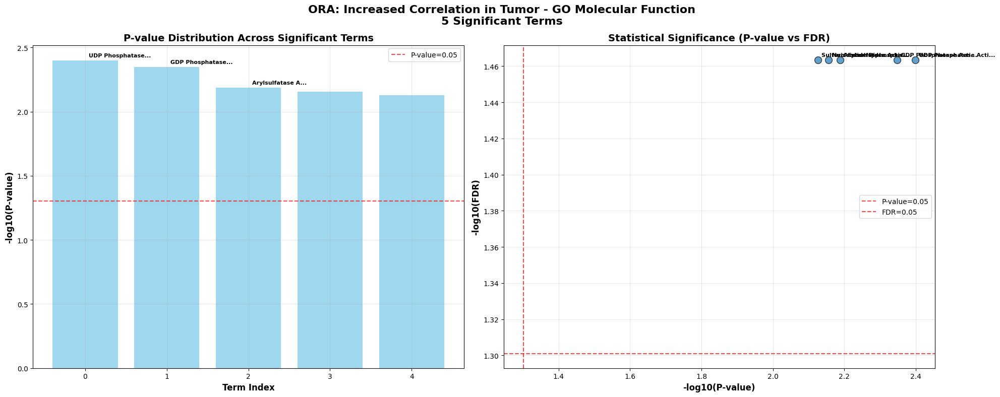

   ✅ GO Molecular Function: 5 terms visualized
   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_increased_correlation_tumor_GO_Cellular_Component_2023_summary.pdf (Size: 23.99 KB)
   📊 Displaying database summary plot for GO Cellular Component


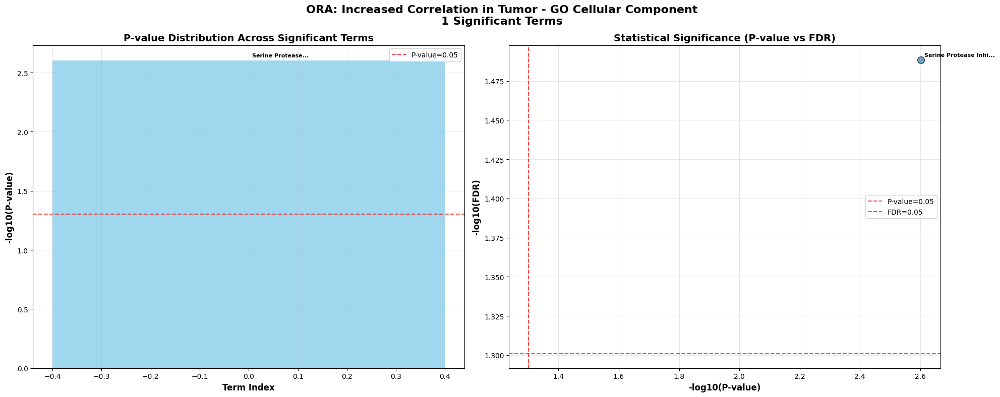

   ✅ GO Cellular Component: 1 terms visualized
   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_increased_correlation_tumor_KEGG_2021_Human_summary.pdf (Size: 25.62 KB)
   📊 Displaying database summary plot for KEGG Pathways


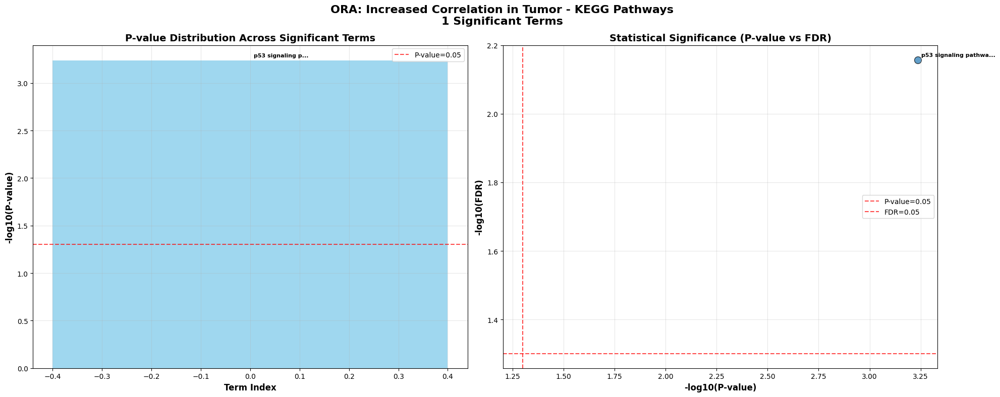

   ✅ KEGG Pathways: 1 terms visualized

📊 Creating ORA visualizations for DECREASED CORRELATION TUMOR...
   ✅ Saved ORA summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_Summary_decreased_correlation_tumor.pdf (Size: 53.12 KB)
   📊 Displaying ORA summary plot for decreased_correlation_tumor


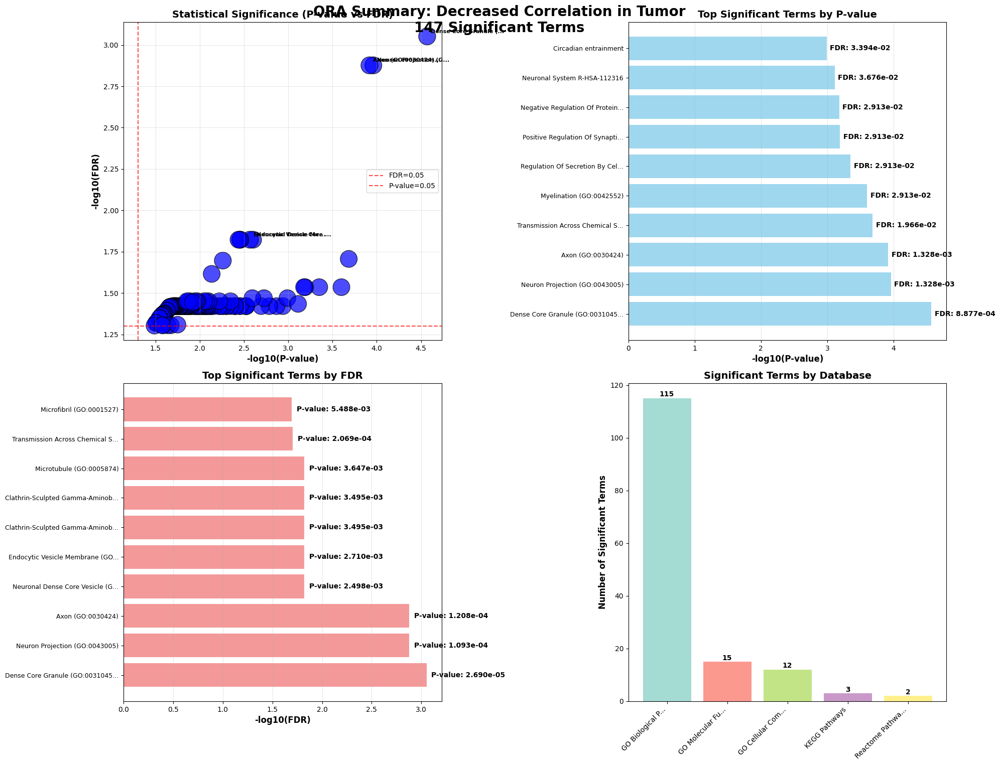

   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_decreased_correlation_tumor_GO_Biological_Process_2023_summary.pdf (Size: 28.91 KB)
   📊 Displaying database summary plot for GO Biological Process


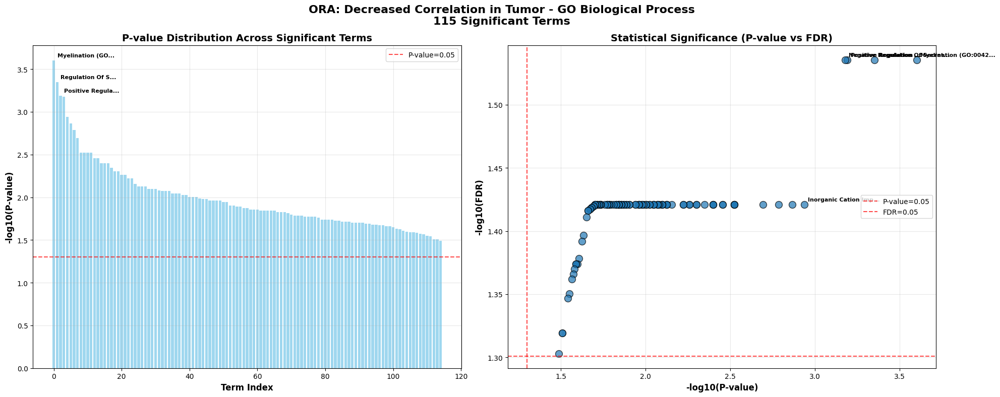

   ✅ GO Biological Process: 115 terms visualized
   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_decreased_correlation_tumor_GO_Molecular_Function_2023_summary.pdf (Size: 25.22 KB)
   📊 Displaying database summary plot for GO Molecular Function


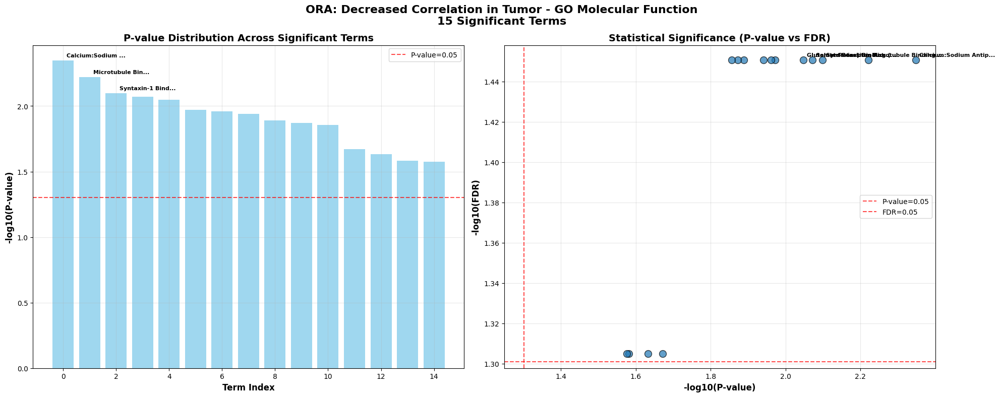

   ✅ GO Molecular Function: 15 terms visualized
   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_decreased_correlation_tumor_GO_Cellular_Component_2023_summary.pdf (Size: 26.31 KB)
   📊 Displaying database summary plot for GO Cellular Component


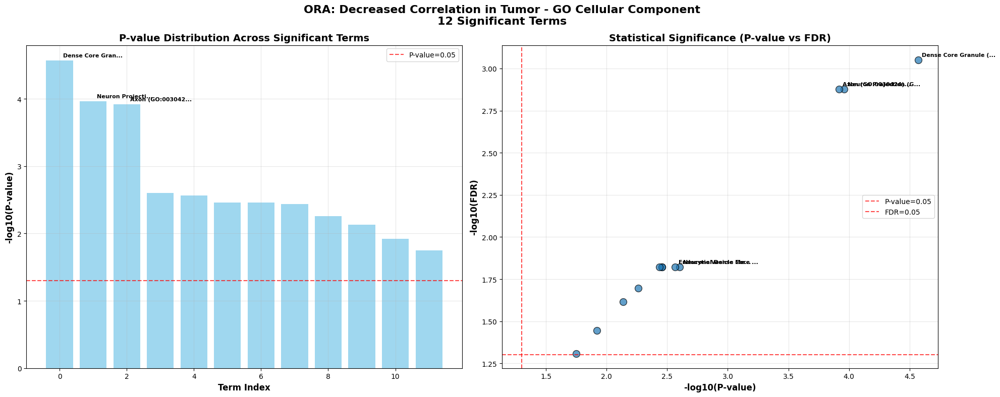

   ✅ GO Cellular Component: 12 terms visualized
   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_decreased_correlation_tumor_KEGG_2021_Human_summary.pdf (Size: 24.72 KB)
   📊 Displaying database summary plot for KEGG Pathways


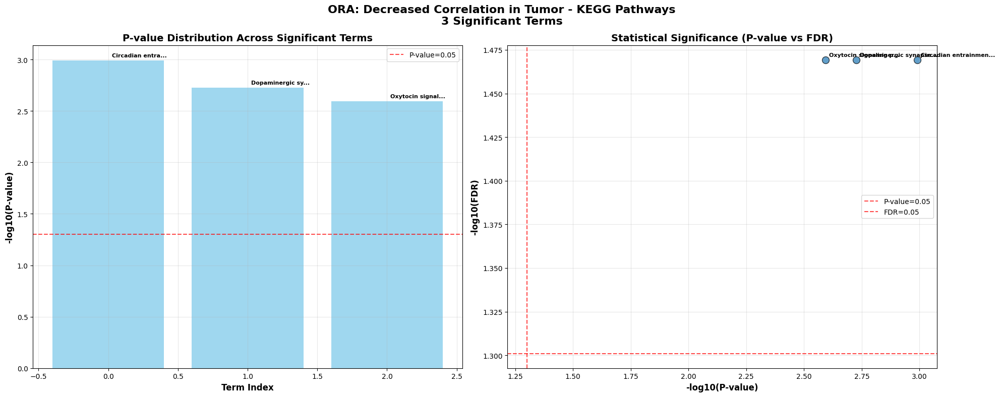

   ✅ KEGG Pathways: 3 terms visualized
   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_decreased_correlation_tumor_Reactome_2022_summary.pdf (Size: 24.17 KB)
   📊 Displaying database summary plot for Reactome Pathways


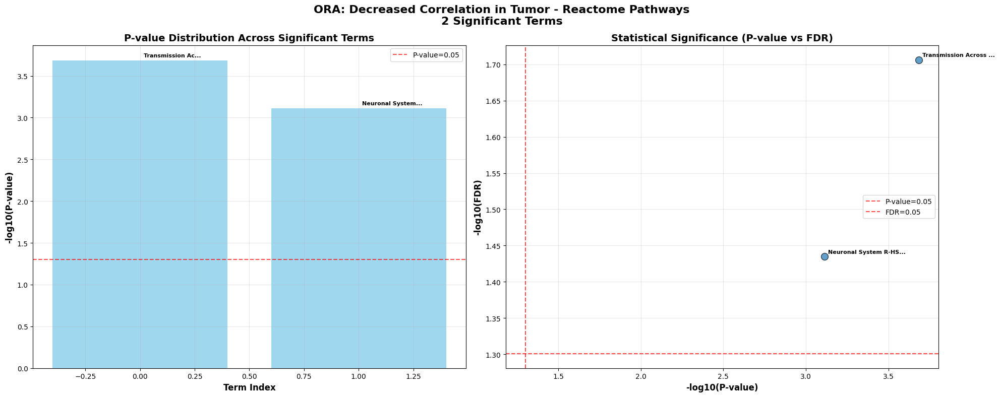

   ✅ Reactome Pathways: 2 terms visualized

📊 Creating ORA visualizations for INCREASED HUBNESS TUMOR...
   ✅ Saved ORA summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_Summary_increased_hubness_tumor.pdf (Size: 47.32 KB)
   📊 Displaying ORA summary plot for increased_hubness_tumor


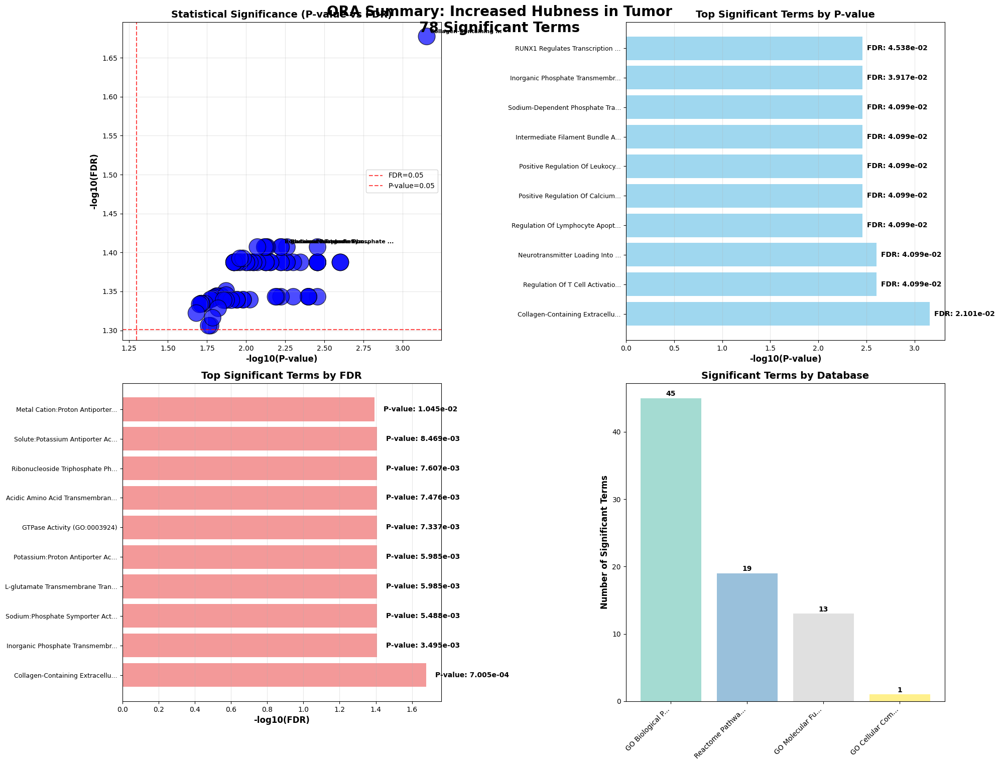

   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_increased_hubness_tumor_GO_Biological_Process_2023_summary.pdf (Size: 26.78 KB)
   📊 Displaying database summary plot for GO Biological Process


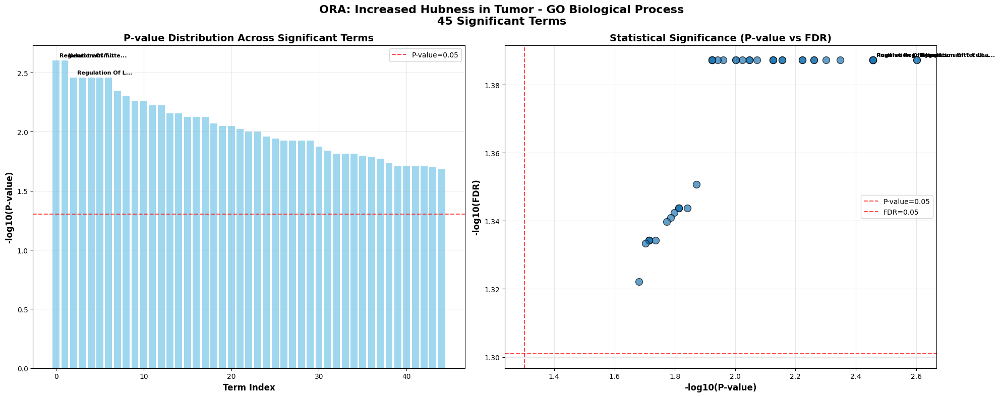

   ✅ GO Biological Process: 45 terms visualized
   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_increased_hubness_tumor_GO_Molecular_Function_2023_summary.pdf (Size: 25.11 KB)
   📊 Displaying database summary plot for GO Molecular Function


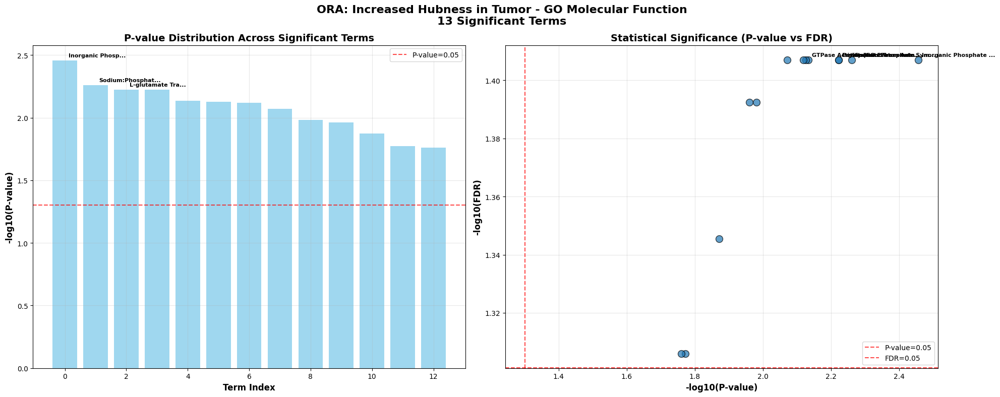

   ✅ GO Molecular Function: 13 terms visualized
   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_increased_hubness_tumor_GO_Cellular_Component_2023_summary.pdf (Size: 23.47 KB)
   📊 Displaying database summary plot for GO Cellular Component


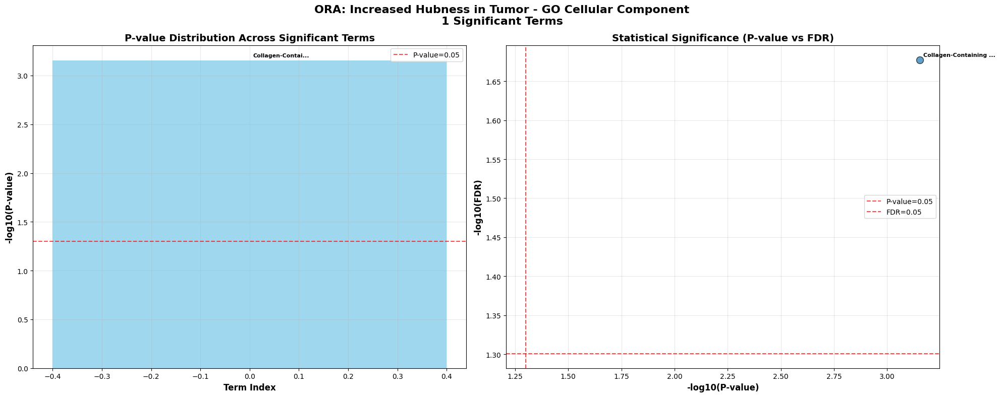

   ✅ GO Cellular Component: 1 terms visualized
   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_increased_hubness_tumor_Reactome_2022_summary.pdf (Size: 27.83 KB)
   📊 Displaying database summary plot for Reactome Pathways


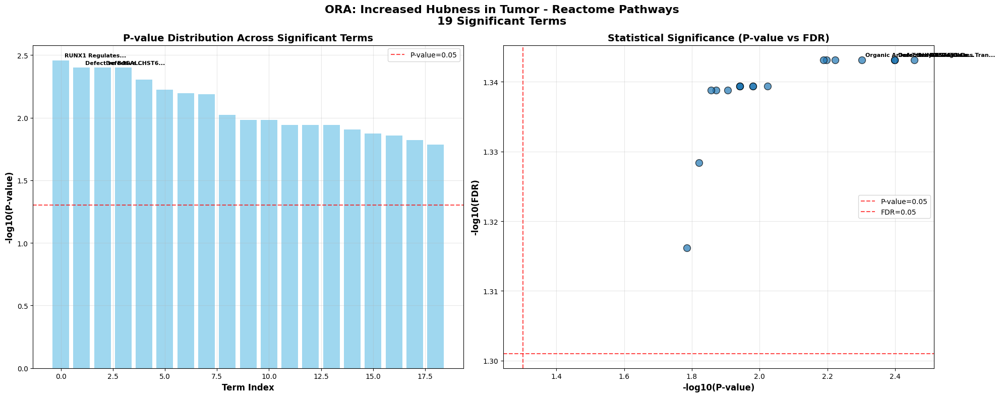

   ✅ Reactome Pathways: 19 terms visualized

📊 Creating ORA visualizations for DECREASED HUBNESS TUMOR...
   ✅ Saved ORA summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_Summary_decreased_hubness_tumor.pdf (Size: 52.00 KB)
   📊 Displaying ORA summary plot for decreased_hubness_tumor


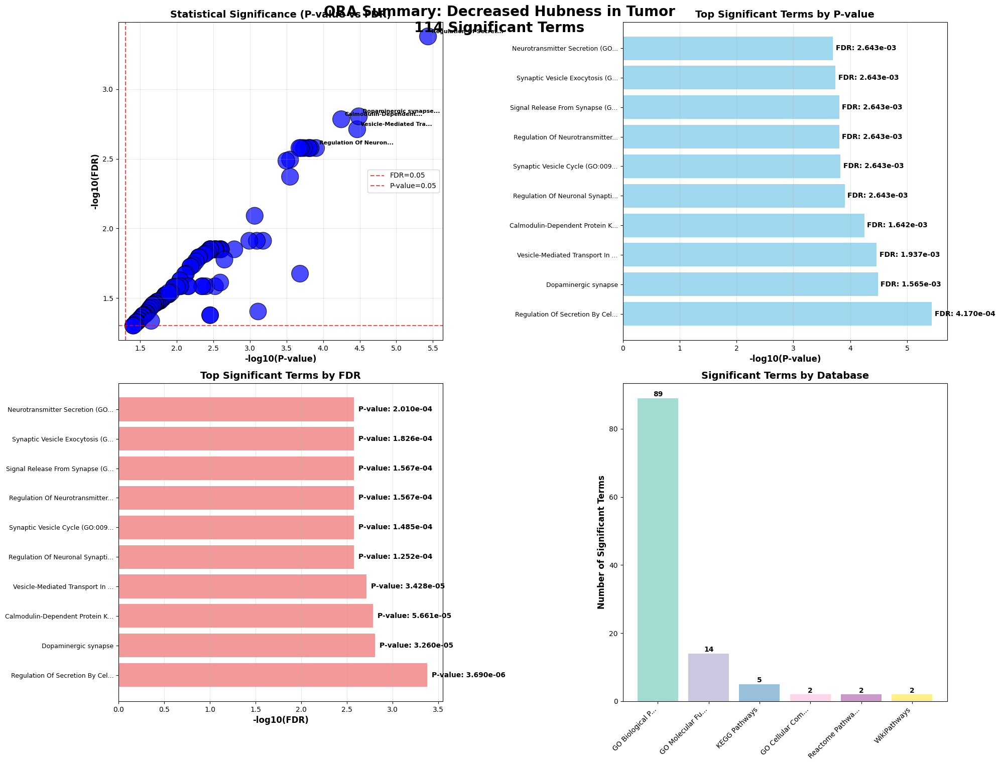

   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_decreased_hubness_tumor_GO_Biological_Process_2023_summary.pdf (Size: 28.96 KB)
   📊 Displaying database summary plot for GO Biological Process


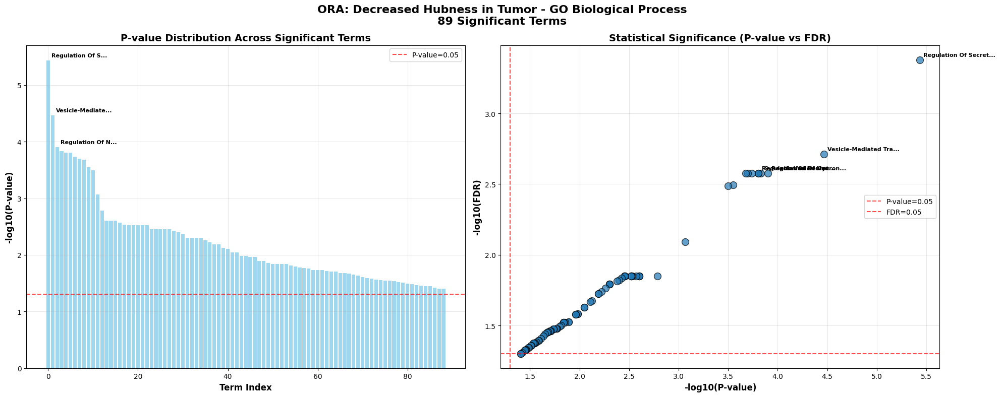

   ✅ GO Biological Process: 89 terms visualized
   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_decreased_hubness_tumor_GO_Molecular_Function_2023_summary.pdf (Size: 25.95 KB)
   📊 Displaying database summary plot for GO Molecular Function


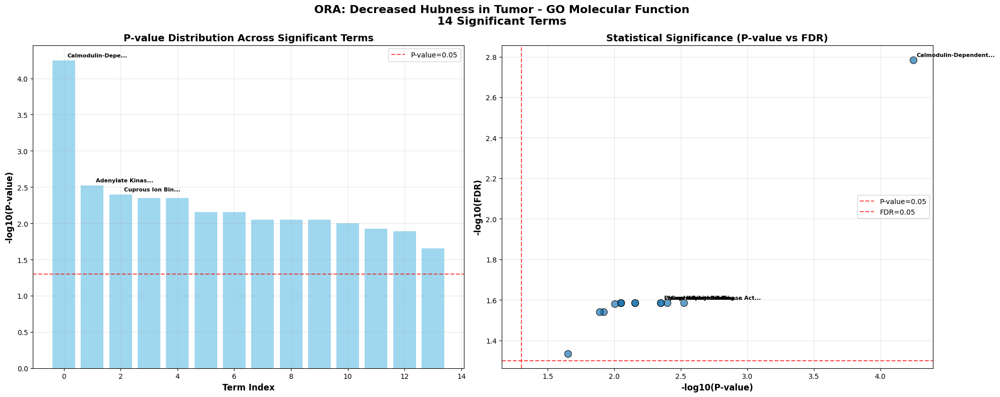

   ✅ GO Molecular Function: 14 terms visualized
   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_decreased_hubness_tumor_GO_Cellular_Component_2023_summary.pdf (Size: 24.63 KB)
   📊 Displaying database summary plot for GO Cellular Component


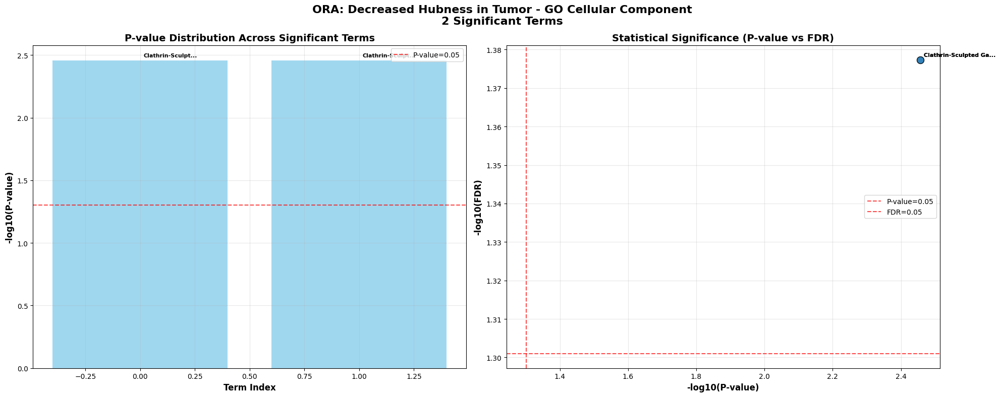

   ✅ GO Cellular Component: 2 terms visualized
   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_decreased_hubness_tumor_KEGG_2021_Human_summary.pdf (Size: 25.27 KB)
   📊 Displaying database summary plot for KEGG Pathways


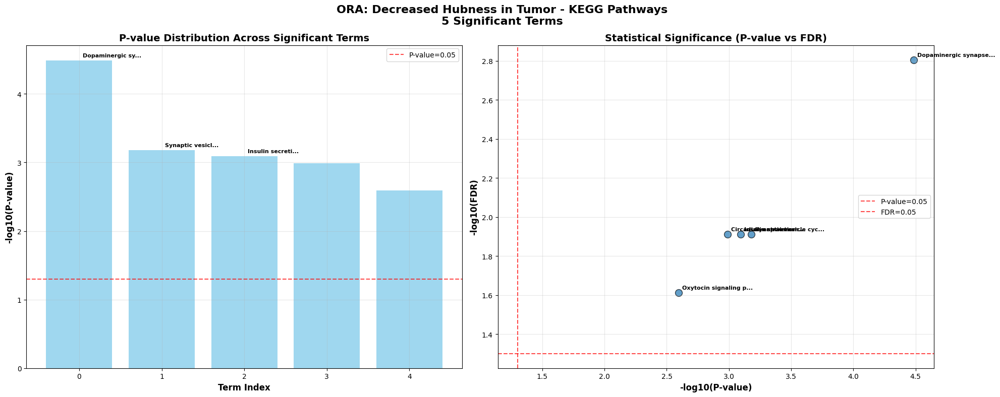

   ✅ KEGG Pathways: 5 terms visualized
   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_decreased_hubness_tumor_Reactome_2022_summary.pdf (Size: 23.80 KB)
   📊 Displaying database summary plot for Reactome Pathways


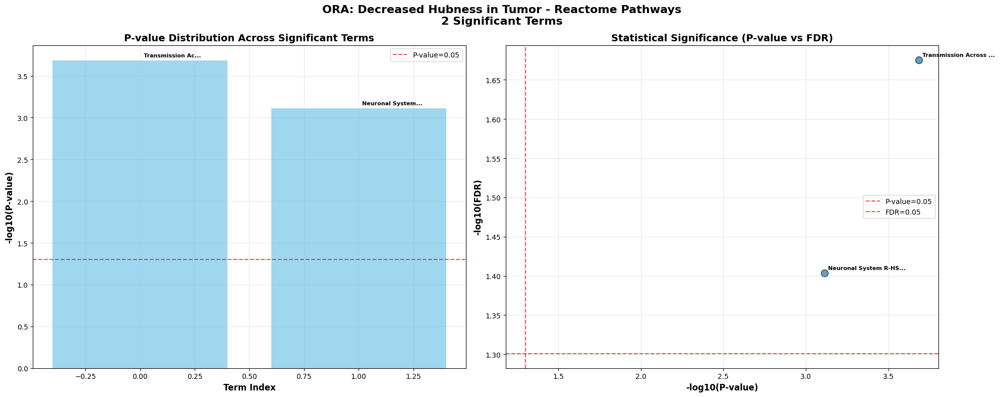

   ✅ Reactome Pathways: 2 terms visualized
   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_decreased_hubness_tumor_WikiPathways_2019_Human_summary.pdf (Size: 25.49 KB)
   📊 Displaying database summary plot for WikiPathways


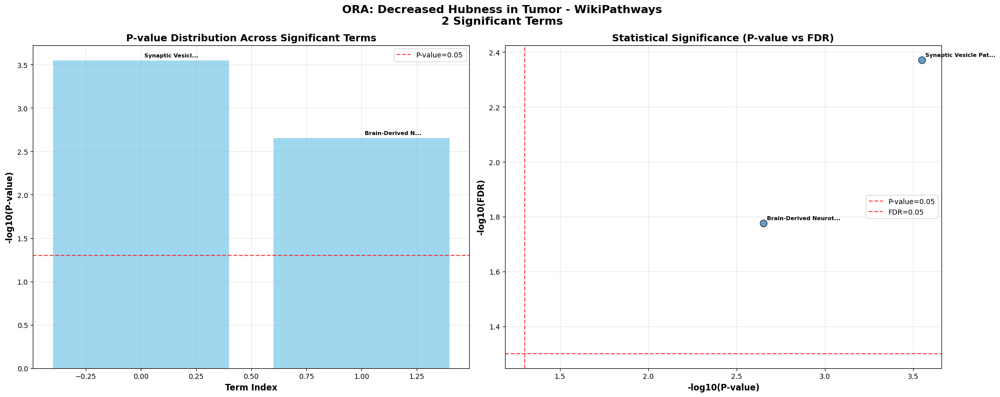

   ✅ WikiPathways: 2 terms visualized

📊 Creating ORA visualizations for ALL TUMOR UPREGULATED...
   ✅ Saved ORA summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_Summary_all_tumor_upregulated.pdf (Size: 35.70 KB)
   📊 Displaying ORA summary plot for all_tumor_upregulated


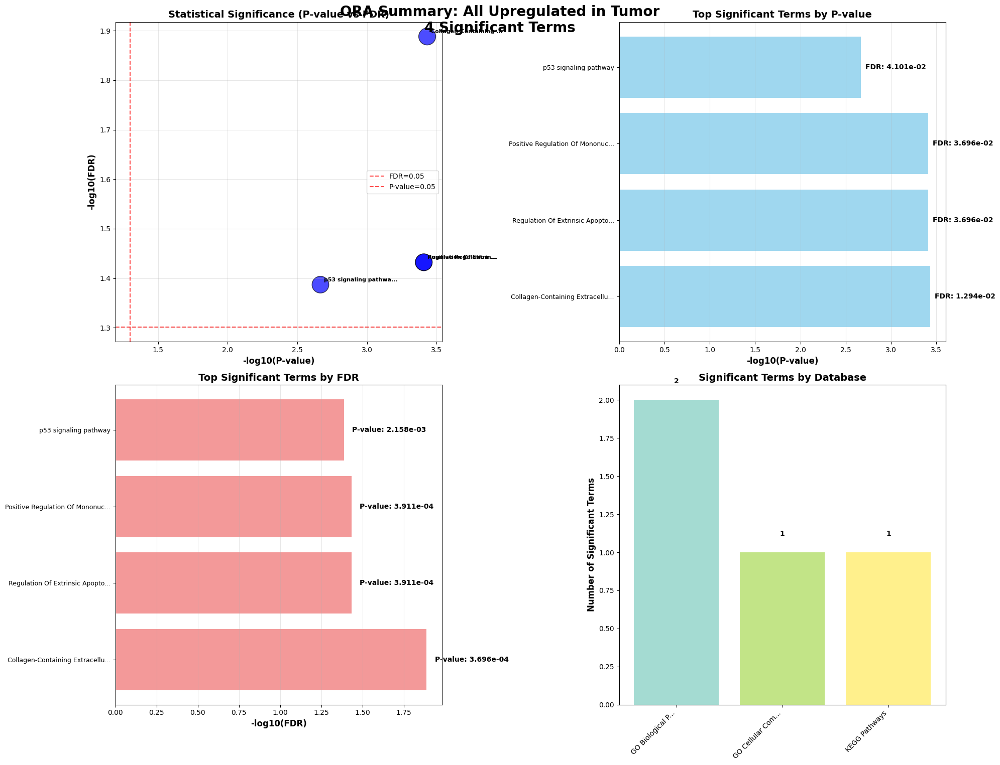

   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_all_tumor_upregulated_GO_Biological_Process_2023_summary.pdf (Size: 24.62 KB)
   📊 Displaying database summary plot for GO Biological Process


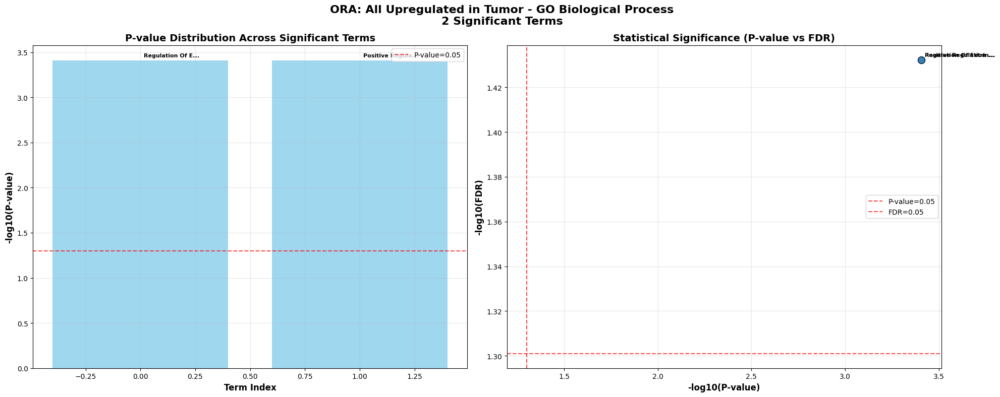

   ✅ GO Biological Process: 2 terms visualized
   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_all_tumor_upregulated_GO_Cellular_Component_2023_summary.pdf (Size: 24.36 KB)
   📊 Displaying database summary plot for GO Cellular Component


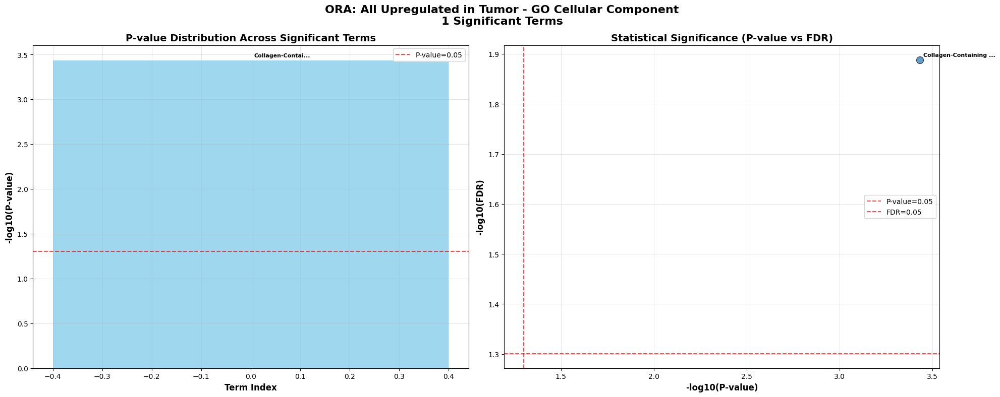

   ✅ GO Cellular Component: 1 terms visualized
   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_all_tumor_upregulated_KEGG_2021_Human_summary.pdf (Size: 25.27 KB)
   📊 Displaying database summary plot for KEGG Pathways


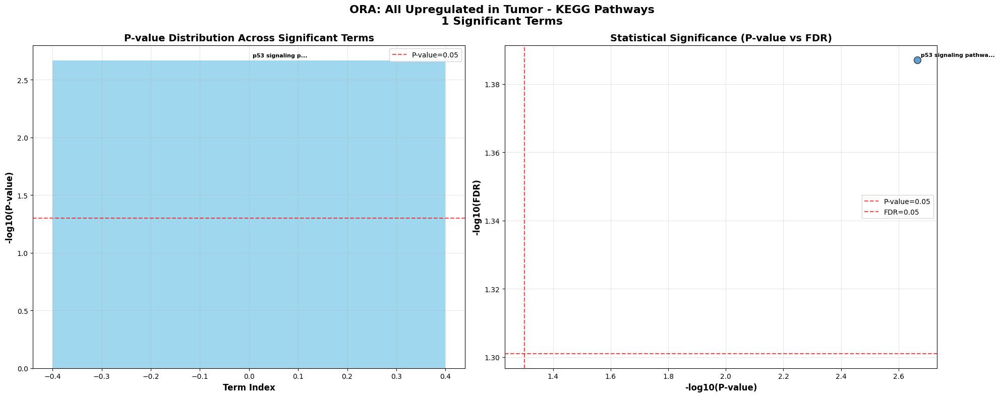

   ✅ KEGG Pathways: 1 terms visualized

📊 Creating ORA visualizations for ALL TUMOR DOWNREGULATED...
   ✅ Saved ORA summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_Summary_all_tumor_downregulated.pdf (Size: 55.76 KB)
   📊 Displaying ORA summary plot for all_tumor_downregulated


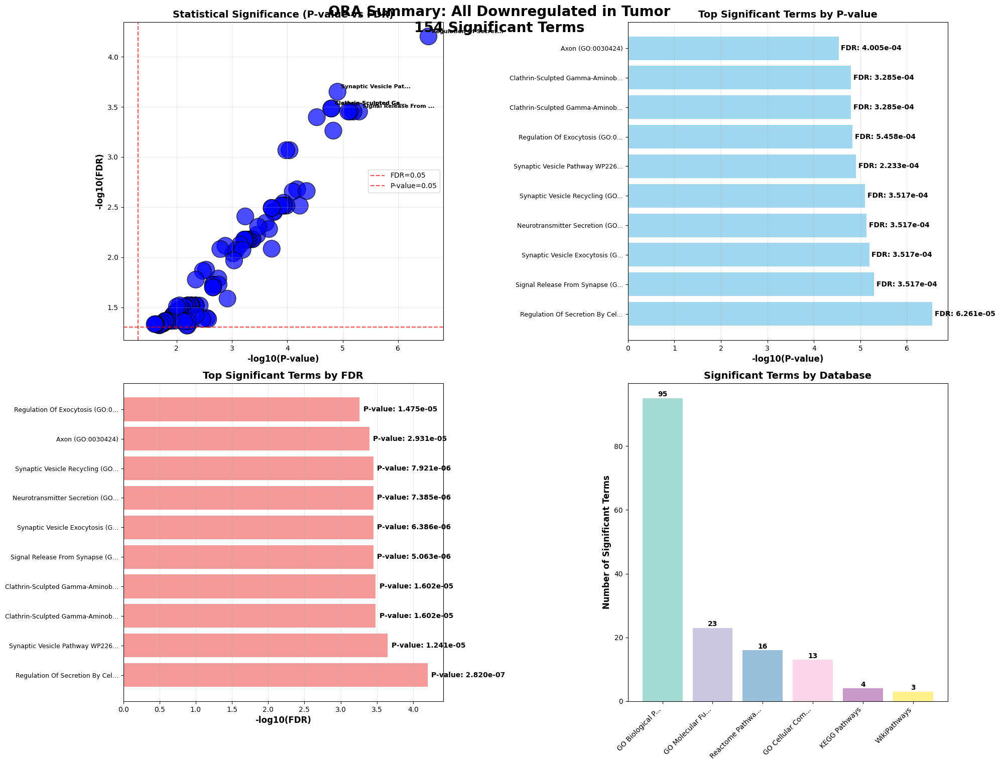

   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_all_tumor_downregulated_GO_Biological_Process_2023_summary.pdf (Size: 28.39 KB)
   📊 Displaying database summary plot for GO Biological Process


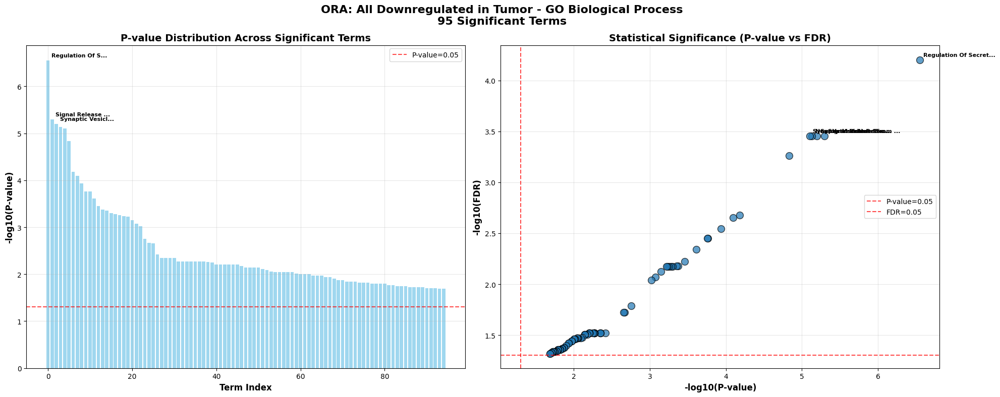

   ✅ GO Biological Process: 95 terms visualized
   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_all_tumor_downregulated_GO_Molecular_Function_2023_summary.pdf (Size: 26.94 KB)
   📊 Displaying database summary plot for GO Molecular Function


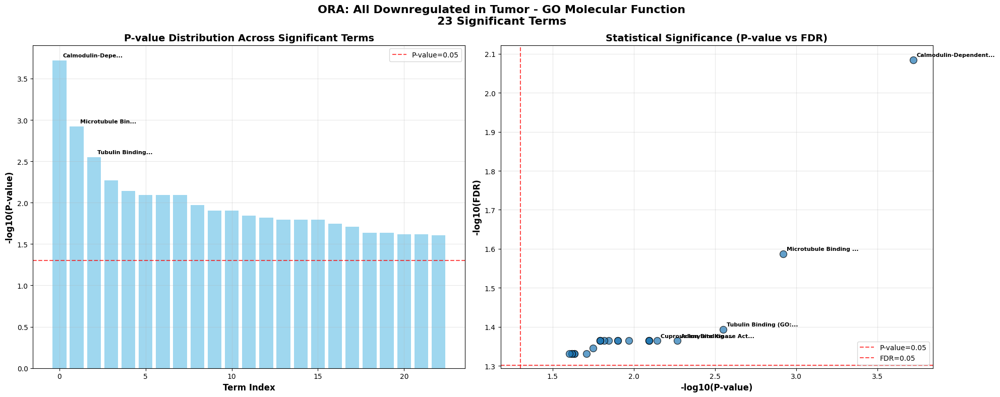

   ✅ GO Molecular Function: 23 terms visualized
   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_all_tumor_downregulated_GO_Cellular_Component_2023_summary.pdf (Size: 25.82 KB)
   📊 Displaying database summary plot for GO Cellular Component


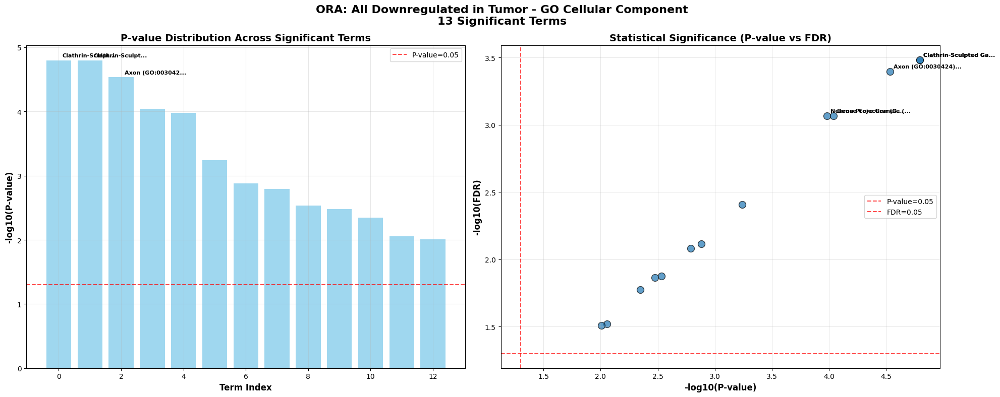

   ✅ GO Cellular Component: 13 terms visualized
   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_all_tumor_downregulated_KEGG_2021_Human_summary.pdf (Size: 25.20 KB)
   📊 Displaying database summary plot for KEGG Pathways


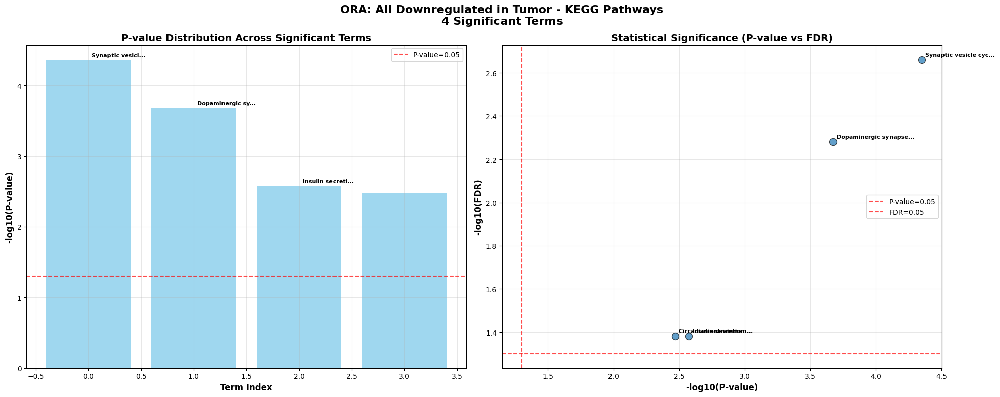

   ✅ KEGG Pathways: 4 terms visualized
   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_all_tumor_downregulated_Reactome_2022_summary.pdf (Size: 25.77 KB)
   📊 Displaying database summary plot for Reactome Pathways


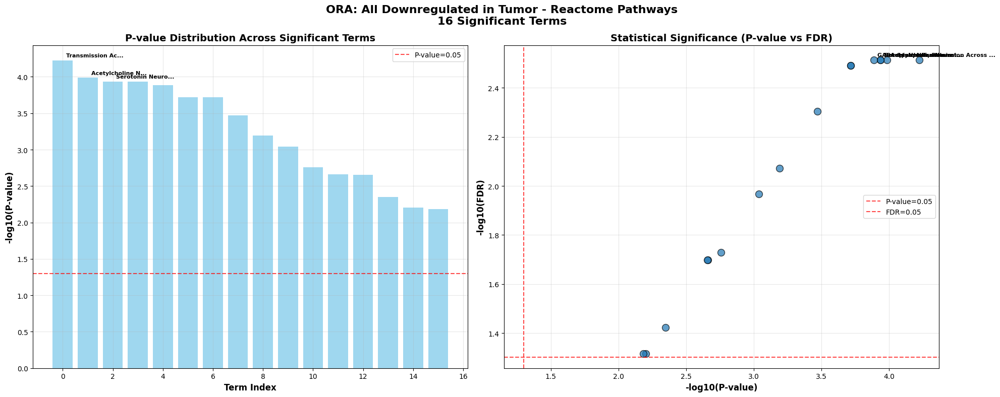

   ✅ Reactome Pathways: 16 terms visualized
   ✅ Saved database summary plot: /kaggle/working/Tissue_Specific_ORA_Results/ORA_all_tumor_downregulated_WikiPathways_2019_Human_summary.pdf (Size: 25.13 KB)
   📊 Displaying database summary plot for WikiPathways


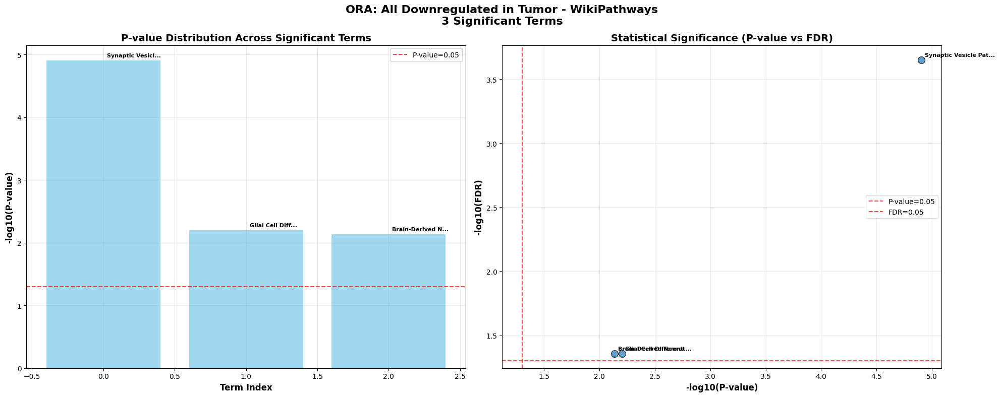

   ✅ WikiPathways: 3 terms visualized

📋 CREATING COMPREHENSIVE ORA REPORT
--------------------------------------------------
Debug: Unique Gene_Set values: ['increased_correlation_tumor' 'decreased_correlation_tumor'
 'increased_hubness_tumor' 'decreased_hubness_tumor'
 'all_tumor_upregulated' 'all_tumor_downregulated']
Debug: Gene_Set type: object
   ✅ Saved ORA results: /kaggle/working/Tissue_Specific_ORA_Results/tissue_specific_ora_complete_results.csv (Size: 90.40 KB)
✅ Complete ORA results saved: 558 significant terms

📊 Creating ORA overview visualization...
Debug: summary_df['Gene_Set'] unique: ['all_tumor_downregulated' 'decreased_hubness_tumor'
 'decreased_correlation_tumor' 'all_tumor_upregulated'
 'increased_correlation_tumor' 'increased_hubness_tumor']
Debug: pval_by_set.index: MultiIndex([('all_tumor_downregulated', 404),
            ('all_tumor_downregulated', 405),
            ('all_tumor_downregulated', 406),
            ('all_tumor_downregulated', 407),
            ('

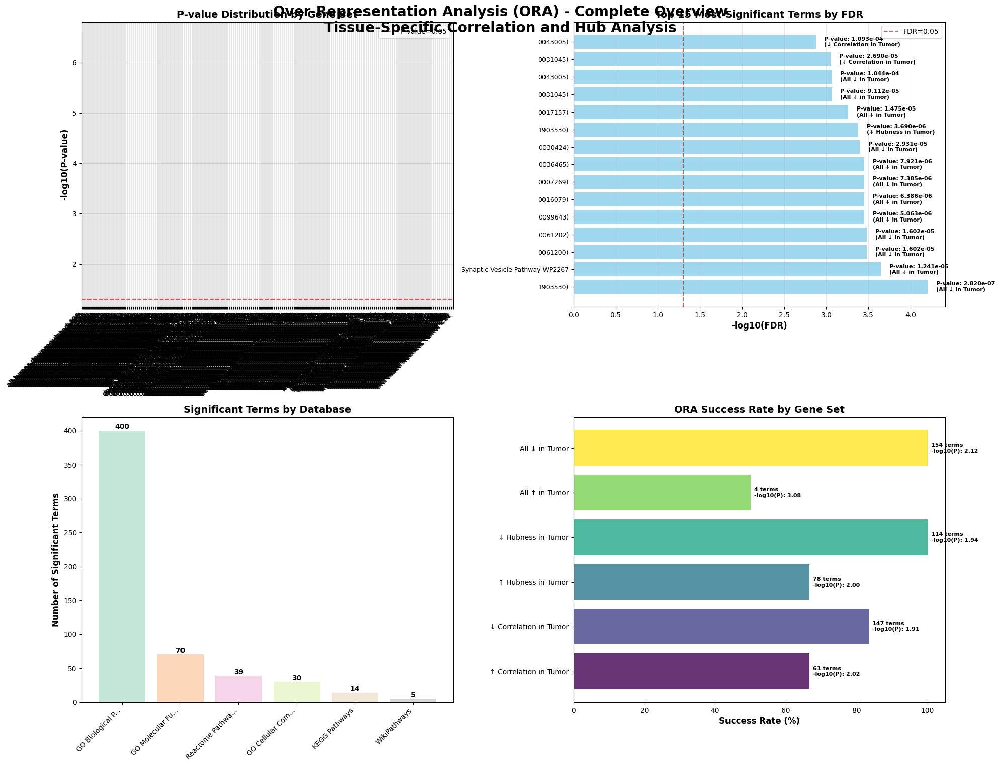


📁 Files in Tissue_Specific_ORA_Results:
   - tissue_specific_ora_summary.csv (Size: 0.23 KB)
   - tissue_specific_ora_complete_results.csv (Size: 90.40 KB)
   - ORA_increased_hubness_tumor_GO_Cellular_Component_2023_summary.pdf (Size: 23.47 KB)
   - ORA_decreased_hubness_tumor_GO_Biological_Process_2023_summary.pdf (Size: 28.96 KB)
   - ORA_Overview_Summary.pdf (Size: 57.38 KB)
   - ORA_decreased_hubness_tumor_GO_Cellular_Component_2023_summary.pdf (Size: 24.63 KB)
   - ORA_decreased_hubness_tumor_WikiPathways_2019_Human_summary.pdf (Size: 25.49 KB)
   - ORA_Summary_decreased_correlation_tumor.pdf (Size: 53.12 KB)
   - ORA_all_tumor_downregulated_GO_Molecular_Function_2023_summary.pdf (Size: 26.94 KB)
   - ORA_decreased_correlation_tumor_KEGG_2021_Human_summary.pdf (Size: 24.72 KB)
   - ORA_Summary_decreased_hubness_tumor.pdf (Size: 52.00 KB)
   - ORA_Summary_all_tumor_upregulated.pdf (Size: 35.70 KB)
   - ORA_decreased_correlation_tumor_GO_Molecular_Function_2023_summary.pdf (Size: 2

In [19]:
# Enable inline plotting in Jupyter
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import gseapy as gp
import warnings
import os
import logging

# Check versions and environment
print(f"pandas version: {pd.__version__}")
if pd.__version__.startswith('2.'):
    print("Note: Using pandas 2.0+, DataFrame.append is deprecated. Using pd.concat instead.")
print(f"matplotlib version: {matplotlib.__version__}")
print(f"Current working directory: {os.getcwd()}")
print(f"Matplotlib backend: {matplotlib.get_backend()}")

warnings.filterwarnings('ignore')
logging.basicConfig(level=logging.INFO)

# Configuration flag to control whether plots are displayed on-screen
DISPLAY_PLOTS = True  # Set to True to display plots in Jupyter

print("=" * 70)
print("ORA FOR TISSUE-SPECIFIC CORRELATION & HUB ANALYSIS")
print("=" * 70)

def create_tissue_specific_gene_sets():
    """Create gene sets from tissue-specific correlation and hub analysis"""
    print("\n🎯 CREATING TISSUE-SPECIFIC GENE SETS")
    print("-" * 50)
    
    gene_sets = {}
    
    # Genes with INCREASED correlation in tumor
    increased_correlation = [
        'FGFBP2', 'SEZ6', 'MOXD1', 'SERPINE1', 'AGAP2', 
        'ENTPD2', 'LGI4', 'ARSI', 'PAMR1', 'RPRM'
    ]
    gene_sets['increased_correlation_tumor'] = increased_correlation
    print(f"✅ Increased correlation in tumor: {len(increased_correlation)} genes")
    
    # Genes with DECREASED correlation in tumor
    decreased_correlation = [
        'CAMK2A', 'SLC24A2', 'PPP1R16B', 'SYT1', 'TPPP',
        'KCNJ9', 'LRRC17', 'NFASC', 'MFAP4', 'KIF1A'
    ]
    gene_sets['decreased_correlation_tumor'] = decreased_correlation
    print(f"✅ Decreased correlation in tumor: {len(decreased_correlation)} genes")
    
    # Genes with INCREASED hubness in tumor
    increased_hubness = [
        'NEFL', 'JPH4', 'VSNL1', 'RGS4', 'SMIM3',
        'LGALS3', 'SLC17A7', 'FMOD', 'AZGP1', 'AGAP2'
    ]
    gene_sets['increased_hubness_tumor'] = increased_hubness
    print(f"✅ Increased hubness in tumor: {len(increased_hubness)} genes")
    
    # Genes with DECREASED hubness in tumor
    decreased_hubness = [
        'AK5', 'KCNJ9', 'CAMKV', 'TMEM130', 'KIF5A',
        'CPLX2', 'CAMK2A', 'RAB3A', 'SNCB', 'FBXL16'
    ]
    gene_sets['decreased_hubness_tumor'] = decreased_hubness
    print(f"✅ Decreased hubness in tumor: {len(decreased_hubness)} genes")
    
    # Combined sets for broader analysis
    all_tumor_upregulated = list(set(increased_correlation + increased_hubness))
    all_tumor_downregulated = list(set(decreased_correlation + decreased_hubness))
    
    gene_sets['all_tumor_upregulated'] = all_tumor_upregulated
    gene_sets['all_tumor_downregulated'] = all_tumor_downregulated
    
    print(f"✅ All tumor upregulated: {len(all_tumor_upregulated)} genes")
    print(f"✅ All tumor downregulated: {len(all_tumor_downregulated)} genes")
    
    return gene_sets

def check_available_databases_ora():
    """Check which databases are available for ORA"""
    print("\n🔍 CHECKING AVAILABLE DATABASES FOR ORA")
    print("-" * 50)
    
    try:
        available_dbs = gp.get_library_name(organism='Human')
        print(f"📚 Found {len(available_dbs)} available databases")
        
        pathway_dbs = [db for db in available_dbs if any(x in db for x in ['GO_', 'KEGG', 'Reactome', 'WikiPathways'])]
        if pathway_dbs:
            print("📊 Available pathway databases:")
            for db in pathway_dbs[:5]:
                print(f"   - {db}")
                
        return available_dbs
        
    except Exception as e:
        print(f"❌ Error checking databases: {e}")
        return []

def get_updated_databases_ora(available_dbs):
    """Get updated database list for ORA based on availability"""
    
    preferred_dbs = {
        'GO_Biological_Process_2023': 'GO Biological Process',
        'GO_Molecular_Function_2023': 'GO Molecular Function',
        'GO_Cellular_Component_2023': 'GO Cellular Component',
        'KEGG_2021_Human': 'KEGG Pathways',
        'Reactome_2022': 'Reactome Pathways',
        'WikiPathways_2021_Human': 'WikiPathways'
    }
    
    db_alternatives = {
        'GO_Biological_Process_2023': ['GO_Biological_Process_2021', 'GO_Biological_Process_2018'],
        'GO_Molecular_Function_2023': ['GO_Molecular_Function_2021', 'GO_Molecular_Function_2018'],
        'GO_Cellular_Component_2023': ['GO_Cellular_Component_2021', 'GO_Cellular_Component_2018'],
        'KEGG_2021_Human': ['KEGG_2019_Human', 'KEGG_2016'],
        'Reactome_2022': ['Reactome_2016', 'Reactome_2015'],
        'WikiPathways_2021_Human': ['WikiPathways_2019_Human', 'WikiPathways_2016']
    }
    
    updated_dbs = {}
    for db_key, db_desc in preferred_dbs.items():
        if db_key in available_dbs:
            updated_dbs[db_key] = db_desc
            print(f"   ✅ {db_desc}: Available")
        else:
            found_alternative = False
            if db_key in db_alternatives:
                for alt_db in db_alternatives[db_key]:
                    if alt_db in available_dbs:
                        updated_dbs[alt_db] = db_desc
                        print(f"   🔄 {db_desc}: Using {alt_db} instead")
                        found_alternative = True
                        break
            if not found_alternative:
                print(f"   ❌ {db_desc}: No alternatives found")
    
    return updated_dbs

def perform_tissue_specific_ora(gene_sets):
    """Perform ORA analysis for tissue-specific gene sets"""
    print("\n🎯 PERFORMING TISSUE-SPECIFIC ORA ANALYSIS")
    print("-" * 60)
    
    ora_results = {}
    summary_stats = {}
    
    available_dbs = check_available_databases_ora()
    databases = get_updated_databases_ora(available_dbs)
    
    if not databases:
        print("❌ No valid databases found for ORA")
        return {}, {}
    
    print(f"\n📊 Using {len(databases)} databases for ORA:")
    for db_name, db_desc in databases.items():
        print(f"   • {db_desc} ({db_name})")
    
    for set_name, genes in gene_sets.items():
        print(f"\n🔬 Analyzing {set_name.replace('_', ' ').upper()} ({len(genes)} genes)...")
        print("-" * 50)
        
        if len(genes) < 3:
            print(f"   ⚠️ Too few genes for ORA: {len(genes)}")
            continue
        
        set_results = {}
        set_stats = {
            'total_genes': len(genes),
            'significant_terms': 0,
            'databases_with_results': 0
        }
        
        for db_name, db_description in databases.items():
            try:
                print(f"   📊 Testing {db_description}...")
                
                # Perform ORA
                enr = gp.enrichr(
                    gene_list=genes,
                    gene_sets=db_name,
                    organism='Human',
                    outdir=None,
                    cutoff=0.05
                )
                
                if enr.results is not None and len(enr.results) > 0:
                    # Filter for significant results (FDR < 0.05)
                    sig_results = enr.results[enr.results['Adjusted P-value'] < 0.05].copy()
                    sig_results['Term'] = sig_results['Term'].astype(str)  # Ensure Term is string
                    
                    if len(sig_results) > 0:
                        set_results[db_name] = {
                            'description': db_description,
                            'all_terms': enr.results,
                            'significant_terms': sig_results,
                            'num_significant': len(sig_results)
                        }
                        
                        set_stats['significant_terms'] += len(sig_results)
                        set_stats['databases_with_results'] += 1
                        
                        print(f"   ✅ {db_description}: {len(sig_results)} significant terms")
                        
                        # Show top 3 terms
                        top_terms = sig_results.head(3)
                        for i, (_, term) in enumerate(top_terms.iterrows()):
                            print(f"      {i+1}. {term['Term'][:50]}... (FDR: {term['Adjusted P-value']:.2e})")
                    else:
                        print(f"   ⚠️ {db_description}: No terms pass FDR < 0.05")
                else:
                    print(f"   ❌ {db_description}: No results returned")
                    
            except Exception as e:
                error_msg = str(e)
                print(f"   ❌ Error in {db_description}: {error_msg[:80]}...")
        
        if set_results:
            ora_results[set_name] = set_results
            summary_stats[set_name] = set_stats
            print(f"   🎯 SUMMARY: {set_stats['databases_with_results']} databases with {set_stats['significant_terms']} total significant terms")
        else:
            print(f"   ⚠️ No significant results for {set_name}")
    
    return ora_results, summary_stats

def create_tissue_specific_visualizations(ora_results, summary_stats, output_dir="Tissue_Specific_ORA_Results"):
    """Create GSEA-style visualizations for tissue-specific ORA results"""
    print(f"\n🎨 CREATING TISSUE-SPECIFIC ORA VISUALIZATIONS")
    print("-" * 50)
    
    if not os.path.exists(output_dir):
        try:
            os.makedirs(output_dir)
            print(f"   ✅ Created output directory: {os.path.abspath(output_dir)}")
        except Exception as e:
            print(f"   ❌ Failed to create output directory {output_dir}: {e}")
            return {}
    
    all_plots = {}
    
    for set_name, databases in ora_results.items():
        print(f"\n📊 Creating ORA visualizations for {set_name.replace('_', ' ').upper()}...")
        set_plots = {}
        
        create_ora_summary_plot(set_name, databases, output_dir)
        
        for db_name, db_data in databases.items():
            try:
                sig_terms = db_data['significant_terms']
                db_description = db_data['description']
                
                if len(sig_terms) == 0:
                    print(f"   ⚠️ No significant terms for {db_description}")
                    continue
                
                create_database_summary_plot(set_name, db_name, db_data, output_dir)
                
                print(f"   ✅ {db_description}: {len(sig_terms)} terms visualized")
                
            except Exception as e:
                print(f"   ❌ Error creating database summary plot for {db_description}: {e}")
        
        all_plots[set_name] = set_plots
    
    if ora_results:
        create_ora_comprehensive_report(ora_results, summary_stats, output_dir)
    
    if os.path.exists(output_dir):
        print(f"\n📁 Files in {output_dir}:")
        for file in os.listdir(output_dir):
            file_path = os.path.join(output_dir, file)
            file_size = os.path.getsize(file_path) / 1024
            print(f"   - {file} (Size: {file_size:.2f} KB)")
    
    return all_plots

def create_ora_summary_plot(set_name, databases, output_dir):
    """Create GSEA-style summary plot for ORA results"""
    try:
        all_terms = []
        for db_name, db_data in databases.items():
            for _, term in db_data['significant_terms'].iterrows():
                all_terms.append({
                    'Database': db_data['description'],
                    'Term': str(term['Term']),  # Ensure Term is string
                    'P-value': term['P-value'],
                    'FDR': term['Adjusted P-value'],
                    'Overlap': int(term['Overlap'].split('/')[0]),
                    'Genes': term.get('Genes', 'NA')
                })
        
        if not all_terms:
            print(f"   ⚠️ No significant terms for {set_name}")
            return
        
        summary_df = pd.DataFrame(all_terms)
        
        title_map = {
            'increased_correlation_tumor': 'Increased Correlation in Tumor',
            'decreased_correlation_tumor': 'Decreased Correlation in Tumor',
            'increased_hubness_tumor': 'Increased Hubness in Tumor',
            'decreased_hubness_tumor': 'Decreased Hubness in Tumor',
            'all_tumor_upregulated': 'All Upregulated in Tumor',
            'all_tumor_downregulated': 'All Downregulated in Tumor'
        }
        display_name = title_map.get(set_name, set_name.replace('_', ' ').title())
        
        fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 16))
        fig.suptitle(f'ORA Summary: {display_name}\n{len(summary_df)} Significant Terms', 
                    fontsize=20, fontweight='bold', y=0.95)
        
        # Plot 1: Scatter of P-value vs FDR
        colors = ['blue' for _ in summary_df['FDR']]
        sizes = 100 + (1 - summary_df['FDR']) * 500
        
        scatter = ax1.scatter(-np.log10(summary_df['P-value']), -np.log10(summary_df['FDR']),
                            c=colors, s=sizes, alpha=0.7, edgecolors='black')
        
        ax1.axhline(y=-np.log10(0.05), color='red', linestyle='--', alpha=0.7, label='FDR=0.05')
        ax1.axvline(x=-np.log10(0.05), color='red', linestyle='--', alpha=0.7, label='P-value=0.05')
        ax1.set_xlabel('-log10(P-value)', fontsize=12, fontweight='bold')
        ax1.set_ylabel('-log10(FDR)', fontsize=12, fontweight='bold')
        ax1.set_title('Statistical Significance (P-value vs FDR)', fontsize=14, fontweight='bold')
        ax1.legend()
        ax1.grid(True, alpha=0.3)
        
        for i, row in summary_df.nsmallest(5, 'FDR').iterrows():
            ax1.annotate(row['Term'][:20] + '...', 
                        (-np.log10(row['P-value']), -np.log10(row['FDR'])),
                        xytext=(5, 5), textcoords='offset points',
                        fontsize=8, fontweight='bold')
        
        # Plot 2: Top terms by P-value
        top_pval = summary_df.nsmallest(10, 'P-value')
        y_pos = np.arange(len(top_pval))
        
        bars = ax2.barh(y_pos, -np.log10(top_pval['P-value']), color='skyblue', alpha=0.8)
        ax2.set_yticks(y_pos)
        clean_terms = [term[:30] + '...' if len(term) > 30 else term for term in top_pval['Term']]
        ax2.set_yticklabels(clean_terms, fontsize=9)
        ax2.set_xlabel('-log10(P-value)', fontsize=12, fontweight='bold')
        ax2.set_title('Top Significant Terms by P-value', fontsize=14, fontweight='bold')
        ax2.grid(True, alpha=0.3, axis='x')
        
        for i, bar in enumerate(bars):
            width = bar.get_width()
            fdr = top_pval.iloc[i]['FDR']
            ax2.text(width + 0.05, bar.get_y() + bar.get_height()/2,
                   f'FDR: {fdr:.3e}', ha='left', va='center', fontweight='bold')
        
        # Plot 3: Top terms by FDR
        top_fdr = summary_df.nsmallest(10, 'FDR')
        y_pos = np.arange(len(top_fdr))
        
        bars = ax3.barh(y_pos, -np.log10(top_fdr['FDR']), color='lightcoral', alpha=0.8)
        ax3.set_yticks(y_pos)
        clean_terms = [term[:30] + '...' if len(term) > 30 else term for term in top_fdr['Term']]
        ax3.set_yticklabels(clean_terms, fontsize=9)
        ax3.set_xlabel('-log10(FDR)', fontsize=12, fontweight='bold')
        ax3.set_title('Top Significant Terms by FDR', fontsize=14, fontweight='bold')
        ax3.grid(True, alpha=0.3, axis='x')
        
        for i, bar in enumerate(bars):
            width = bar.get_width()
            pval = top_fdr.iloc[i]['P-value']
            ax3.text(width + 0.05, bar.get_y() + bar.get_height()/2,
                   f'P-value: {pval:.3e}', ha='left', va='center', fontweight='bold')
        
        # Plot 4: Terms by Database
        db_counts = summary_df['Database'].value_counts()
        colors = plt.cm.Set3(np.linspace(0, 1, len(db_counts)))
        
        bars = ax4.bar(range(len(db_counts)), db_counts.values, color=colors, alpha=0.8)
        ax4.set_xticks(range(len(db_counts)))
        ax4.set_xticklabels([db[:15] + '...' if len(db) > 15 else db for db in db_counts.index], 
                           rotation=45, ha='right')
        ax4.set_ylabel('Number of Significant Terms', fontsize=12, fontweight='bold')
        ax4.set_title('Significant Terms by Database', fontsize=14, fontweight='bold')
        
        for bar in bars:
            height = bar.get_height()
            ax4.text(bar.get_x() + bar.get_width()/2., height + 0.1,
                    f'{int(height)}', ha='center', va='bottom', fontweight='bold')
        
        plt.tight_layout()
        summary_file = os.path.join(output_dir, f"ORA_Summary_{set_name}.pdf")
        plt.savefig(summary_file, dpi=300, bbox_inches='tight')
        if os.path.exists(summary_file):
            file_size = os.path.getsize(summary_file) / 1024
            print(f"   ✅ Saved ORA summary plot: {os.path.abspath(summary_file)} (Size: {file_size:.2f} KB)")
        else:
            print(f"   ❌ Failed to save ORA summary plot: {summary_file}")
        
        if DISPLAY_PLOTS:
            print(f"   📊 Displaying ORA summary plot for {set_name}")
            plt.show()
        
        plt.close()
        
    except Exception as e:
        print(f"   ❌ Error creating ORA summary plot for {set_name}: {e}")

def create_database_summary_plot(set_name, db_name, db_data, output_dir):
    """Create GSEA-style database-specific summary plot"""
    try:
        sig_terms = db_data['significant_terms']
        db_description = db_data['description']
        
        if len(sig_terms) == 0:
            print(f"   ⚠️ No significant terms for {db_description}")
            return
        
        # Ensure Term column is string
        sig_terms['Term'] = sig_terms['Term'].astype(str)
        
        title_map = {
            'increased_correlation_tumor': 'Increased Correlation in Tumor',
            'decreased_correlation_tumor': 'Decreased Correlation in Tumor',
            'increased_hubness_tumor': 'Increased Hubness in Tumor',
            'decreased_hubness_tumor': 'Decreased Hubness in Tumor',
            'all_tumor_upregulated': 'All Upregulated in Tumor',
            'all_tumor_downregulated': 'All Downregulated in Tumor'
        }
        display_name = title_map.get(set_name, set_name.replace('_', ' ').title())
        
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))
        fig.suptitle(f'ORA: {display_name} - {db_description}\n{len(sig_terms)} Significant Terms', 
                    fontsize=16, fontweight='bold')
        
        # Plot 1: Bar plot of P-value
        pval_values = -np.log10(sig_terms['P-value'])
        colors = ['skyblue' for _ in pval_values]
        
        bars = ax1.bar(range(len(pval_values)), pval_values, color=colors, alpha=0.8)
        ax1.set_xlabel('Term Index', fontsize=12, fontweight='bold')
        ax1.set_ylabel('-log10(P-value)', fontsize=12, fontweight='bold')
        ax1.set_title('P-value Distribution Across Significant Terms', fontsize=14, fontweight='bold')
        ax1.axhline(y=-np.log10(0.05), color='red', linestyle='--', alpha=0.7, label='P-value=0.05')
        ax1.grid(True, alpha=0.3)
        ax1.legend()
        
        # Annotate top 3 terms using index
        top_terms = sig_terms.nsmallest(3, 'P-value')
        for idx, row in top_terms.iterrows():
            ax1.annotate(row['Term'][:15] + '...', 
                        (idx, -np.log10(row['P-value'])),
                        xytext=(5, 5), textcoords='offset points',
                        fontsize=8, fontweight='bold')
        
        # Plot 2: Scatter of P-value vs FDR
        scatter = ax2.scatter(-np.log10(sig_terms['P-value']), -np.log10(sig_terms['Adjusted P-value']),
                            s=100, alpha=0.7, edgecolors='black')
        ax2.set_xlabel('-log10(P-value)', fontsize=12, fontweight='bold')
        ax2.set_ylabel('-log10(FDR)', fontsize=12, fontweight='bold')
        ax2.set_title('Statistical Significance (P-value vs FDR)', fontsize=14, fontweight='bold')
        ax2.axvline(x=-np.log10(0.05), color='red', linestyle='--', alpha=0.7, label='P-value=0.05')
        ax2.axhline(y=-np.log10(0.05), color='red', linestyle='--', alpha=0.7, label='FDR=0.05')
        ax2.legend()
        ax2.grid(True, alpha=0.3)
        
        top_terms = sig_terms.nsmallest(5, 'Adjusted P-value')
        for idx, row in top_terms.iterrows():
            ax2.annotate(row['Term'][:20] + '...', 
                        (-np.log10(row['P-value']), -np.log10(row['Adjusted P-value'])),
                        xytext=(5, 5), textcoords='offset points',
                        fontsize=8, fontweight='bold')
        
        plt.tight_layout()
        plot_file = os.path.join(output_dir, f"ORA_{set_name}_{db_name}_summary.pdf")
        plt.savefig(plot_file, dpi=300, bbox_inches='tight')
        if os.path.exists(plot_file):
            file_size = os.path.getsize(plot_file) / 1024
            print(f"   ✅ Saved database summary plot: {os.path.abspath(plot_file)} (Size: {file_size:.2f} KB)")
        else:
            print(f"   ❌ Failed to save database summary plot: {plot_file}")
        
        if DISPLAY_PLOTS:
            print(f"   📊 Displaying database summary plot for {db_description}")
            plt.show()
        
        plt.close()
        
    except Exception as e:
        print(f"   ❌ Error creating database summary plot for {db_description}: {e}")

def create_ora_comprehensive_report(ora_results, summary_stats, output_dir="Tissue_Specific_ORA_Results"):
    """Create comprehensive ORA report"""
    print(f"\n📋 CREATING COMPREHENSIVE ORA REPORT")
    print("-" * 50)
    
    all_terms = []
    
    for set_name, databases in ora_results.items():
        for db_name, db_data in databases.items():
            for _, term in db_data['significant_terms'].iterrows():
                all_terms.append({
                    'Gene_Set': str(set_name),  # Ensure Gene_Set is string
                    'Database': db_data['description'],
                    'Term': str(term['Term']),
                    'P-value': term['P-value'],
                    'FDR': term['Adjusted P-value'],
                    'Odds_Ratio': term['Odds Ratio'],
                    'Overlap': term['Overlap'],
                    'Overlap_Genes': term.get('Genes', 'NA')
                })
    
    if all_terms:
        summary_df = pd.DataFrame(all_terms)
        
        # Debug: Check Gene_Set column
        print(f"Debug: Unique Gene_Set values: {summary_df['Gene_Set'].unique()}")
        print(f"Debug: Gene_Set type: {summary_df['Gene_Set'].dtype}")
        
        summary_df['Pval_neg_log10'] = -np.log10(summary_df['P-value'])
        summary_df = summary_df.sort_values(['Pval_neg_log10', 'FDR'], ascending=[False, True])
        summary_df = summary_df.drop('Pval_neg_log10', axis=1)
        
        os.makedirs(output_dir, exist_ok=True)
        results_file = os.path.join(output_dir, 'tissue_specific_ora_complete_results.csv')
        summary_df.to_csv(results_file, index=False)
        if os.path.exists(results_file):
            file_size = os.path.getsize(results_file) / 1024
            print(f"   ✅ Saved ORA results: {os.path.abspath(results_file)} (Size: {file_size:.2f} KB)")
        else:
            print(f"   ❌ Failed to save ORA results: {results_file}")
        
        print(f"✅ Complete ORA results saved: {len(summary_df)} significant terms")
        
        create_ora_overview_visualization(summary_df, summary_stats, output_dir)
        
        return summary_df
    else:
        print("❌ No significant terms found in ORA analysis")
        return pd.DataFrame()

def create_ora_overview_visualization(summary_df, summary_stats, output_dir):
    """Create GSEA-style overview visualization of all ORA results"""
    print("\n📊 Creating ORA overview visualization...")
    
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 16))
    fig.suptitle('Over-Representation Analysis (ORA) - Complete Overview\nTissue-Specific Correlation and Hub Analysis', 
                fontsize=20, fontweight='bold', y=0.95)
    
    title_map = {
        'increased_correlation_tumor': '↑ Correlation in Tumor',
        'decreased_correlation_tumor': '↓ Correlation in Tumor',
        'increased_hubness_tumor': '↑ Hubness in Tumor',
        'decreased_hubness_tumor': '↓ Hubness in Tumor',
        'all_tumor_upregulated': 'All ↑ in Tumor',
        'all_tumor_downregulated': 'All ↓ in Tumor'
    }
    
    try:
        if len(summary_df) > 0:
            # Debug: Check index before grouping
            print(f"Debug: summary_df['Gene_Set'] unique: {summary_df['Gene_Set'].unique()}")
            pval_by_set = summary_df.groupby('Gene_Set')['P-value'].apply(lambda x: -np.log10(x))
            print(f"Debug: pval_by_set.index: {pval_by_set.index}")
            
            violin_parts = ax1.violinplot(pval_by_set.values, showmeans=True, showmedians=True)
            ax1.set_xticks(range(1, len(pval_by_set) + 1))
            # Handle potential tuple or non-string indices
            labels = []
            for set_name in pval_by_set.index:
                if isinstance(set_name, tuple):
                    set_name = '_'.join(map(str, set_name))  # Convert tuple to string
                labels.append(title_map.get(set_name, set_name.replace('_', ' ')))
            ax1.set_xticklabels(labels, rotation=45, ha='right')
            ax1.set_ylabel('-log10(P-value)', fontsize=12, fontweight='bold')
            ax1.set_title('P-value Distribution by Gene Set', fontsize=14, fontweight='bold')
            ax1.axhline(y=-np.log10(0.05), color='red', linestyle='--', alpha=0.7, label='P-value=0.05')
            ax1.grid(True, alpha=0.3)
            ax1.legend()
            
            for pc, color in zip(violin_parts['bodies'], plt.cm.Set3(np.linspace(0, 1, len(pval_by_set)))):
                pc.set_facecolor(color)
                pc.set_alpha(0.7)
        
        if len(summary_df) > 0:
            top_terms = summary_df.nsmallest(15, 'FDR')
            y_pos = np.arange(len(top_terms))
            
            bars = ax2.barh(y_pos, -np.log10(top_terms['FDR']), color='skyblue', alpha=0.8)
            ax2.set_yticks(y_pos)
            
            clean_terms = []
            for term in top_terms['Term']:
                clean_name = term.split(':')[-1] if ':' in term else term
                clean_name = clean_name.split(' (')[0] if ' (' in clean_name else clean_name
                clean_terms.append(clean_name[:40] + '...' if len(clean_name) > 40 else clean_name)
            
            ax2.set_yticklabels(clean_terms, fontsize=9)
            ax2.set_xlabel('-log10(FDR)', fontsize=12, fontweight='bold')
            ax2.set_title('Top 15 Most Significant Terms by FDR', fontsize=14, fontweight='bold')
            ax2.axvline(x=-np.log10(0.05), color='red', linestyle='--', alpha=0.7, label='FDR=0.05')
            ax2.grid(True, alpha=0.3, axis='x')
            ax2.legend()
            
            for i, bar in enumerate(bars):
                width = bar.get_width()
                pval = top_terms.iloc[i]['P-value']
                gene_set = title_map.get(str(top_terms.iloc[i]['Gene_Set']), 
                                      str(top_terms.iloc[i]['Gene_Set']).replace('_', ' '))
                ax2.text(width + 0.1, bar.get_y() + bar.get_height()/2,
                       f'P-value: {pval:.3e}\n({gene_set})', 
                       ha='left', va='center', fontsize=8, fontweight='bold')
        
        if len(summary_df) > 0:
            db_counts = summary_df['Database'].value_counts()
            colors = plt.cm.Pastel2(np.linspace(0, 1, len(db_counts)))
            
            bars = ax3.bar(range(len(db_counts)), db_counts.values, color=colors, alpha=0.8)
            ax3.set_xticks(range(len(db_counts)))
            ax3.set_xticklabels([db[:15] + '...' if len(db) > 15 else db for db in db_counts.index], 
                               rotation=45, ha='right')
            ax3.set_ylabel('Number of Significant Terms', fontsize=12, fontweight='bold')
            ax3.set_title('Significant Terms by Database', fontsize=14, fontweight='bold')
            
            for bar in bars:
                height = bar.get_height()
                ax3.text(bar.get_x() + bar.get_width()/2., height + 0.1,
                        f'{int(height)}', ha='center', va='bottom', fontweight='bold')
        
        if summary_stats:
            success_data = []
            for set_name, stats in summary_stats.items():
                # Calculate success rate based on databases with results
                success_rate = (stats['databases_with_results'] / 6) * 100  # Assuming 6 databases
                set_terms = summary_df[summary_df['Gene_Set'] == str(set_name)]
                avg_pval = -np.log10(set_terms['P-value'].mean()) if len(set_terms) > 0 else 0
                
                success_data.append({
                    'Gene_Set': title_map.get(set_name, set_name.replace('_', ' ')),
                    'Success_Rate': success_rate,
                    'Total_Terms': stats['significant_terms'],
                    'Avg_neg_log10_Pval': avg_pval
                })
            
            success_df = pd.DataFrame(success_data)
            
            if len(success_df) > 0:
                y_pos = np.arange(len(success_df))
                colors = plt.cm.viridis(np.linspace(0, 1, len(success_df)))
                
                bars = ax4.barh(y_pos, success_df['Success_Rate'], color=colors, alpha=0.8)
                ax4.set_yticks(y_pos)
                ax4.set_yticklabels(success_df['Gene_Set'])
                ax4.set_xlabel('Success Rate (%)', fontsize=12, fontweight='bold')
                ax4.set_title('ORA Success Rate by Gene Set', fontsize=14, fontweight='bold')
                
                for i, bar in enumerate(bars):
                    width = bar.get_width()
                    total_terms = success_df.iloc[i]['Total_Terms']
                    avg_pval = success_df.iloc[i]['Avg_neg_log10_Pval']
                    ax4.text(width + 1, bar.get_y() + bar.get_height()/2,
                           f'{total_terms} terms\n-log10(P): {avg_pval:.2f}', 
                           ha='left', va='center', fontsize=8, fontweight='bold')
        
        plt.tight_layout()
        plot_file = os.path.join(output_dir, 'ORA_Overview_Summary.pdf')
        plt.savefig(plot_file, dpi=300, bbox_inches='tight')
        if os.path.exists(plot_file):
            file_size = os.path.getsize(plot_file) / 1024
            print(f"   ✅ Saved ORA overview plot: {os.path.abspath(plot_file)} (Size: {file_size:.2f} KB)")
        else:
            print(f"   ❌ Failed to save ORA overview plot: {plot_file}")
        
        if DISPLAY_PLOTS:
            print(f"   📊 Displaying ORA overview plot")
            plt.show()
        
        plt.close()
        
    except Exception as e:
        print(f"❌ Error creating ORA overview visualization: {e}")

def save_tissue_specific_results(ora_results, gene_sets, summary_stats, output_dir="Tissue_Specific_ORA_Results"):
    """Save comprehensive results for tissue-specific analysis"""
    print(f"\n💾 SAVING TISSUE-SPECIFIC ORA RESULTS")
    print("-" * 40)
    
    os.makedirs(output_dir, exist_ok=True)
    
    # Save gene sets
    gene_sets_df = pd.DataFrame([
        {'Gene_Set': str(set_name), 'Gene': gene} 
        for set_name, genes in gene_sets.items() 
        for gene in genes
    ])
    gene_sets_file = os.path.join(output_dir, 'tissue_specific_gene_sets.csv')
    gene_sets_df.to_csv(gene_sets_file, index=False)
    if os.path.exists(gene_sets_file):
        file_size = os.path.getsize(gene_sets_file) / 1024
        print(f"✅ Gene sets saved: {os.path.abspath(gene_sets_file)} (Size: {file_size:.2f} KB)")
    else:
        print(f"❌ Failed to save gene sets: {gene_sets_file}")
    
    # Save complete ORA results
    all_terms = []
    for set_name, databases in ora_results.items():
        for db_name, db_data in databases.items():
            for _, term in db_data['significant_terms'].iterrows():
                all_terms.append({
                    'Gene_Set': str(set_name),
                    'Database': db_data['description'],
                    'Term': str(term['Term']),
                    'P-value': term['P-value'],
                    'FDR': term['Adjusted P-value'],
                    'Odds_Ratio': term['Odds Ratio'],
                    'Overlap': term['Overlap'],
                    'Overlap_Genes': term.get('Genes', 'NA')
                })
    
    if all_terms:
        results_df = pd.DataFrame(all_terms)
        results_df['Pval_neg_log10'] = -np.log10(results_df['P-value'])
        results_df = results_df.sort_values(['Pval_neg_log10', 'FDR'], ascending=[False, True])
        results_df = results_df.drop('Pval_neg_log10', axis=1)
        
        results_file = os.path.join(output_dir, 'tissue_specific_ora_complete_results.csv')
        results_df.to_csv(results_file, index=False)
        if os.path.exists(results_file):
            file_size = os.path.getsize(results_file) / 1024
            print(f"✅ Complete ORA results saved: {os.path.abspath(results_file)} (Size: {file_size:.2f} KB)")
        else:
            print(f"❌ Failed to save ORA results: {results_file}")
        
        # Save summary statistics
        summary_data = []
        for set_name, stats in summary_stats.items():
            summary_data.append({
                'Gene_Set': str(set_name),
                'Databases_With_Results': stats['databases_with_results'],
                'Total_Significant_Terms': stats['significant_terms']
            })
        
        summary_df = pd.DataFrame(summary_data)
        summary_file = os.path.join(output_dir, 'tissue_specific_ora_summary.csv')
        summary_df.to_csv(summary_file, index=False)
        if os.path.exists(summary_file):
            file_size = os.path.getsize(summary_file) / 1024
            print(f"✅ Summary statistics saved: {os.path.abspath(summary_file)} (Size: {file_size:.2f} KB)")
        else:
            print(f"❌ Failed to save summary statistics: {summary_file}")
    
    print(f"📁 All results saved in: {os.path.abspath(output_dir)}/")

# Main Tissue-Specific ORA Analysis
print("🚀 STARTING TISSUE-SPECIFIC ORA ANALYSIS")

# 1. Create tissue-specific gene sets
gene_sets = create_tissue_specific_gene_sets()

if not gene_sets:
    print("❌ No gene sets created. Analysis cannot proceed.")
    exit()

# 2. Perform ORA analysis
print("\n" + "="*50)
print("STEP 1: ORA ANALYSIS EXECUTION")
print("="*50)
ora_results, summary_stats = perform_tissue_specific_ora(gene_sets)

# 3. Create visualizations
print("\n" + "="*50)
print("STEP 2: VISUALIZATION CREATION")
print("="*50)
if ora_results:
    ora_plots = create_tissue_specific_visualizations(ora_results, summary_stats)
else:
    print("❌ No ORA results to visualize")
    ora_plots = {}

# 4. Save results
print("\n" + "="*50)
print("STEP 3: RESULTS SAVING")
print("="*50)
if ora_results:
    save_tissue_specific_results(ora_results, gene_sets, summary_stats)
else:
    print("❌ No ORA results to save")

# Final Report
print("\n" + "="*70)
print("TISSUE-SPECIFIC ORA ANALYSIS COMPLETE! ✅")
print("="*70)

print(f"\n📊 ANALYSIS SUMMARY:")
if ora_results:
    total_terms = sum(len(db_data['significant_terms']) for databases in ora_results.values() for db_data in databases.values())
    print(f"   • Gene sets analyzed: {len(ora_results)}")
    print(f"   • Total significant terms: {total_terms}")
    print(f"   • Databases tested: {len(ora_results[list(ora_results.keys())[0]])}")
else:
    print("   • No significant results found")

print(f"\n📁 OUTPUT FILES:")
print(f"   • {os.path.abspath('Tissue_Specific_ORA_Results')}/ - All results and visualizations")
print(f"   • Gene sets: tissue_specific_gene_sets.csv")
print(f"   • Results: tissue_specific_ora_complete_results.csv")
print(f"   • Summary: tissue_specific_ora_summary.csv")
print(f"   • Visualizations: ORA_Summary_*.pdf, ORA_*_summary.pdf, ORA_Overview_Summary.pdf")

print(f"\n🔬 NEXT STEPS:")
print(f"   • Review the saved CSV files for detailed results")
print(f"   • Examine the visualization PDFs for insights")
print(f"   • Use the results for manuscript preparation")

print("="*70)

# GSEA  FOR TISSUE-SPECIFIC CORRELATION & HUB ANALYSIS

pandas version: 2.2.3
Note: Using pandas 2.0+, DataFrame.append is deprecated. Using pd.concat instead.
matplotlib version: 3.7.2
Current working directory: /kaggle/working
Matplotlib backend: module://matplotlib_inline.backend_inline
GENE SET ENRICHMENT ANALYSIS (GSEA) - STEP 2
🚀 STARTING GENE SET ENRICHMENT ANALYSIS

📁 Loading gene sets for GSEA...
   ✅ increased_correlation: 10 genes
   ✅ decreased_correlation: 10 genes
   ✅ increased_hubness: 10 genes
   ✅ decreased_hubness: 10 genes

STEP 1: LOADING PRERANKED DATA

📁 Loading preranked data for GSEA...
   ✅ Preranked data: 1000 genes
   📈 Metric range: -8.395 to 6.414

STEP 2: GSEA ANALYSIS EXECUTION

🎯 PERFORMING COMPREHENSIVE GENE SET ENRICHMENT ANALYSIS
------------------------------------------------------------

🔍 CHECKING AVAILABLE DATABASES FOR GSEA
--------------------------------------------------
📚 Found 222 available databases
📊 Available pathway databases:
   - KEGG_2013
   - KEGG_2015
   - KEGG_2016
   - KEGG_2019_Huma

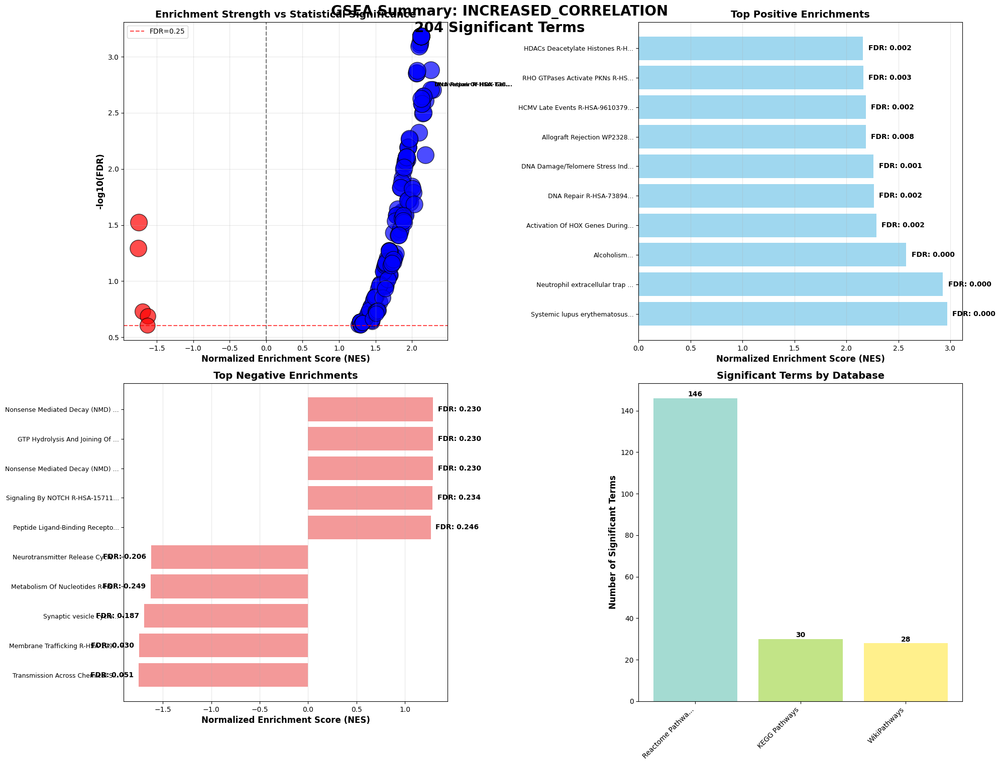

   ✅ Saved database summary plot: /kaggle/working/GSEA_Tumor_Correlation_Hubness/GSEA_increased_correlation_KEGG_2021_Human_summary.pdf (Size: 24.73 KB)
   📊 Displaying database summary plot for KEGG Pathways


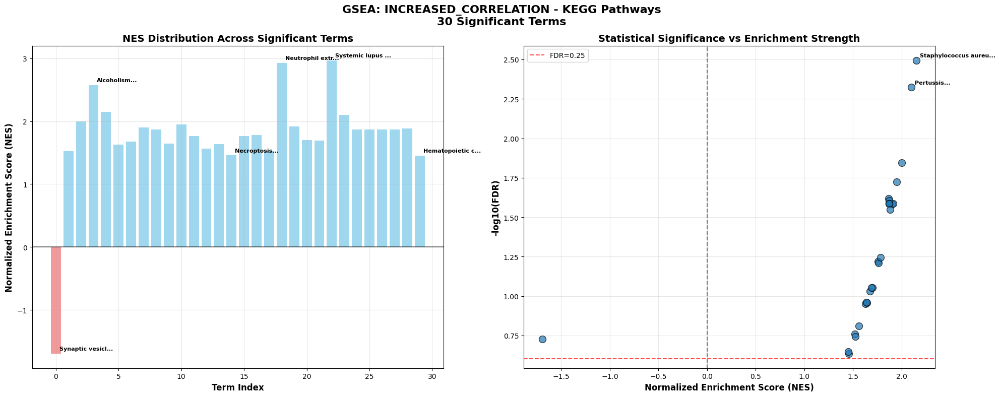

   ✅ KEGG Pathways: 30 terms visualized
   ✅ Saved database summary plot: /kaggle/working/GSEA_Tumor_Correlation_Hubness/GSEA_increased_correlation_Reactome_2022_summary.pdf (Size: 31.62 KB)
   📊 Displaying database summary plot for Reactome Pathways


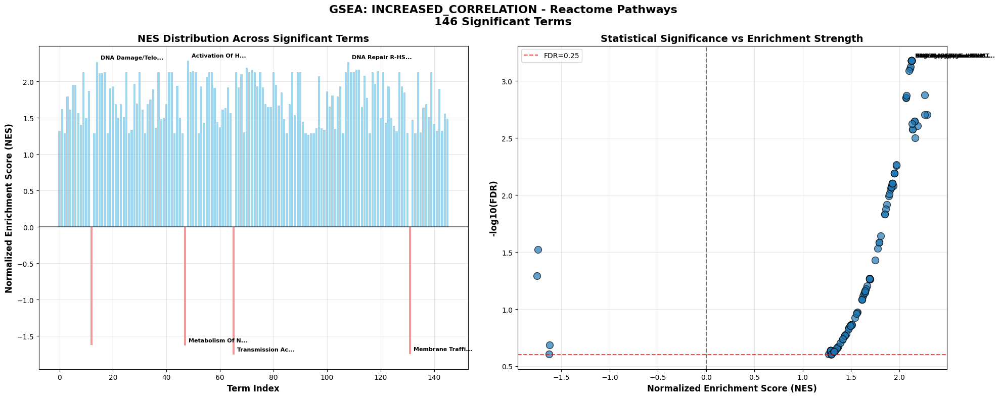

   ✅ Reactome Pathways: 146 terms visualized
   ✅ Saved database summary plot: /kaggle/working/GSEA_Tumor_Correlation_Hubness/GSEA_increased_correlation_WikiPathways_2019_Human_summary.pdf (Size: 26.07 KB)
   📊 Displaying database summary plot for WikiPathways


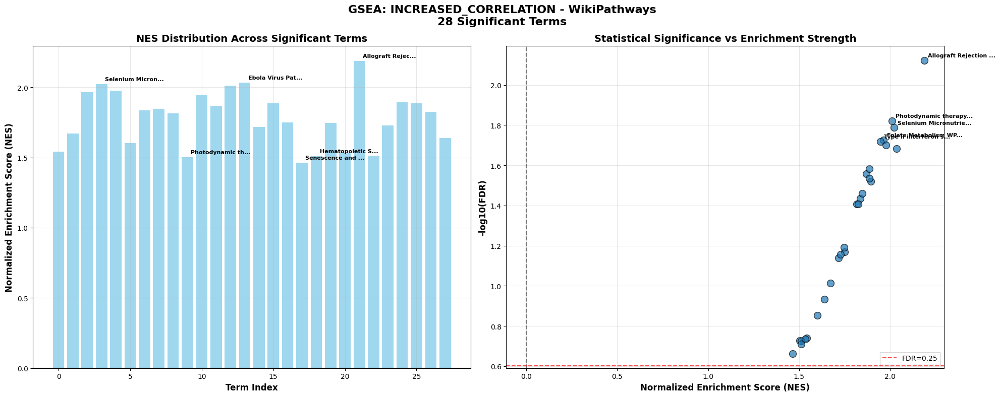

   ✅ WikiPathways: 28 terms visualized

📊 Creating GSEA visualizations for DECREASED_CORRELATION...
   ✅ Saved GSEA summary plot: /kaggle/working/GSEA_Tumor_Correlation_Hubness/GSEA_Summary_decreased_correlation.pdf (Size: 67.51 KB)
   📊 Displaying GSEA summary plot for decreased_correlation


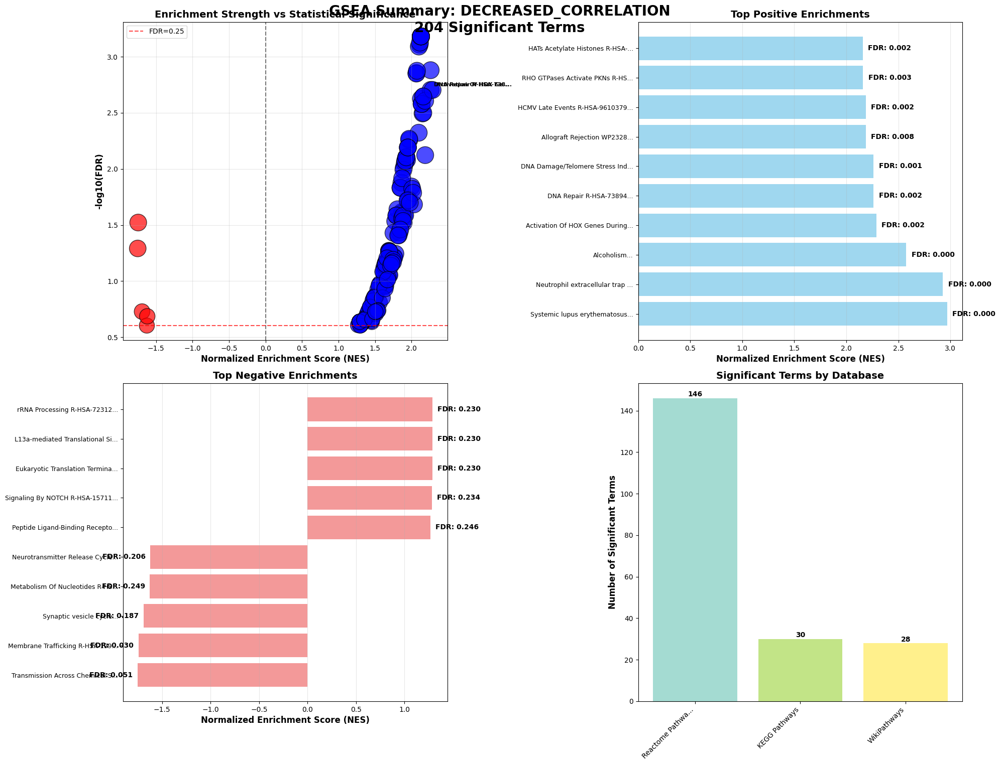

   ✅ Saved database summary plot: /kaggle/working/GSEA_Tumor_Correlation_Hubness/GSEA_decreased_correlation_KEGG_2021_Human_summary.pdf (Size: 24.76 KB)
   📊 Displaying database summary plot for KEGG Pathways


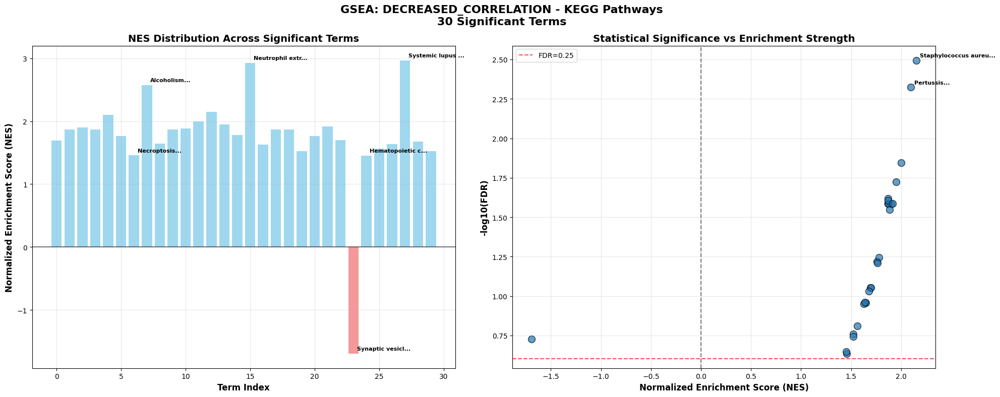

   ✅ KEGG Pathways: 30 terms visualized
   ✅ Saved database summary plot: /kaggle/working/GSEA_Tumor_Correlation_Hubness/GSEA_decreased_correlation_Reactome_2022_summary.pdf (Size: 31.51 KB)
   📊 Displaying database summary plot for Reactome Pathways


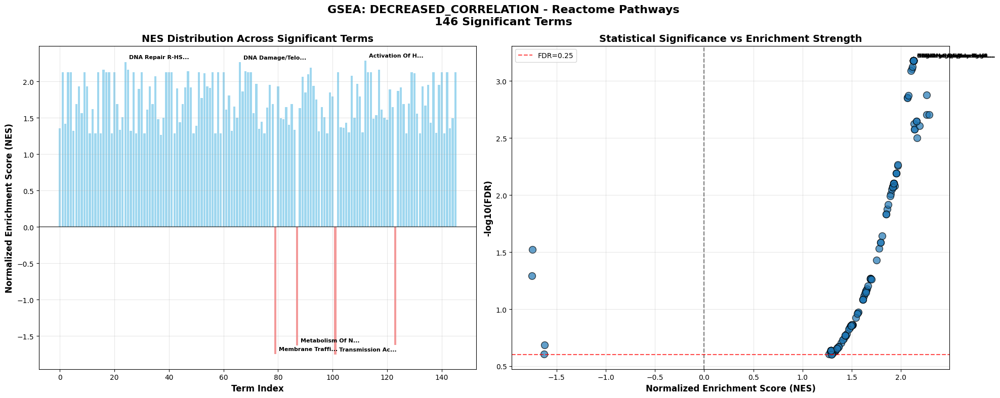

   ✅ Reactome Pathways: 146 terms visualized
   ✅ Saved database summary plot: /kaggle/working/GSEA_Tumor_Correlation_Hubness/GSEA_decreased_correlation_WikiPathways_2019_Human_summary.pdf (Size: 26.06 KB)
   📊 Displaying database summary plot for WikiPathways


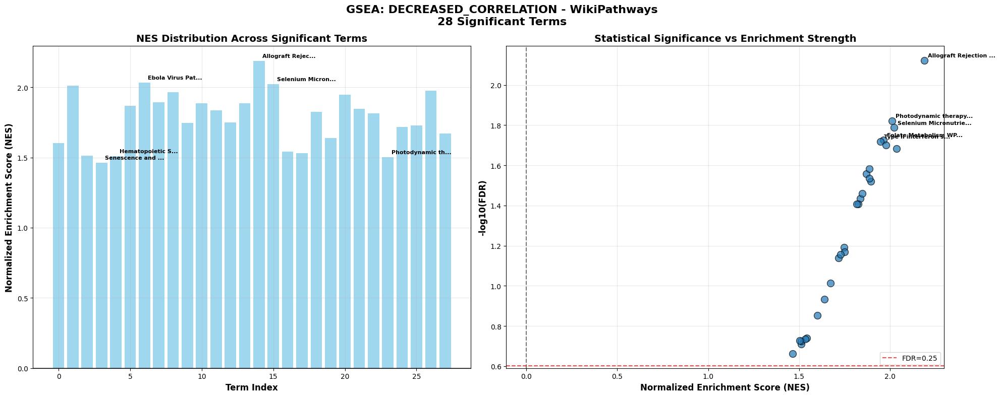

   ✅ WikiPathways: 28 terms visualized

📊 Creating GSEA visualizations for INCREASED_HUBNESS...
   ✅ Saved GSEA summary plot: /kaggle/working/GSEA_Tumor_Correlation_Hubness/GSEA_Summary_increased_hubness.pdf (Size: 67.96 KB)
   📊 Displaying GSEA summary plot for increased_hubness


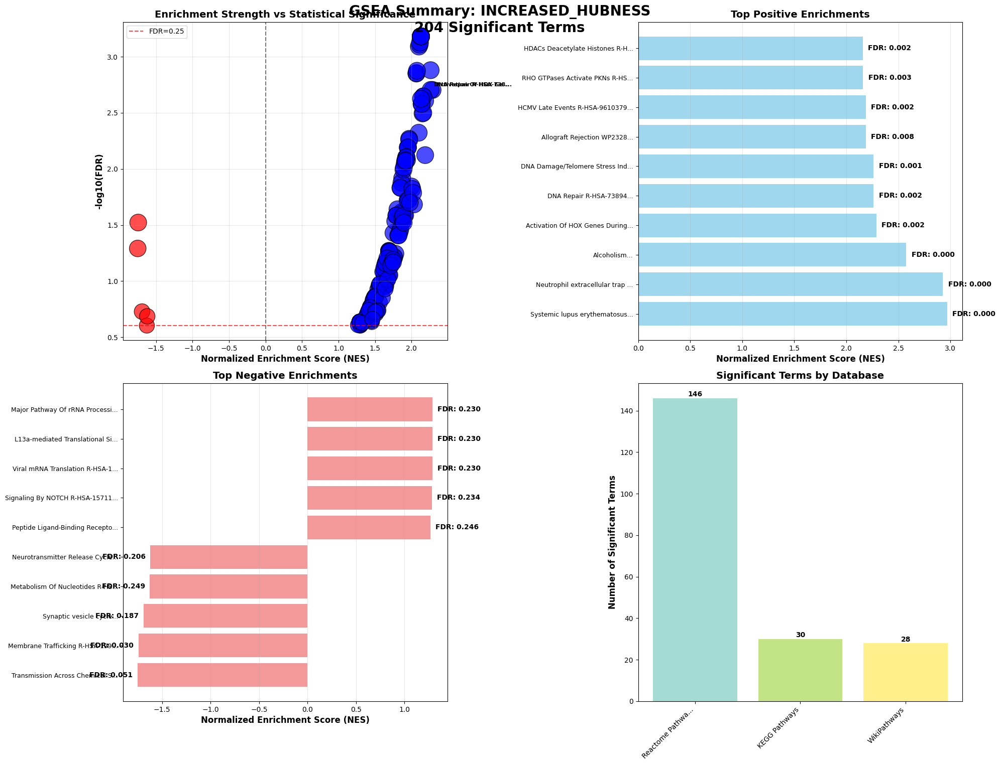

   ✅ Saved database summary plot: /kaggle/working/GSEA_Tumor_Correlation_Hubness/GSEA_increased_hubness_KEGG_2021_Human_summary.pdf (Size: 24.92 KB)
   📊 Displaying database summary plot for KEGG Pathways


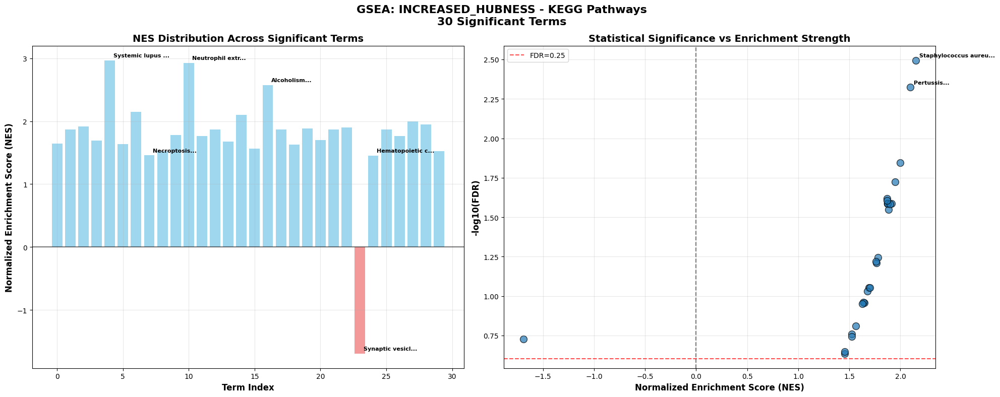

   ✅ KEGG Pathways: 30 terms visualized
   ✅ Saved database summary plot: /kaggle/working/GSEA_Tumor_Correlation_Hubness/GSEA_increased_hubness_Reactome_2022_summary.pdf (Size: 31.48 KB)
   📊 Displaying database summary plot for Reactome Pathways


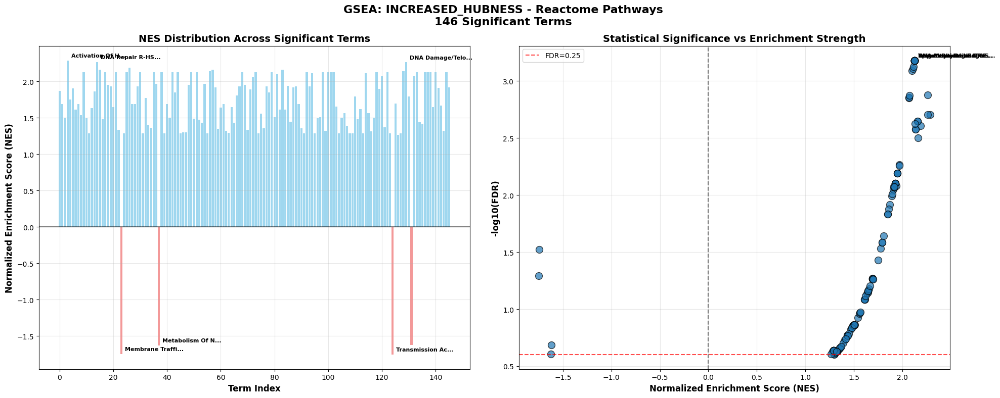

   ✅ Reactome Pathways: 146 terms visualized
   ✅ Saved database summary plot: /kaggle/working/GSEA_Tumor_Correlation_Hubness/GSEA_increased_hubness_WikiPathways_2019_Human_summary.pdf (Size: 26.14 KB)
   📊 Displaying database summary plot for WikiPathways


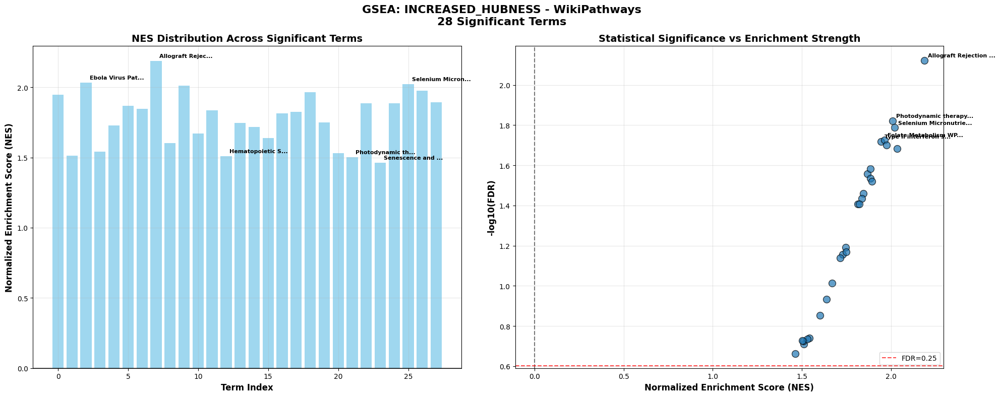

   ✅ WikiPathways: 28 terms visualized

📊 Creating GSEA visualizations for DECREASED_HUBNESS...
   ✅ Saved GSEA summary plot: /kaggle/working/GSEA_Tumor_Correlation_Hubness/GSEA_Summary_decreased_hubness.pdf (Size: 67.80 KB)
   📊 Displaying GSEA summary plot for decreased_hubness


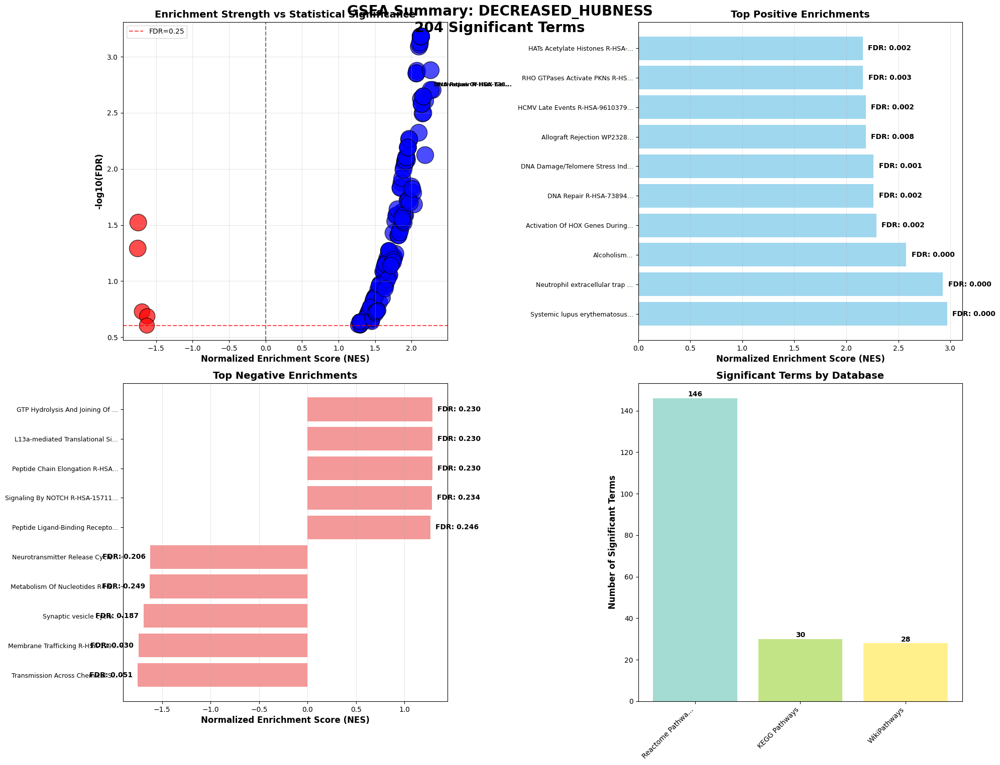

   ✅ Saved database summary plot: /kaggle/working/GSEA_Tumor_Correlation_Hubness/GSEA_decreased_hubness_KEGG_2021_Human_summary.pdf (Size: 24.93 KB)
   📊 Displaying database summary plot for KEGG Pathways


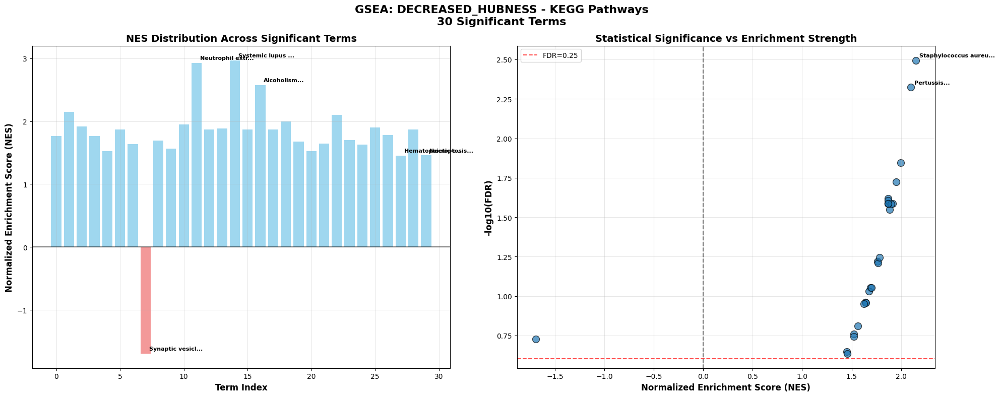

   ✅ KEGG Pathways: 30 terms visualized
   ✅ Saved database summary plot: /kaggle/working/GSEA_Tumor_Correlation_Hubness/GSEA_decreased_hubness_Reactome_2022_summary.pdf (Size: 31.44 KB)
   📊 Displaying database summary plot for Reactome Pathways


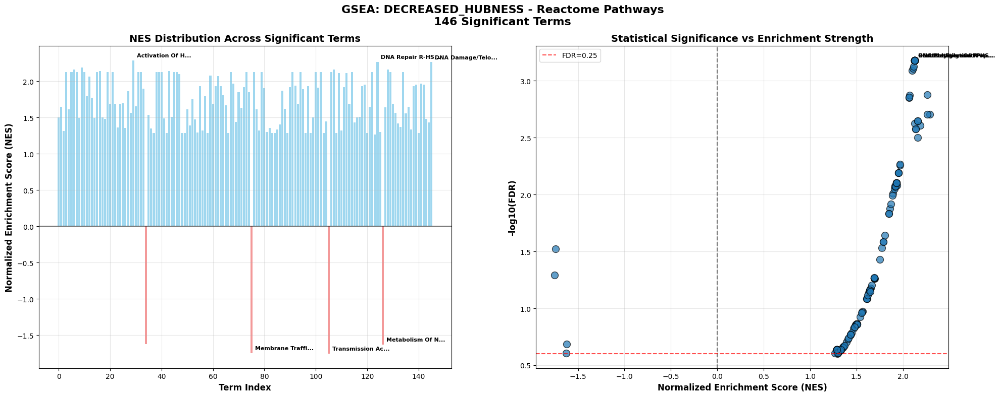

   ✅ Reactome Pathways: 146 terms visualized
   ✅ Saved database summary plot: /kaggle/working/GSEA_Tumor_Correlation_Hubness/GSEA_decreased_hubness_WikiPathways_2019_Human_summary.pdf (Size: 26.17 KB)
   📊 Displaying database summary plot for WikiPathways


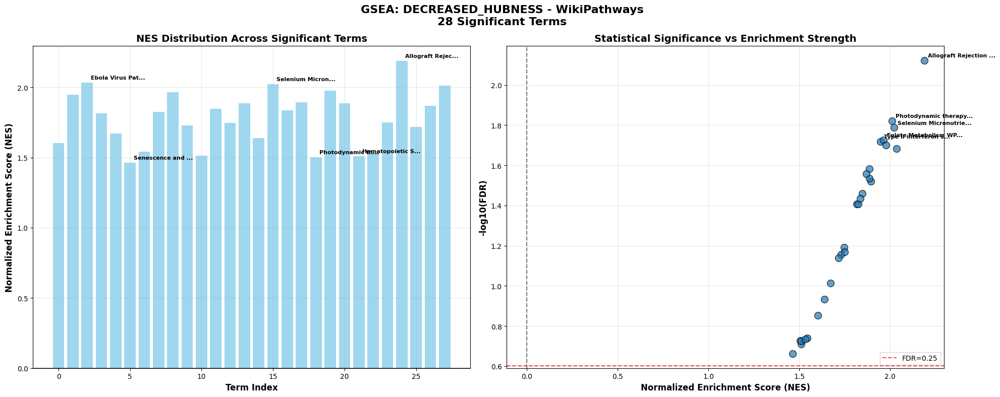

   ✅ WikiPathways: 28 terms visualized

📁 Files in GSEA_Tumor_Correlation_Hubness:
   - GSEA_decreased_correlation_Reactome_2022_summary.pdf (Size: 31.51 KB)
   - GSEA_Summary_increased_correlation.pdf (Size: 68.60 KB)
   - GSEA_Summary_decreased_correlation.pdf (Size: 67.51 KB)
   - GSEA_increased_hubness_WikiPathways_2019_Human_summary.pdf (Size: 26.14 KB)
   - GSEA_increased_hubness_KEGG_2021_Human_summary.pdf (Size: 24.92 KB)
   - GSEA_Summary_decreased_hubness.pdf (Size: 67.80 KB)
   - GSEA_decreased_hubness_WikiPathways_2019_Human_summary.pdf (Size: 26.17 KB)
   - GSEA_increased_hubness_Reactome_2022_summary.pdf (Size: 31.48 KB)
   - GSEA_decreased_correlation_KEGG_2021_Human_summary.pdf (Size: 24.76 KB)
   - GSEA_increased_correlation_KEGG_2021_Human_summary.pdf (Size: 24.73 KB)
   - GSEA_decreased_hubness_Reactome_2022_summary.pdf (Size: 31.44 KB)
   - GSEA_decreased_correlation_WikiPathways_2019_Human_summary.pdf (Size: 26.06 KB)
   - GSEA_increased_correlation_Reactome_2022_s

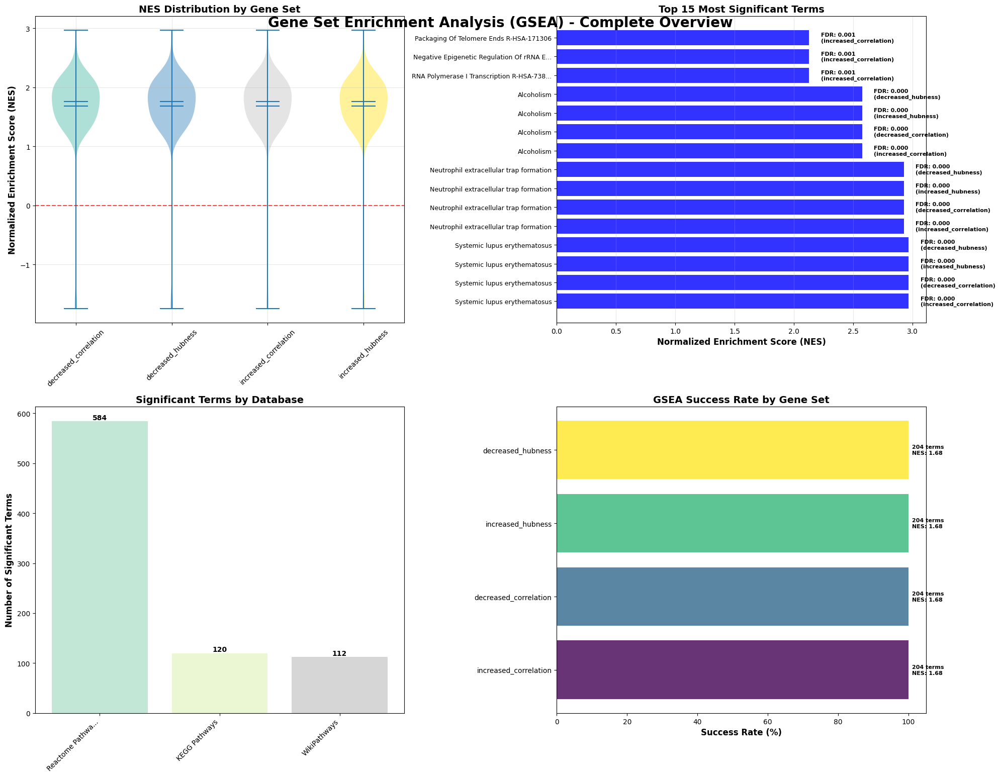


GENE SET ENRICHMENT ANALYSIS (GSEA) COMPLETE! ✅


In [20]:
# Enable inline plotting in Jupyter
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap
import gseapy as gp
import warnings
import os
from scipy import stats
import logging

# Check versions and environment
print(f"pandas version: {pd.__version__}")
if pd.__version__.startswith('2.'):
    print("Note: Using pandas 2.0+, DataFrame.append is deprecated. Using pd.concat instead.")
print(f"matplotlib version: {matplotlib.__version__}")
print(f"Current working directory: {os.getcwd()}")
print(f"Matplotlib backend: {matplotlib.get_backend()}")

warnings.filterwarnings('ignore')
logging.basicConfig(level=logging.INFO)

# Configuration flag to control whether plots are displayed on-screen
DISPLAY_PLOTS = True  # Set to True to display plots in Jupyter

print("=" * 70)
print("GENE SET ENRICHMENT ANALYSIS (GSEA) - STEP 2")
print("=" * 70)

def load_gene_sets():
    """Load the provided gene sets for GSEA"""
    print("\n📁 Loading gene sets for GSEA...")
    
    gene_sets = {
        'increased_correlation': [
            'FGFBP2', 'SEZ6', 'MOXD1', 'SERPINE1', 'AGAP2',
            'ENTPD2', 'LGI4', 'ARSI', 'PAMR1', 'RPRM'
        ],
        'decreased_correlation': [
            'CAMK2A', 'SLC24A2', 'PPP1R16B', 'SYT1', 'TPPP',
            'KCNJ9', 'LRRC17', 'NFASC', 'MFAP4', 'KIF1A'
        ],
        'increased_hubness': [
            'NEFL', 'JPH4', 'VSNL1', 'RGS4', 'SMIM3',
            'LGALS3', 'SLC17A7', 'FMOD', 'AZGP1', 'AGAP2'
        ],
        'decreased_hubness': [
            'AK5', 'KCNJ9', 'CAMKV', 'TMEM130', 'KIF5A',
            'CPLX2', 'CAMK2A', 'RAB3A', 'SNCB', 'FBXL16'
        ]
    }
    
    for set_name, genes in gene_sets.items():
        print(f"   ✅ {set_name}: {len(genes)} genes")
    
    return gene_sets

def load_preranked_data():
    """Load the preranked data for GSEA"""
    print("\n📁 Loading preranked data for GSEA...")
    
    try:
        if os.path.exists('GSEA_preranked.rnk'):
            try:
                prerank_df = pd.read_csv('GSEA_preranked.rnk', sep='\t', header=None, names=['gene', 'metric'])
            except:
                prerank_df = pd.read_csv('GSEA_preranked.rnk', sep=',', header=None, names=['gene', 'metric'])
            
            prerank_df['metric'] = pd.to_numeric(prerank_df['metric'], errors='coerce')
            if prerank_df['metric'].isna().any():
                print(f"   ⚠️ Warning: {prerank_df['metric'].isna().sum()} non-numeric metrics found")
                prerank_df = prerank_df.dropna()
            
            print(f"   ✅ Preranked data: {len(prerank_df)} genes")
            print(f"   📈 Metric range: {prerank_df['metric'].min():.3f} to {prerank_df['metric'].max():.3f}")
            
            return prerank_df
        else:
            print("   ❌ GSEA_preranked.rnk not found")
            return None
            
    except Exception as e:
        print(f"❌ Error loading preranked data: {e}")
        return None

def check_available_databases_gsea():
    """Check which databases are available for GSEA"""
    print("\n🔍 CHECKING AVAILABLE DATABASES FOR GSEA")
    print("-" * 50)
    
    try:
        available_dbs = gp.get_library_name()
        print(f"📚 Found {len(available_dbs)} available databases")
        
        pathway_dbs = [db for db in available_dbs if any(x in db for x in ['KEGG', 'Reactome', 'WikiPathways'])]
        if pathway_dbs:
            print("📊 Available pathway databases:")
            for db in pathway_dbs[:5]:
                print(f"   - {db}")
                
        return available_dbs
        
    except Exception as e:
        print(f"❌ Error checking databases: {e}")
        return []

def get_updated_databases_gsea(available_dbs):
    """Get updated database list for GSEA based on availability"""
    
    preferred_dbs = {
        'KEGG_2021_Human': 'KEGG Pathways',
        'Reactome_2022': 'Reactome Pathways', 
        'WikiPathways_2021_Human': 'WikiPathways'
    }
    
    db_alternatives = {
        'KEGG_2021_Human': ['KEGG_2019_Human', 'KEGG_2016'],
        'Reactome_2022': ['Reactome_2016', 'Reactome_2015'],
        'WikiPathways_2021_Human': ['WikiPathways_2019_Human', 'WikiPathways_2016']
    }
    
    updated_dbs = {}
    for db_key, db_desc in preferred_dbs.items():
        if db_key in available_dbs:
            updated_dbs[db_key] = db_desc
            print(f"   ✅ {db_desc}: Available")
        else:
            found_alternative = False
            if db_key in db_alternatives:
                for alt_db in db_alternatives[db_key]:
                    if alt_db in available_dbs:
                        updated_dbs[alt_db] = db_desc
                        print(f"   🔄 {db_desc}: Using {alt_db} instead")
                        found_alternative = True
                        break
            if not found_alternative:
                print(f"   ❌ {db_desc}: No alternatives found")
    
    return updated_dbs

def get_gsea_column_names(results):
    """Identify the correct column names for GSEA results"""
    column_mapping = {}
    
    possible_columns = {
        'fdr': ['fdr', 'FDR', 'adjp', 'adj_pval', 'padj', 'qval', 'q-value'],
        'nes': ['nes', 'NES', 'normalized_enrichment_score'],
        'es': ['es', 'ES', 'enrichment_score']
    }
    
    if isinstance(results, dict):
        sample_term = next(iter(results.values()))
        available_columns = sample_term.keys()
    else:
        available_columns = results.columns.tolist()
    
    for standard_name, possible_names in possible_columns.items():
        for possible_name in possible_names:
            if possible_name in available_columns:
                column_mapping[standard_name] = possible_name
                break
        if standard_name not in column_mapping:
            print(f"   ⚠️ Warning: Could not find column for {standard_name}")
    
    return column_mapping

def perform_comprehensive_gsea(prerank_df, gene_sets):
    """Perform comprehensive GSEA analysis using preranked data"""
    print("\n🎯 PERFORMING COMPREHENSIVE GENE SET ENRICHMENT ANALYSIS")
    print("-" * 60)
    
    gsea_results = {}
    summary_stats = {}
    
    available_dbs = check_available_databases_gsea()
    databases = get_updated_databases_gsea(available_dbs)
    
    if not databases:
        print("❌ No valid databases found for GSEA")
        return {}, {}
    
    print(f"\n📊 Using {len(databases)} databases for GSEA:")
    for db_name, db_desc in databases.items():
        print(f"   • {db_desc} ({db_name})")
    
    for set_name, genes in gene_sets.items():
        if set_name == 'background':
            continue
            
        print(f"\n🔬 Running GSEA for {set_name.upper()}...")
        print("-" * 40)
        
        set_results = {}
        set_stats = {
            'total_genes': len(genes),
            'significant_terms': 0,
            'databases_with_results': 0
        }
        
        for db_name, db_description in databases.items():
            try:
                print(f"   📊 Testing {db_description}...")
                
                gsea_res = gp.prerank(
                    rnk=prerank_df,
                    gene_sets=db_name,
                    processes=4,
                    permutation_num=1000,
                    outdir=None,
                    format='png',
                    seed=42,
                    min_size=5,
                    max_size=500
                )
                
                if gsea_res.results is not None and len(gsea_res.results) > 0:
                    if isinstance(gsea_res.results, dict):
                        if all(isinstance(v, dict) for v in gsea_res.results.values()):
                            results_df = pd.DataFrame.from_dict(gsea_res.results, orient='index')
                        else:
                            print(f"   ❌ {db_description}: Invalid results structure")
                            continue
                    else:
                        results_df = gsea_res.results
                    
                    column_map = get_gsea_column_names(results_df)
                    
                    if 'fdr' not in column_map or 'nes' not in column_map:
                        print(f"   ⚠️ {db_description}: Missing required columns in results")
                        continue
                    
                    fdr_col = column_map['fdr']
                    nes_col = column_map['nes']
                    es_col = column_map.get('es', 'es')
                    
                    sig_results = results_df[
                        (results_df[fdr_col] < 0.25) & 
                        (results_df[nes_col].abs() > 1.0)
                    ]
                    
                    if len(sig_results) > 0:
                        set_results[db_name] = {
                            'description': db_description,
                            'all_terms': results_df,
                            'significant_terms': sig_results,
                            'num_significant': len(sig_results),
                            'gsea_object': gsea_res,
                            'column_map': column_map
                        }
                        
                        set_stats['significant_terms'] += len(sig_results)
                        set_stats['databases_with_results'] += 1
                        
                        print(f"   ✅ {db_description}: {len(sig_results)} significant terms")
                        top_terms = sig_results.head(3)
                        for i, (term_name, term) in enumerate(top_terms.iterrows()):
                            nes = term[nes_col]
                            fdr = term[fdr_col]
                            direction = "up" if nes > 0 else "down"
                            print(f"      {i+1}. {term_name[:50]}... (NES: {nes:.2f}, FDR: {fdr:.3f}, {direction}-regulated)")
                    else:
                        print(f"   ⚠️ {db_description}: No terms pass FDR < 0.25 and |NES| > 1.0")
                else:
                    print(f"   ❌ {db_description}: No results returned")
                    
            except Exception as e:
                print(f"   ❌ Error in {db_description}: {str(e)}")
        
        if set_results:
            gsea_results[set_name] = set_results
            summary_stats[set_name] = set_stats
            print(f"   🎯 SUMMARY: {set_stats['databases_with_results']} databases with {set_stats['significant_terms']} total significant terms")
        else:
            print(f"   ⚠️ No significant GSEA results for {set_name}")
    
    return gsea_results, summary_stats

def create_gsea_visualizations(gsea_results, prerank_df, output_dir="GSEA_Tumor_Correlation_Hubness"):
    """Create comprehensive GSEA visualizations"""
    print(f"\n🎨 CREATING COMPREHENSIVE GSEA VISUALIZATIONS")
    print("-" * 50)
    
    if not os.path.exists(output_dir):
        try:
            os.makedirs(output_dir)
            print(f"   ✅ Created output directory: {os.path.abspath(output_dir)}")
        except Exception as e:
            print(f"   ❌ Failed to create output directory {output_dir}: {e}")
            return {}
    
    all_plots = {}
    
    for set_name, databases in gsea_results.items():
        print(f"\n📊 Creating GSEA visualizations for {set_name.upper()}...")
        set_plots = {}
        
        create_gsea_summary_plot(set_name, databases, prerank_df, output_dir)
        
        for db_name, db_data in databases.items():
            try:
                sig_terms = db_data['significant_terms']
                db_description = db_data['description']
                
                if len(sig_terms) == 0:
                    print(f"   ⚠️ No significant terms for {db_description}")
                    continue
                
                create_database_summary_plot(set_name, db_name, db_data, output_dir)
                
                print(f"   ✅ {db_description}: {len(sig_terms)} terms visualized")
                
            except Exception as e:
                print(f"   ❌ Error creating database summary plot for {db_description}: {e}")
        
        all_plots[set_name] = set_plots
    
    if os.path.exists(output_dir):
        print(f"\n📁 Files in {output_dir}:")
        for file in os.listdir(output_dir):
            file_path = os.path.join(output_dir, file)
            file_size = os.path.getsize(file_path) / 1024
            print(f"   - {file} (Size: {file_size:.2f} KB)")
    
    return all_plots

def create_gsea_summary_plot(set_name, databases, prerank_df, output_dir):
    """Create summary plot for GSEA results"""
    try:
        all_terms = []
        for db_name, db_data in databases.items():
            column_map = db_data['column_map']
            fdr_col = column_map['fdr']
            nes_col = column_map['nes']
            es_col = column_map.get('es', 'es')
            
            for term_name, term_data in db_data['significant_terms'].iterrows():
                all_terms.append({
                    'Database': db_data['description'],
                    'Term': term_name,
                    'NES': term_data[nes_col],
                    'FDR': term_data[fdr_col],
                    'ES': term_data[es_col],
                    'Lead_Edge_Size': len(term_data['ledge_genes']) if 'ledge_genes' in term_data else 0
                })
        
        if not all_terms:
            print(f"   ⚠️ No significant terms for {set_name}")
            return
        
        summary_df = pd.DataFrame(all_terms)
        
        fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 16))
        fig.suptitle(f'GSEA Summary: {set_name.upper()}\n{len(summary_df)} Significant Terms', 
                    fontsize=20, fontweight='bold', y=0.95)
        
        colors = ['red' if nes < 0 else 'blue' for nes in summary_df['NES']]
        sizes = 100 + (1 - summary_df['FDR']) * 500
        
        scatter = ax1.scatter(summary_df['NES'], -np.log10(summary_df['FDR']),
                            c=colors, s=sizes, alpha=0.7, edgecolors='black')
        
        ax1.axvline(x=0, color='black', linestyle='--', alpha=0.5)
        ax1.axhline(y=-np.log10(0.25), color='red', linestyle='--', alpha=0.7, label='FDR=0.25')
        ax1.set_xlabel('Normalized Enrichment Score (NES)', fontsize=12, fontweight='bold')
        ax1.set_ylabel('-log10(FDR)', fontsize=12, fontweight='bold')
        ax1.set_title('Enrichment Strength vs Statistical Significance', fontsize=14, fontweight='bold')
        ax1.legend()
        ax1.grid(True, alpha=0.3)
        
        for i, row in summary_df.nlargest(5, 'NES').iterrows():
            ax1.annotate(row['Term'][:20] + '...', 
                        (row['NES'], -np.log10(row['FDR'])),
                        xytext=(5, 5), textcoords='offset points',
                        fontsize=8, fontweight='bold')
        
        top_nes = summary_df.nlargest(10, 'NES')
        y_pos = np.arange(len(top_nes))
        
        bars = ax2.barh(y_pos, top_nes['NES'], color='skyblue', alpha=0.8)
        ax2.set_yticks(y_pos)
        ax2.set_yticklabels([term[:30] + '...' for term in top_nes['Term']], fontsize=9)
        ax2.set_xlabel('Normalized Enrichment Score (NES)', fontsize=12, fontweight='bold')
        ax2.set_title('Top Positive Enrichments', fontsize=14, fontweight='bold')
        ax2.grid(True, alpha=0.3, axis='x')
        
        for i, bar in enumerate(bars):
            width = bar.get_width()
            fdr = top_nes.iloc[i]['FDR']
            ax2.text(width + 0.05 * (1 if width > 0 else -1), bar.get_y() + bar.get_height()/2,
                   f'FDR: {fdr:.3f}', ha='left' if width > 0 else 'right', va='center', fontweight='bold')
        
        bottom_nes = summary_df.nsmallest(10, 'NES')
        if len(bottom_nes) > 0:
            y_pos = np.arange(len(bottom_nes))
            
            bars = ax3.barh(y_pos, bottom_nes['NES'], color='lightcoral', alpha=0.8)
            ax3.set_yticks(y_pos)
            ax3.set_yticklabels([term[:30] + '...' for term in bottom_nes['Term']], fontsize=9)
            ax3.set_xlabel('Normalized Enrichment Score (NES)', fontsize=12, fontweight='bold')
            ax3.set_title('Top Negative Enrichments', fontsize=14, fontweight='bold')
            ax3.grid(True, alpha=0.3, axis='x')
            
            for i, bar in enumerate(bars):
                width = bar.get_width()
                fdr = bottom_nes.iloc[i]['FDR']
                ax3.text(width + 0.05 * (1 if width > 0 else -1), bar.get_y() + bar.get_height()/2,
                       f'FDR: {fdr:.3f}', ha='left' if width > 0 else 'right', va='center', fontweight='bold')
        
        db_counts = summary_df['Database'].value_counts()
        colors = plt.cm.Set3(np.linspace(0, 1, len(db_counts)))
        
        bars = ax4.bar(range(len(db_counts)), db_counts.values, color=colors, alpha=0.8)
        ax4.set_xticks(range(len(db_counts)))
        ax4.set_xticklabels([db[:15] + '...' if len(db) > 15 else db for db in db_counts.index], 
                           rotation=45, ha='right')
        ax4.set_ylabel('Number of Significant Terms', fontsize=12, fontweight='bold')
        ax4.set_title('Significant Terms by Database', fontsize=14, fontweight='bold')
        
        for bar in bars:
            height = bar.get_height()
            ax4.text(bar.get_x() + bar.get_width()/2., height + 0.1,
                    f'{int(height)}', ha='center', va='bottom', fontweight='bold')
        
        plt.tight_layout()
        summary_file = os.path.join(output_dir, f"GSEA_Summary_{set_name}.pdf")
        plt.savefig(summary_file, dpi=300, bbox_inches='tight')
        if os.path.exists(summary_file):
            file_size = os.path.getsize(summary_file) / 1024
            print(f"   ✅ Saved GSEA summary plot: {os.path.abspath(summary_file)} (Size: {file_size:.2f} KB)")
        else:
            print(f"   ❌ Failed to save GSEA summary plot: {summary_file}")
        
        if DISPLAY_PLOTS:
            print(f"   📊 Displaying GSEA summary plot for {set_name}")
            plt.show()
        
        plt.close()
        
    except Exception as e:
        print(f"   ❌ Error creating GSEA summary plot for {set_name}: {e}")

def create_database_summary_plot(set_name, db_name, db_data, output_dir):
    """Create database-specific summary plot"""
    try:
        sig_terms = db_data['significant_terms']
        db_description = db_data['description']
        column_map = db_data['column_map']
        
        fdr_col = column_map['fdr']
        nes_col = column_map['nes']
        
        if len(sig_terms) == 0:
            print(f"   ⚠️ No significant terms for {db_description}")
            return
        
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))
        fig.suptitle(f'GSEA: {set_name.upper()} - {db_description}\n{len(sig_terms)} Significant Terms', 
                    fontsize=16, fontweight='bold')
        
        nes_values = sig_terms[nes_col]
        colors = ['lightcoral' if x < 0 else 'skyblue' for x in nes_values]
        
        bars = ax1.bar(range(len(nes_values)), nes_values, color=colors, alpha=0.8)
        ax1.set_xlabel('Term Index', fontsize=12, fontweight='bold')
        ax1.set_ylabel('Normalized Enrichment Score (NES)', fontsize=12, fontweight='bold')
        ax1.set_title('NES Distribution Across Significant Terms', fontsize=14, fontweight='bold')
        ax1.axhline(y=0, color='black', linestyle='-', alpha=0.5)
        ax1.grid(True, alpha=0.3)
        
        extreme_terms = pd.concat([sig_terms.nlargest(3, nes_col), sig_terms.nsmallest(3, nes_col)])
        for i, (term_name, term_data) in enumerate(extreme_terms.iterrows()):
            if term_name in sig_terms.index:
                idx = list(sig_terms.index).index(term_name)
                ax1.annotate(term_name[:15] + '...', 
                           (idx, term_data[nes_col]),
                           xytext=(5, 5), textcoords='offset points',
                           fontsize=8, fontweight='bold')
        
        scatter = ax2.scatter(sig_terms[nes_col], -np.log10(sig_terms[fdr_col]),
                            s=100, alpha=0.7, edgecolors='black')
        ax2.set_xlabel('Normalized Enrichment Score (NES)', fontsize=12, fontweight='bold')
        ax2.set_ylabel('-log10(FDR)', fontsize=12, fontweight='bold')
        ax2.set_title('Statistical Significance vs Enrichment Strength', fontsize=14, fontweight='bold')
        ax2.axvline(x=0, color='black', linestyle='--', alpha=0.5)
        ax2.axhline(y=-np.log10(0.25), color='red', linestyle='--', alpha=0.7, label='FDR=0.25')
        ax2.legend()
        ax2.grid(True, alpha=0.3)
        
        top_terms = sig_terms.nsmallest(5, fdr_col)
        for term_name, term_data in top_terms.iterrows():
            ax2.annotate(term_name[:20] + '...', 
                       (term_data[nes_col], -np.log10(term_data[fdr_col])),
                       xytext=(5, 5), textcoords='offset points',
                       fontsize=8, fontweight='bold')
        
        plt.tight_layout()
        plot_file = os.path.join(output_dir, f"GSEA_{set_name}_{db_name}_summary.pdf")
        plt.savefig(plot_file, dpi=300, bbox_inches='tight')
        if os.path.exists(plot_file):
            file_size = os.path.getsize(plot_file) / 1024
            print(f"   ✅ Saved database summary plot: {os.path.abspath(plot_file)} (Size: {file_size:.2f} KB)")
        else:
            print(f"   ❌ Failed to save database summary plot: {plot_file}")
        
        if DISPLAY_PLOTS:
            print(f"   📊 Displaying database summary plot for {db_description}")
            plt.show()
        
        plt.close()
        
    except Exception as e:
        print(f"   ❌ Error creating database summary plot for {db_description}: {e}")

def create_gsea_comprehensive_report(gsea_results, summary_stats, prerank_df):
    """Create comprehensive GSEA report"""
    print(f"\n📋 CREATING COMPREHENSIVE GSEA REPORT")
    print("-" * 50)
    
    all_terms = []
    
    for set_name, databases in gsea_results.items():
        for db_name, db_data in databases.items():
            column_map = db_data['column_map']
            fdr_col = column_map['fdr']
            nes_col = column_map['nes']
            es_col = column_map.get('es', 'es')
            
            for term_name, term_data in db_data['significant_terms'].iterrows():
                all_terms.append({
                    'Gene_Set': set_name,
                    'Database': db_data['description'],
                    'Term': term_name,
                    'NES': term_data[nes_col],
                    'ES': term_data[es_col],
                    'FDR': term_data[fdr_col],
                    'Leading_Edge_Size': len(term_data['ledge_genes']) if 'ledge_genes' in term_data else 0,
                    'Leading_Edge_Genes': ', '.join(term_data['ledge_genes']) if 'ledge_genes' in term_data else 'NA'
                })
    
    if all_terms:
        summary_df = pd.DataFrame(all_terms)
        
        summary_df['NES_abs'] = summary_df['NES'].abs()
        summary_df = summary_df.sort_values(['NES_abs', 'FDR'], ascending=[False, True])
        summary_df = summary_df.drop('NES_abs', axis=1)
        
        os.makedirs('GSEA_Tumor_Correlation_Hubness', exist_ok=True)
        results_file = os.path.join('GSEA_Tumor_Correlation_Hubness', 'GSEA_Complete_Results.csv')
        summary_df.to_csv(results_file, index=False)
        if os.path.exists(results_file):
            file_size = os.path.getsize(results_file) / 1024
            print(f"   ✅ Saved GSEA results: {os.path.abspath(results_file)} (Size: {file_size:.2f} KB)")
        else:
            print(f"   ❌ Failed to save GSEA results: {results_file}")
        
        print(f"✅ Complete GSEA results saved: {len(summary_df)} significant terms")
        
        create_gsea_overview_visualization(summary_df, summary_stats)
        
        return summary_df
    else:
        print("❌ No significant terms found in GSEA analysis")
        return pd.DataFrame()

def create_gsea_overview_visualization(summary_df, summary_stats):
    """Create overview visualization of all GSEA results"""
    print("\n📊 Creating GSEA overview visualization...")
    
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 16))
    fig.suptitle('Gene Set Enrichment Analysis (GSEA) - Complete Overview', 
                fontsize=20, fontweight='bold', y=0.95)
    
    try:
        if len(summary_df) > 0:
            nes_by_set = summary_df.groupby('Gene_Set')['NES'].apply(list)
            
            violin_parts = ax1.violinplot(nes_by_set.values, showmeans=True, showmedians=True)
            ax1.set_xticks(range(1, len(nes_by_set) + 1))
            ax1.set_xticklabels(nes_by_set.index, rotation=45)
            ax1.set_ylabel('Normalized Enrichment Score (NES)', fontsize=12, fontweight='bold')
            ax1.set_title('NES Distribution by Gene Set', fontsize=14, fontweight='bold')
            ax1.axhline(y=0, color='red', linestyle='--', alpha=0.7)
            ax1.grid(True, alpha=0.3)
            
            for pc, color in zip(violin_parts['bodies'], plt.cm.Set3(np.linspace(0, 1, len(nes_by_set)))):
                pc.set_facecolor(color)
                pc.set_alpha(0.7)
        
        if len(summary_df) > 0:
            top_terms = summary_df.nsmallest(15, 'FDR')
            y_pos = np.arange(len(top_terms))
            
            colors = ['red' if nes < 0 else 'blue' for nes in top_terms['NES']]
            
            bars = ax2.barh(y_pos, top_terms['NES'], color=colors, alpha=0.8)
            ax2.set_yticks(y_pos)
            
            clean_terms = []
            for term in top_terms['Term']:
                clean_name = term.split(':')[-1] if ':' in term else term
                clean_name = clean_name.split(' (')[0] if ' (' in clean_name else clean_name
                clean_terms.append(clean_name[:40] + '...' if len(clean_name) > 40 else clean_name)
            
            ax2.set_yticklabels(clean_terms, fontsize=9)
            ax2.set_xlabel('Normalized Enrichment Score (NES)', fontsize=12, fontweight='bold')
            ax2.set_title('Top 15 Most Significant Terms', fontsize=14, fontweight='bold')
            ax2.axvline(x=0, color='black', linestyle='-', alpha=0.5)
            ax2.grid(True, alpha=0.3, axis='x')
            
            for i, bar in enumerate(bars):
                width = bar.get_width()
                fdr = top_terms.iloc[i]['FDR']
                gene_set = top_terms.iloc[i]['Gene_Set']
                
                ax2.text(width + 0.1 * (1 if width > 0 else -1), bar.get_y() + bar.get_height()/2,
                       f'FDR: {fdr:.3f}\n({gene_set})', 
                       ha='left' if width > 0 else 'right', va='center', fontsize=8, fontweight='bold')
        
        if len(summary_df) > 0:
            db_counts = summary_df['Database'].value_counts()
            colors = plt.cm.Pastel2(np.linspace(0, 1, len(db_counts)))
            
            bars = ax3.bar(range(len(db_counts)), db_counts.values, color=colors, alpha=0.8)
            ax3.set_xticks(range(len(db_counts)))
            ax3.set_xticklabels([db[:15] + '...' if len(db) > 15 else db for db in db_counts.index], 
                               rotation=45, ha='right')
            ax3.set_ylabel('Number of Significant Terms', fontsize=12, fontweight='bold')
            ax3.set_title('Significant Terms by Database', fontsize=14, fontweight='bold')
            
            for bar in bars:
                height = bar.get_height()
                ax3.text(bar.get_x() + bar.get_width()/2., height + 0.1,
                        f'{int(height)}', ha='center', va='bottom', fontweight='bold')
        
        if summary_stats:
            success_data = []
            for set_name, stats in summary_stats.items():
                success_rate = (stats['databases_with_results'] / len(stats)) * 100
                set_terms = summary_df[summary_df['Gene_Set'] == set_name]
                avg_nes = set_terms['NES'].mean() if len(set_terms) > 0 else 0
                
                success_data.append({
                    'Gene_Set': set_name,
                    'Success_Rate': success_rate,
                    'Total_Terms': stats['significant_terms'],
                    'Avg_NES': avg_nes
                })
            
            success_df = pd.DataFrame(success_data)
            
            if len(success_df) > 0:
                y_pos = np.arange(len(success_df))
                colors = plt.cm.viridis(np.linspace(0, 1, len(success_df)))
                
                bars = ax4.barh(y_pos, success_df['Success_Rate'], color=colors, alpha=0.8)
                ax4.set_yticks(y_pos)
                ax4.set_yticklabels(success_df['Gene_Set'])
                ax4.set_xlabel('Success Rate (%)', fontsize=12, fontweight='bold')
                ax4.set_title('GSEA Success Rate by Gene Set', fontsize=14, fontweight='bold')
                
                for i, bar in enumerate(bars):
                    width = bar.get_width()
                    total_terms = success_df.iloc[i]['Total_Terms']
                    avg_nes = success_df.iloc[i]['Avg_NES']
                    ax4.text(width + 1, bar.get_y() + bar.get_height()/2,
                           f'{total_terms} terms\nNES: {avg_nes:.2f}', 
                           ha='left', va='center', fontsize=8, fontweight='bold')
        
        plt.tight_layout()
        plot_file = os.path.join('GSEA_Tumor_Correlation_Hubness', 'GSEA_Overview_Summary.pdf')
        plt.savefig(plot_file, dpi=300, bbox_inches='tight')
        if os.path.exists(plot_file):
            file_size = os.path.getsize(plot_file) / 1024
            print(f"   ✅ Saved GSEA overview plot: {os.path.abspath(plot_file)} (Size: {file_size:.2f} KB)")
        else:
            print(f"   ❌ Failed to save GSEA overview plot: {plot_file}")
        
        if DISPLAY_PLOTS:
            print(f"   📊 Displaying GSEA overview plot")
            plt.show()
        
        plt.close()
        
    except Exception as e:
        print(f"❌ Error creating GSEA overview visualization: {e}")

# Main GSEA Analysis
print("🚀 STARTING GENE SET ENRICHMENT ANALYSIS")

gene_sets = load_gene_sets()

if not gene_sets:
    print("❌ No gene sets found.")
    exit()

print("\n" + "="*50)
print("STEP 1: LOADING PRERANKED DATA")
print("="*50)
prerank_df = load_preranked_data()

if prerank_df is None:
    print("❌ No preranked data found. GSEA cannot proceed.")
    print("   Please ensure you have 'GSEA_preranked.rnk' available.")
    exit()

print("\n" + "="*50)
print("STEP 2: GSEA ANALYSIS EXECUTION")
print("="*50)
gsea_results, summary_stats = perform_comprehensive_gsea(prerank_df, gene_sets)

print("\n" + "="*50)
print("STEP 3: GSEA VISUALIZATION")
print("="*50)
if gsea_results:
    gsea_plots = create_gsea_visualizations(gsea_results, prerank_df)
else:
    print("❌ No GSEA results to visualize")
    gsea_plots = {}

print("\n" + "="*50)
print("STEP 4: GSEA SUMMARY AND REPORTING")
print("="*50)
if gsea_results:
    gsea_summary_df = create_gsea_comprehensive_report(gsea_results, summary_stats, prerank_df)
else:
    print("❌ No GSEA results to summarize")
    gsea_summary_df = pd.DataFrame()

print("\n" + "="*70)
print("GENE SET ENRICHMENT ANALYSIS (GSEA) COMPLETE! ✅")
print("="*70)